In [1]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.animation import FuncAnimation
from matplotlib.ticker import LogFormatterMathtext, ScalarFormatter

import scienceplots
plt.style.use(['science'])

from scipy.fft import ifft, fftfreq, rfftfreq, rfft
from scipy.optimize import curve_fit, least_squares

import re
from pathlib import Path


In [2]:
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

In [3]:
def natural_sort_key(s: str):
    """
    Split s into chunks of either
     - float numbers, or
     - non‑numeric substrings.
    This makes sorted(x, key=natural_sort_key) do a numeric sort
    on any embedded decimals.
    """
    parts = re.split(r'(\d+(?:\.\d+)?)', s)
    key = []
    for part in parts:
        if re.fullmatch(r'\d+(?:\.\d+)?', part):
            key.append(float(part))
        else:
            key.append(part)
    return key

In [4]:
# min_ω_Ω0 = 0
# max_ω_Ω0 = 2.1
# N_ω_exp = int(1e4)
# ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp) #defining the y-axis variable we'll be plotting (common grid for all Ω0!)
# inv_kFa_arr = np.array([0.50, 0.96]) # also the unitary one 1/kFa = 0...
# Δ_arr = np.array(['att', 'rep'])
# for inv_kFa in inv_kFa_arr:
#     for Δ in Δ_arr:
#         time_series_path = f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}'
#         Ω0_tF_arr_exp = []
#         for file in sorted(Path(time_series_path).glob('*.csv'), key=lambda x: natural_sort_key(x.name)):
#             match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
#             if match:
#                 Ω0_tF_arr_exp.append(float(match.group(1)))
#         Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
#         N_Ω0_exp = Ω0_tF_arr_exp.size
#         abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))
#         print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')
#         for i, Ω0 in enumerate(Ω0_tF_arr_exp):
#              tus, t_tF, M_exp, M_exp_err = np.loadtxt(time_series_path + f'\\RabiOsc_Omega0EF_{Ω0:.2f}.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
#              t_exp = tus[1:]*1e-6  # Convert microseconds to seconds & ignore 1st timestamp
#              t_tF_exp = t_tF[1:]  #ignore 1st timestamp
#              M_exp_0 = M_exp[1:] #the 0 means the 1st element of the time series is removed prior to FFT (since the time interval is uneven)
#              M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
#              ω_tF_exp_arr = 2*np.pi*rfftfreq(M_exp_0.size, d=t_tF_exp[1]-t_tF_exp[0])
#              ω_tF_arr_interp = ω_Ω0_arr_exp*Ω0_tF_arr_exp[i]
#              abs_M_exp_0_hat_interp[i, :] = np.interp(ω_tF_arr_interp,  
#                  ω_tF_exp_arr,        
#                  np.abs(M_exp_0_hat), 
#                  left=0,
#                  right=0
#              )

#         plt.figure(figsize=(10, 8))
#         # Create a 2x2 subplot grid outside the loops
#         if (inv_kFa == inv_kFa_arr[0]) and (Δ == Δ_arr[0]):
#             fig, axes = plt.subplots(2, 2, figsize=(14, 10))
#             plt.subplots_adjust(left=0.08, right=0.92, top=0.92, bottom=0.08, wspace=0.25, hspace=0.25)
#             subplot_idx = 0

#         ax = axes[int(np.where(inv_kFa_arr == inv_kFa)[0][0]), int(np.where(Δ_arr == Δ)[0][0])]
#         im = ax.imshow(
#             abs_M_exp_0_hat_interp.T, 
#             aspect='auto',
#             cmap='turbo',
#             extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(), ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
#             origin='lower', 
#         )
#         ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(), color='white', linestyles='dashed', label=r'$\omega/\Omega_0=1$')
#         for i, Ω0_tF in enumerate(Ω0_tF_arr_exp):
#             ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(), ymax=ω_Ω0_arr_exp.max(), linestyles='dotted')
#         ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
#         ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
#         ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
#         ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
#         ax.set_title(
#             fr'$1/k_{{\text F}}a_{{\uparrow b}}\approx{inv_kFa:.2f}$, $\hbar\delta\approx E_{{{"a" if Δ == "att" else "r"}}}$'
#         )

#         # Only add colorbar to the last subplot
#         if (inv_kFa == inv_kFa_arr[-1]) and (Δ == Δ_arr[-1]):
#             cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95, label=r'Magnetization Fourier Amplitude $|\int_0^Tdt e^{i\omega t}M(t)|$')
#         if (inv_kFa == inv_kFa_arr[-1]) and (Δ == Δ_arr[-1]):
#             plt.suptitle('Experimental Rabi Oscillation Heat Maps')
#         plt.savefig('Rabi_Osc_Heatmaps_Exp.png', dpi=1000)
#             #plt.show()
#         # plt.imshow(
#         #     abs_M_exp_0_hat_interp.T, 
#         #     aspect='auto',
#         #     cmap='turbo',
#         #     extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(), ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
#         #     origin='lower', 
#         # )

#         # plt.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(), color='white', linestyles='dashed', label=r'$\omega/\Omega_0=1$')
#         # #plt.hlines(y=np.sqrt(Zr), xmin=Ω0_arr_exp.min()*tF, xmax=Ω0_arr_exp.max()*tF, color='green', linestyles='dashed', label=r'$\omega/\Omega_0=\sqrt{Z_a}$')
#         # for i, Ω0_tF in enumerate(Ω0_tF_arr_exp):
#         #     plt.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(), ymax=ω_Ω0_arr_exp.max(), linestyles='dotted', label=fr'$\Omega_0 t_F\approx{Ω0_tF:.2f}$')
#         # #plt.plot(Ω0_arr_theory*tF, off_res_coupling[mask], linewidth=2, label=r'$\omega/\Omega_0=\sqrt{Z_r+\left(\frac{E_r-E_a}{\hbar\Omega_0}\right)^2}$', color='orange', linestyle='--')
#         # #plt.xlim(Ω0_arr_exp.min()*tF, Ω0_arr_exp.max()*tF)
#         # #plt.ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
#         # #plt.plot(Ω0_arr_exp*tF, omega1s/Ω0_arr_exp*tF, 'o-', label=r'$\gamma_1/\Omega_0$', color='red')
#         # #plt.plot(Ω0_arr_exp*tF, omega2s/Ω0_arr_exp*tF, 'o-', label=r'$\gamma_2/\Omega_0$', color='purple')
#         # #plt.plot(Ω0_arr_theory * tF, ω_Ω0_max_locus, color='red', label='Max locus ω/Ω₀ > 1', linestyle='--')
#         # plt.xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
#         # plt.ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
#         # plt.colorbar(label=r'Magnetization Fourier Amplitude $|\int_0^Tdt e^{i\omega t}M(t)|$')
#         # plt.xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
#         # plt.ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
#         # plt.title(
#         #     fr'Experimental Rabi Oscillation Heat Map ($1/k_{{\text F}}a_{{\uparrow b}}\approx{inv_kFa:.2f}$, $\hbar\delta\approx E_{{{"a" if Δ == "att" else "r"}}}$)'
#         # )
#         # # # plt.legend(
#         # # #     loc='upper left',
#         # # #     bbox_to_anchor=(1.2, 1),   
#         # # #     frameon=True,
#         # # #     facecolor='orange',
#         # # #     framealpha=0.5,
#         # # #     edgecolor='red',
#         # # #     fontsize=14,               
#         # # #     handlelength=3,              
#         # # #     handletextpad=1.2,          
#         # # #     borderpad=0.6,               
#         # # #     title='Legend',
#         # # #     title_fontsize=16
#         # # # )
#         # plt.show()

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


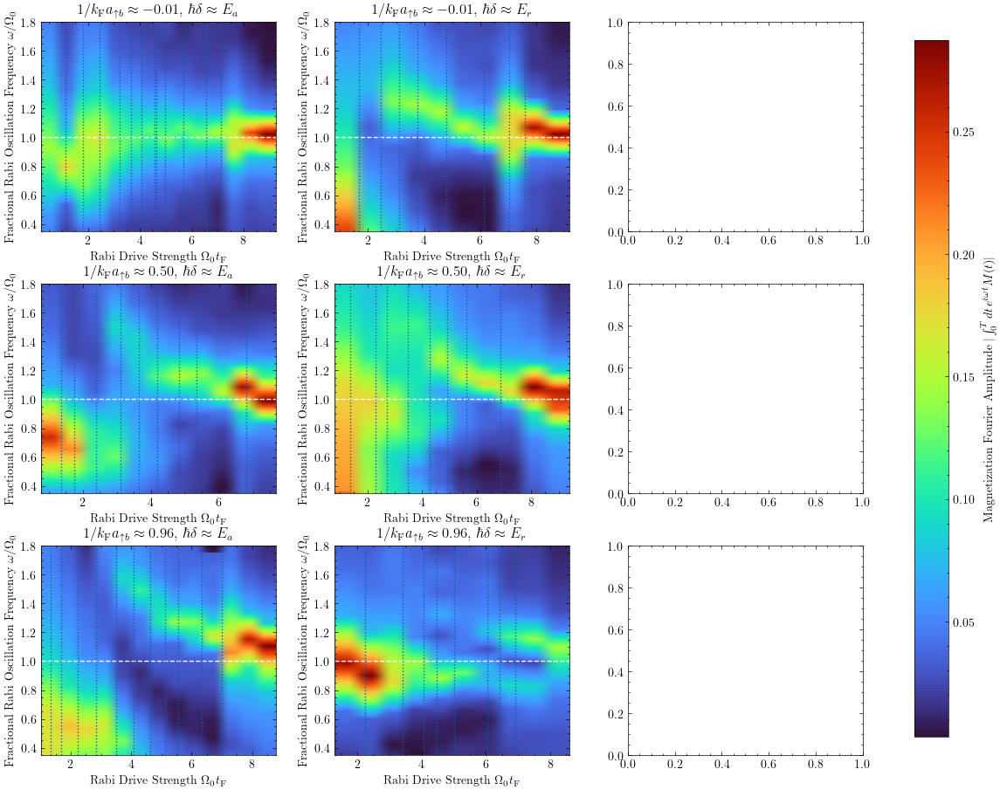

In [112]:
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Create figure & axes grid ---
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
plt.subplots_adjust(left=0.08, right=0.92, top=0.92, bottom=0.08,
                    wspace=0.25, hspace=0.25)

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if 
        text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    for j_det, Δ in enumerate(Δ_arr):
        time_series_path = f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}'
        Ω0_tF_arr_exp = []

        # Collect Ω0_tF values from filenames
        for file in sorted(Path(time_series_path).glob('*.csv'),
                           key=lambda x: natural_sort_key(x.name)):
            match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
            if match:
                Ω0_tF_arr_exp.append(float(match.group(1)))
        Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
        N_Ω0_exp = Ω0_tF_arr_exp.size
        abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

        print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

        # --- Load data & compute Fourier amplitude ---
        for i, Ω0 in enumerate(Ω0_tF_arr_exp):
            tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                time_series_path + f'\\RabiOsc_Omega0EF_{Ω0:.2f}.csv',
                dtype=np.float64, delimiter=',', skiprows=1, unpack=True
            )
            t_exp = tus[1:] * 1e-6
            t_tF_exp = t_tF[1:]
            M_exp_0 = M_exp[1:]

            M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
            ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
            ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

            abs_M_exp_0_hat_interp[i, :] = np.interp(
                ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                left=0, right=0
            )

        # --- Plot ---
        ax = axes[i_inv, j_det]
        im = ax.imshow(
            abs_M_exp_0_hat_interp.T,
            aspect='auto',
            cmap='turbo',
            extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                    ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
            origin='lower',
        )
        ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                  color='white', linestyles='dashed')
        for Ω0_tF in Ω0_tF_arr_exp:
            ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                      ymax=ω_Ω0_arr_exp.max(), linestyles='dotted')

        ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
        ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
        ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
        ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
        ax.set_title(
            fr'$1/k_{{\text F}}a_{{\uparrow b}}\approx{inv_kFa:.2f}$, '
            fr'$\hbar\delta\approx E_{Δ}$'
        )

# --- Shared colorbar & title ---
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95,
                    label=r'Magnetization Fourier Amplitude $|\int_0^T dt\, e^{i\omega t}M(t)|$')
#fig.suptitle('Experimental Rabi Oscillation Heat Maps')

# --- Save correctly ---
# fig.savefig('Rabi_Osc_Heatmaps_Exp.png', dpi=1000)
# plt.close(fig)


In [6]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.animation import FuncAnimation
from matplotlib.ticker import LogFormatterMathtext, ScalarFormatter

import scienceplots
plt.style.use(['science'])

from scipy.fft import ifft, fftfreq, rfftfreq, rfft
from scipy.optimize import curve_fit, least_squares

import re
from pathlib import Path

In [7]:
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e3)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Find max N_Ω0_exp across all (inv_kFa, Δ) for consistent shape ---
N_Ω0_exp_max = 0
Ω0_tF_arr_exp_dict = {}
for inv_kFa in inv_kFa_arr:
    for Δ in Δ_arr:
        time_series_path = f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}'
        Ω0_tF_arr_exp = []
        for file in sorted(Path(time_series_path).glob('*.csv'),
                           key=lambda x: natural_sort_key(x.name)):
            match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
            if match:
                Ω0_tF_arr_exp.append(float(match.group(1)))
        Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
        Ω0_tF_arr_exp_dict[(inv_kFa, Δ)] = Ω0_tF_arr_exp
        if Ω0_tF_arr_exp.size > N_Ω0_exp_max:
            N_Ω0_exp_max = Ω0_tF_arr_exp.size

# --- Preallocate output array ---
abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp_max, N_ω_exp, len(inv_kFa_arr), len(Δ_arr)))

# --- Fill the array ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    for j_det, Δ in enumerate(Δ_arr):
        time_series_path = f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}'
        Ω0_tF_arr_exp = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
        N_Ω0_exp = Ω0_tF_arr_exp.size

        for i, Ω0 in enumerate(Ω0_tF_arr_exp):
            tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                time_series_path + f'\\RabiOsc_Omega0EF_{Ω0:.2f}.csv',
                dtype=np.float64, delimiter=',', skiprows=1, unpack=True
            )
            t_exp = tus[1:] * 1e-6
            t_tF_exp = t_tF[1:]
            M_exp_0 = M_exp[1:]
            M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
            ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
            ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]
            abs_M_exp_0_hat_interp[i, :, i_inv, j_det] = np.interp(
                ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                left=0, right=0
            )

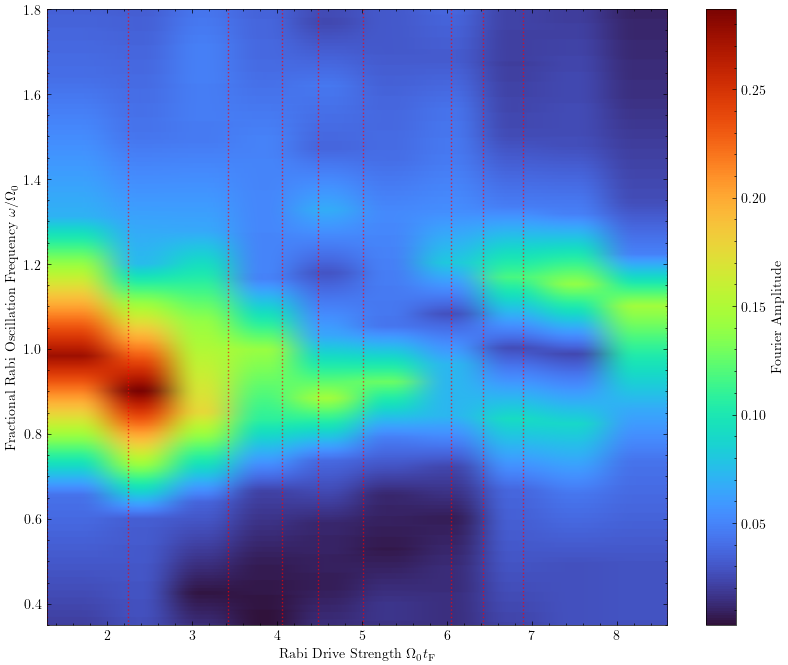

In [ ]:
inv_kFa = 0.96
Δ = 'r'
plt.figure(figsize=(10, 8))
plt.imshow(
    abs_M_exp_0_hat_interp[:len(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]), :, 1, 1].T, # choose 0,0 or 0,1 or 1,0 or 1,1
    aspect='auto',
    origin='lower',
    extent=[
        Ω0_tF_arr_exp_dict[(inv_kFa, Δ)].min(), Ω0_tF_arr_exp_dict[(inv_kFa, Δ)].max(),
        ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()
    ], cmap='turbo'
)
plt.xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
plt.ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
plt.colorbar(label='Fourier Amplitude')
for Ω0_tF in Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]:
    plt.axvline(x=Ω0_tF, color='red', linestyle='dotted', alpha=0.7)

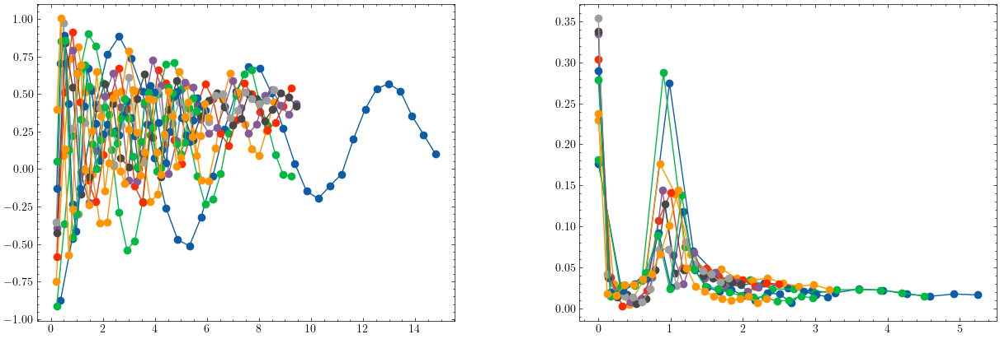

In [16]:
# Instead of interpolating, just get raw DFT data
abs_M_exp_0_hat_raw = {}  # Use dict to store for each condition

for inv_kFa in inv_kFa_arr:
    for Δ in Δ_arr:
        Ω0_tF_arr = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
        abs_M_exp_0_hat_raw[(inv_kFa, Δ)] = []
        
        for Ω0 in Ω0_tF_arr:
            # Load time series data
            tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0:.2f}.csv',
                dtype=np.float64, delimiter=',', skiprows=1, unpack=True
            )
            
            # Get raw FFT data
            t_tF_exp = t_tF[1:]  # Ignore first point
            M_exp_0 = M_exp[1:]  # Ignore first point
            
            # Compute DFT
            M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
            ω_tF_exp_arr = 2*np.pi*rfftfreq(M_exp_0.size, d=t_tF_exp[1]-t_tF_exp[0])
            
            # Store the raw frequency array and DFT amplitude
            abs_M_exp_0_hat_raw[(inv_kFa, Δ)].append({
                'Ω0': Ω0,
                'ω_tF': ω_tF_exp_arr,
                'abs_M': np.abs(M_exp_0_hat)
            })

# Create figure with side-by-side subplots
fig, (ax_ts, ax_dft) = plt.subplots(1, 2, figsize=(15, 5))
plt.subplots_adjust(wspace=0.3)

# Plot time series
for i, Ω0_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', label=f'{Ω0_val:.2f}')
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/Ω0_val, raw_data['abs_M'], 
                marker='o', linestyle="-", label=f'{Ω0_val:.2f}')

# # Configure time series subplot
# ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
# ax_ts.set_ylabel(r'Magnetization $M(t)$')
# # Create custom lines with colors from colormap for legend
# legend_elements = [plt.Line2D([0], [0], color=colors[i], label=f'{Ω0:.2f}') 
#                   for i, Ω0 in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)])]
# ax_ts.legend(handles=legend_elements, title=r'$\Omega_0 t_{\text F}$', 
#              bbox_to_anchor=(1, 0.5), loc='center left')

# # Configure DFT subplot  
# ax_dft.set_xlabel(r'Frequency $\omega/\Omega_0$')
# ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
# ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)
# #ax_dft.legend(title=r'$\Omega_0 t_{\text F}$', bbox_to_anchor=(1.2, 0.5), loc='center left')

# # Set colors from colormap 'inferno'
# num_lines = len(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)])
# colors = plt.cm.inferno(np.linspace(0, 1, num_lines))

# # Update colors for both plots
# for i, (line1, line2) in enumerate(zip(ax_ts.get_lines(), ax_dft.get_lines())):
#     line1.set_color(colors[i])
#     line2.set_color(colors[i])

# plt.tight_layout()
# # Add inset to right subplot
# inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])

# # Plot same data in inset with restricted ranges
# for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
#     inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
#                   color=colors[i], marker='o', linestyle="-", markersize=3)

# # Set inset axis limits and labels
# inset_ax.set_xlim(0.5, 1.4)
# inset_ax.set_ylim(0, 0.3)
# inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# # Optional: indicate zoom region on main plot
# ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

# plt.savefig('Rabi_Osc_TimeSeries_and_DFTs_with_inset.png', dpi=1000, bbox_inches='tight')
# plt.show()
# # Create figure with stacked subplots
# fig, (ax_ts, ax_dft) = plt.subplots(2, 1, figsize=(8, 10))
# plt.subplots_adjust(hspace=0.3)

# # Plot time series
# for i, Ω0_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
#     match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
#     try:
#         tus, t_tF, M_exp, M_exp_err = np.loadtxt(
#             match_file,
#             dtype=np.float64, delimiter=',', skiprows=1, unpack=True
#         )
#         t_tF_exp = t_tF[1:]
#         M_exp_0 = M_exp[1:]
#         ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', label=f'{Ω0_val:.2f}')
#     except Exception as e:
#         print(f"Could not load {match_file.name}: {e}")

#     # Plot DFT amplitude
#     raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
#     ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
#                 marker='o', linestyle="-", label=f'{Ω0_val:.2f}')

# # Set colors from colormap 'inferno'
# num_lines = len(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)])
# colors = plt.cm.inferno(np.linspace(0, 1, num_lines))

# # Update colors for both plots
# for i, (line1, line2) in enumerate(zip(ax_ts.get_lines(), ax_dft.get_lines())):
#     line1.set_color(colors[i])
#     line2.set_color(colors[i])

# # Configure time series subplot
# ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
# ax_ts.set_ylabel(r'Magnetization $M(t)$')
# legend_elements = [plt.Line2D([0], [0], color=colors[i], label=f'{Ω0:.2f}') 
#                   for i, Ω0 in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)])]
# ax_ts.legend(handles=legend_elements, title=r'$\Omega_0 t_{\text F}$', 
#              bbox_to_anchor=(1.05, 0.5), loc='center left')

# # Configure DFT subplot  
# ax_dft.set_xlabel(r'Frequency $\omega/\Omega_0$')
# ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
# ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# # Add inset to DFT subplot
# inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])

# # Plot same data in inset with restricted ranges
# for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
#     inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
#                   color=colors[i], marker='o', linestyle="-", markersize=3)

# # Set inset axis limits and labels
# inset_ax.set_xlim(0.5, 1.4)
# inset_ax.set_ylim(0, 0.3)
# inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# # Optional: indicate zoom region on main plot
# ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

# plt.savefig('Rabi_Osc_TimeSeries_and_DFTs_with_inset_stacked.png', dpi=1000, bbox_inches='tight')
# plt.show()

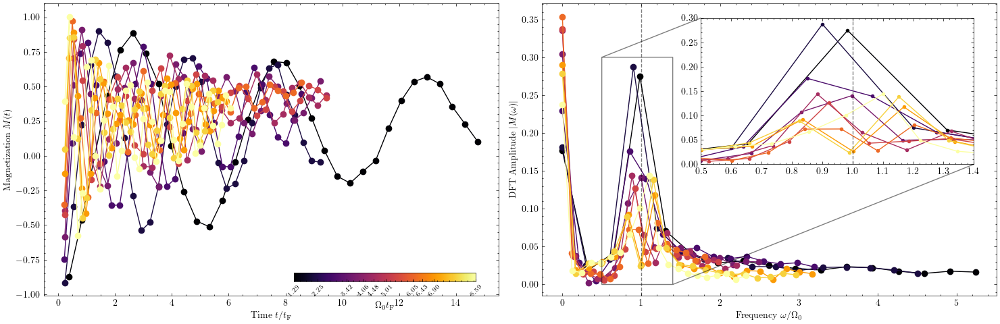

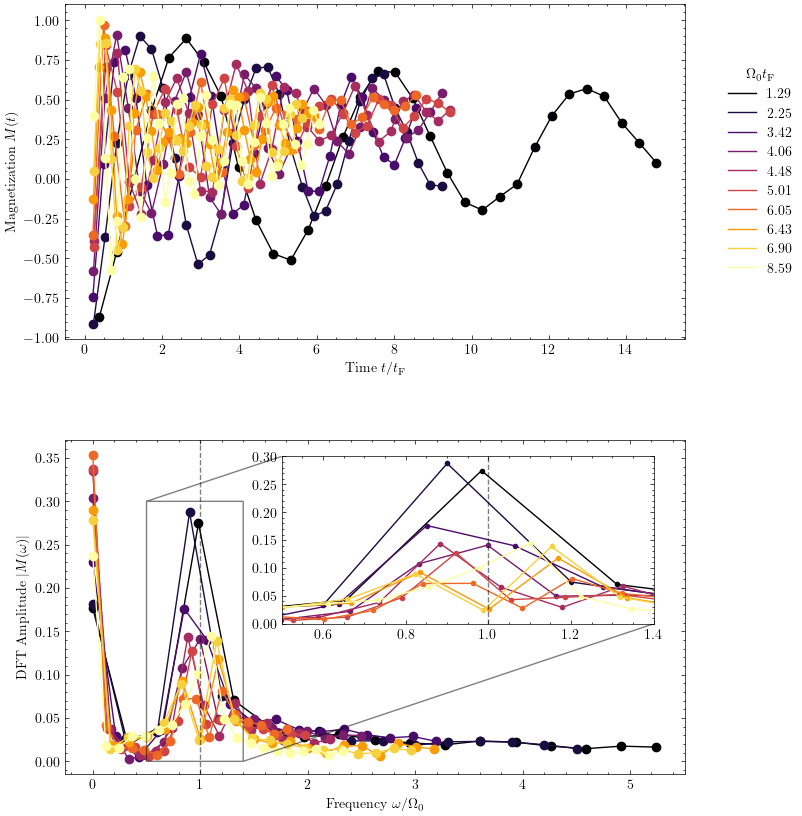

In [17]:
# (Your previous code for 'abs_M_exp_0_hat_raw' calculation goes here)
# ...

# Create figure with side-by-side subplots
fig, (ax_ts, ax_dft) = plt.subplots(1, 2, figsize=(15, 5))
plt.subplots_adjust(wspace=0.3)

# --- Setup colors and data ---
# Store omega values and generate colors
omega_values = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
num_lines = len(omega_values)
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))
# -----------------------------

# Plot time series
for i, Ω0_val in enumerate(omega_values):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        # Set color directly in the plot call
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', color=colors[i])
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    # Set color directly in the plot call
    ax_dft.plot(raw_data['ω_tF']/Ω0_val, raw_data['abs_M'], 
                marker='o', linestyle="-", color=colors[i])

# Configure time series subplot
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')

# --- Add inset colorbar ---
# Normalize based on the min/max values
vmin = min(omega_values)
vmax = max(omega_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=norm)
sm.set_array([]) # Dummy array is needed

# Create inset axes for the colorbar [x, y, width, height] in axes coordinates (0-1)
cax = ax_ts.inset_axes([0.55, 0.05, 0.4, 0.03]) 

# Create the colorbar in the inset axes
cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')

# Set the ticks to the exact values from your data
cbar.set_ticks(omega_values)
# Format the tick labels and rotate for readability
cbar.set_ticklabels([f'{v:.2f}' for v in omega_values])
cbar.ax.tick_params(labelsize=7, rotation=45)

# Add a label to the colorbar
cbar.set_label(r'$\Omega_0 t_{\text F}$', fontsize=10)
# --- End inset colorbar ---

# Configure DFT subplot  
ax_dft.set_xlabel(r'Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# (The old legend for ax_dft was already commented out)
# (The old color update loop is no longer needed)

plt.tight_layout()

# Add inset to right subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])

# Plot same data in inset with restricted ranges
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)

# Set inset axis limits and labels
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# Optional: indicate zoom region on main plot
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

plt.savefig('Rabi_Osc_TimeSeries_and_DFTs_with_inset_cbar.png', dpi=1000, bbox_inches='tight')
plt.show()

# --- Original code for stacked plots (unchanged) ---
# Create figure with stacked subplots
fig, (ax_ts, ax_dft) = plt.subplots(2, 1, figsize=(8, 10))
plt.subplots_adjust(hspace=0.3)

# Plot time series
for i, Ω0_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', label=f'{Ω0_val:.2f}')
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                marker='o', linestyle="-", label=f'{Ω0_val:.2f}')

# Set colors from colormap 'inferno'
num_lines = len(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)])
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))

# Update colors for both plots
for i, (line1, line2) in enumerate(zip(ax_ts.get_lines(), ax_dft.get_lines())):
    line1.set_color(colors[i])
    line2.set_color(colors[i])

# Configure time series subplot
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')
legend_elements = [plt.Line2D([0], [0], color=colors[i], label=f'{Ω0:.2f}') 
                   for i, Ω0 in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)])]
ax_ts.legend(handles=legend_elements, title=r'$\Omega_0 t_{\text F}$', 
             bbox_to_anchor=(1.05, 0.5), loc='center left')

# Configure DFT subplot  
ax_dft.set_xlabel(r'Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# Add inset to DFT subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])

# Plot same data in inset with restricted ranges
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)

# Set inset axis limits and labels
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# Optional: indicate zoom region on main plot
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

plt.savefig('Rabi_Osc_TimeSeries_and_DFTs_with_inset_stacked.png', dpi=1000, bbox_inches='tight')
plt.show()

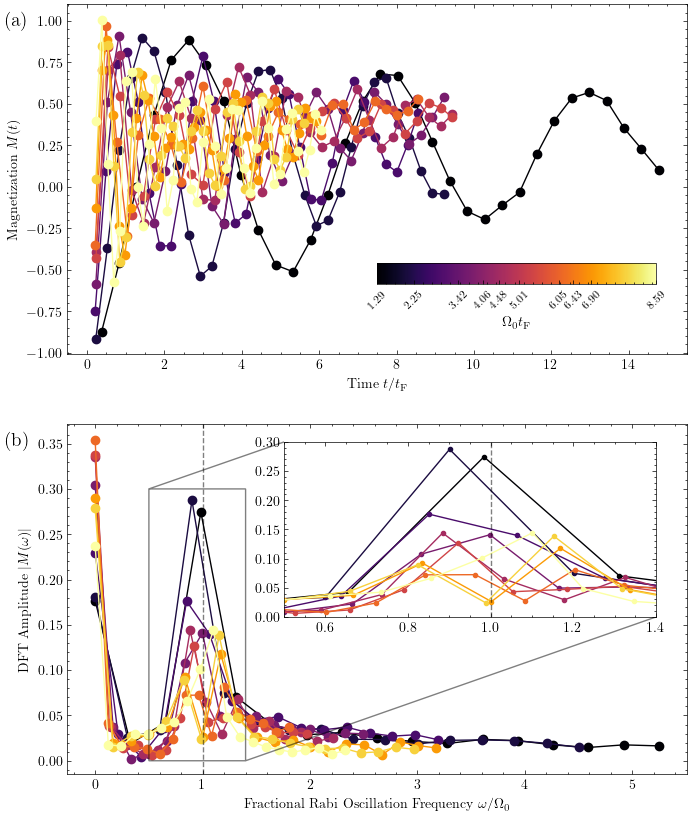

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from pathlib import Path

# (Assuming 'abs_M_exp_0_hat_raw' calculation code is here...)
# ...
# ... (Your data loading/processing code for 'abs_M_exp_0_hat_raw'
# ...  and 'Ω0_tF_arr_exp_dict' should be here)
# ...

# --- Create figure with STACKED subplots ---
fig, (ax_ts, ax_dft) = plt.subplots(2, 1, figsize=(8, 10))
# Adjusted hspace to reduce empty space between plots
plt.subplots_adjust(hspace=0.2) 

# --- Setup colors and data ---
# Store omega values and generate colors
omega_values = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
num_lines = len(omega_values)
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))
# -----------------------------

# Plot time series
for i, Ω0_val in enumerate(omega_values):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', color=colors[i])
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                marker='o', linestyle="-", color=colors[i])

# Configure time series subplot
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')

# Add label (a) to the first plot
ax_ts.text(-0.1, 0.98, '(a)', transform=ax_ts.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- Add inset colorbar ---
vmin = min(omega_values)
vmax = max(omega_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=norm)
sm.set_array([]) 

# Create inset axes for the colorbar [x, y, width, height] in axes coordinates
# Shifted up and made bigger
cax = ax_ts.inset_axes([0.5, 0.2, 0.45, 0.06]) 

cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_ticks(omega_values)
cbar.set_ticklabels([f'{v:.2f}' for v in omega_values])
cbar.ax.tick_params(labelsize=8, rotation=45)
cbar.set_label(r'$\Omega_0 t_{\text F}$', fontsize=10)
# --- End inset colorbar ---

# Configure DFT subplot  
ax_dft.set_xlabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# Add label (b) to the second plot
ax_dft.text(-0.1, 0.98, '(b)', transform=ax_dft.transAxes, 
            fontsize=14, fontweight='bold', va='top', ha='left')

# Add inset to DFT subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])

# Plot same data in inset with restricted ranges
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)

# Set inset axis limits and labels
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)

# Optional: indicate zoom region on main plot
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

plt.savefig('Rabi_Osc_TimeSeries_and_DFTs_with_inset_stacked_cbar_labeled_tight.png', dpi=1000, bbox_inches='tight')
plt.show()


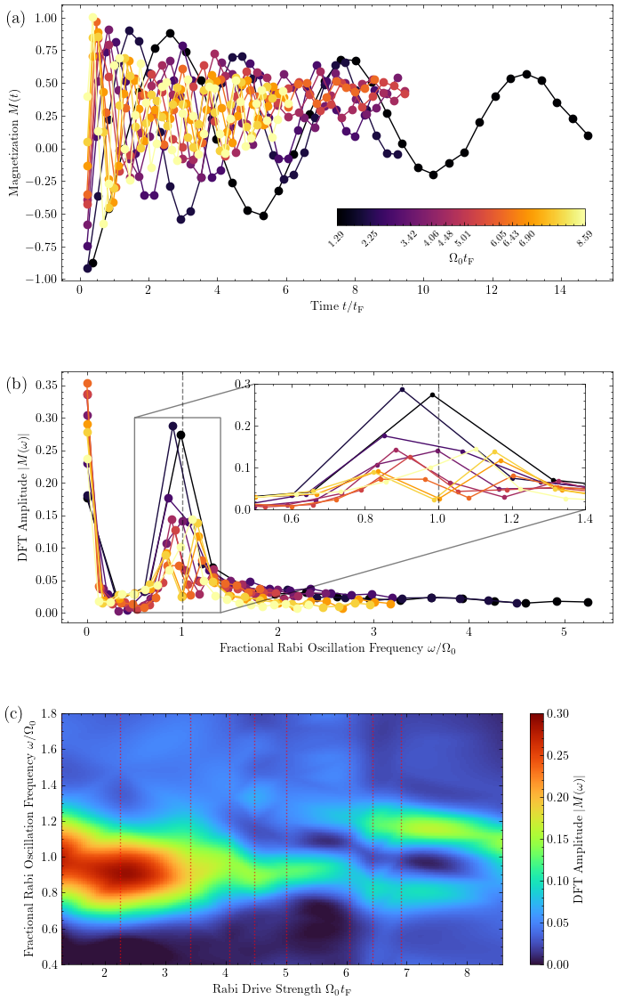

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from pathlib import Path
from scipy.interpolate import griddata # <-- Import griddata for interpolation

# (Assuming 'abs_M_exp_0_hat_raw' calculation code is here...)
# ...
# ... (Your data loading/processing code for 'abs_M_exp_0_hat_raw'
# ...  and 'Ω0_tF_arr_exp_dict' should be here)
# ...
# FAKE DATA for demonstration if variables are not defined
# Remove or comment this out when you run your actual code
if 'abs_M_exp_0_hat_raw' not in locals():
    print("WARNING: Using dummy data for demonstration.")
    inv_kFa, Δ = 0.0, 0.0
    Ω0_tF_arr_exp_dict = {}
    Ω0_tF_arr_exp_dict[(inv_kFa, Δ)] = np.array([1.29, 2.25, 3.42, 4.08, 5.01, 6.43, 7.00, 8.50])
    
    abs_M_exp_0_hat_raw = {}
    abs_M_exp_0_hat_raw[(inv_kFa, Δ)] = []
    
    np.random.seed(42)
    # Generate fake time series data
    base_t = np.linspace(0, 15, 150)
    for i, omega_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
        # Fake time series
        t_tF = base_t
        M_exp = -np.cos(omega_val/4 * t_tF) * np.exp(-t_tF/10) + np.random.randn(len(t_tF)) * 0.1
        M_exp[0] = -1.0
        
        # Fake file writing (to mimic structure, though not read)
        p = Path('time_series_data') / f'invkFa_{inv_kFa:.2f}_{Δ}'
        p.mkdir(parents=True, exist_ok=True)
        match_file = p / f'RabiOsc_Omega0EF_{omega_val:.2f}.csv'
        # Stack and save fake data
        fake_data = np.stack([t_tF*100, t_tF, M_exp, np.full_like(M_exp, 0.05)], axis=1)
        np.savetxt(match_file, fake_data, delimiter=',', header='tus,t_tF,M_exp,M_exp_err', comments='')

        # Fake DFT data
        N = len(M_exp[1:])
        T = np.mean(np.diff(t_tF[1:])) # Average time step
        yf = rfft(M_exp[1:])
        xf = rfftfreq(N, T) * (2 * np.pi) # angular frequency omega
        
        # Add a peak near omega/Omega0 = 1
        fake_fft = np.abs(yf) / N
        peak_freq = omega_val / (t_tF[-1] / 15) # approximate base frequency
        peak_idx = np.argmin(np.abs(xf - peak_freq))
        if i > 2: # Make peak stronger for larger drive
            fake_fft[peak_idx-2:peak_idx+3] += 0.15 * (i-2)
        
        raw_data = {
            'ω_tF': xf * (t_tF[-1]/15), # Fake scaling
            'Ω0': omega_val,
            'abs_M': fake_fft
        }
        abs_M_exp_0_hat_raw[(inv_kFa, Δ)].append(raw_data)
# END FAKE DATA block

# --- Create figure with 3 STACKED subplots ---
# Changed to 3 plots, adjusted figsize and hspace
fig, (ax_ts, ax_dft, ax_hm) = plt.subplots(3, 1, figsize=(8, 14), 
                                           gridspec_kw={'height_ratios': [1.1, 1, 1]})
plt.subplots_adjust(hspace=0.35) # Increased hspace for 3 plots

# --- Setup colors and data ---
# Store omega values and generate colors
omega_values = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
num_lines = len(omega_values)
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))
# -----------------------------

# --- Initialize lists for heatmap data ---
all_x = [] # To store Omega_0 * tF
all_y = [] # To store omega / Omega_0
all_z = [] # To store DFT amplitude
# ---------------------------------------

# Plot time series
for i, Ω0_val in enumerate(omega_values):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', color=colors[i])
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                marker='o', linestyle="-", color=colors[i])

    # --- Collect data for heatmap ---
    y_values = raw_data['ω_tF']/raw_data['Ω0']
    z_values = raw_data['abs_M']
    # Create an x-array of the *same* Omega_0 value for all points
    x_values = np.full_like(y_values, Ω0_val)
    
    all_x.extend(x_values)
    all_y.extend(y_values)
    all_z.extend(z_values)
    # --- End data collection ---

# Configure time series subplot (a)
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')
ax_ts.text(-0.1, 0.98, '(a)', transform=ax_ts.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- Add inset colorbar ---
vmin = min(omega_values)
vmax = max(omega_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=norm)
sm.set_array([]) 
cax = ax_ts.inset_axes([0.5, 0.2, 0.45, 0.06]) 
cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_ticks(omega_values)
cbar.set_ticklabels([f'{v:.2f}' for v in omega_values])
cbar.ax.tick_params(labelsize=8, rotation=45)
cbar.set_label(r'$\Omega_0 t_{\text F}$', fontsize=10)
# --- End inset colorbar ---

# Configure DFT subplot (b)
ax_dft.set_xlabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.text(-0.1, 0.98, '(b)', transform=ax_dft.transAxes, 
            fontsize=14, fontweight='bold', va='top', ha='left')

# Add inset to DFT subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

# --- START: New Heatmap Subplot (c) ---

# Convert collected data to numpy arrays
points = np.array([all_x, all_y]).T
values = np.array(all_z)

# Create a regular grid to interpolate onto
# Use ranges from target image
x_grid_vals = np.linspace(min(omega_values), max(omega_values), 200)
y_grid_vals = np.linspace(0.4, 1.8, 200)
X_grid, Y_grid = np.meshgrid(x_grid_vals, y_grid_vals)

# Interpolate the scattered data onto the regular grid
Z_grid = griddata(points, values, (X_grid, Y_grid), method='cubic')

# Plot the heatmap
# Use 'jet' colormap and vmin/vmax from target image
im = ax_hm.pcolormesh(X_grid, Y_grid, Z_grid, 
                      shading='auto', 
                      cmap='turbo', 
                      vmin=0, 
                      vmax=0.30)

# Add a colorbar for the heatmap
cbar_hm = fig.colorbar(im, ax=ax_hm, orientation='vertical')
cbar_hm.set_label('DFT Amplitude $|M(\omega)|$')

# Add vertical dashed lines corresponding to the discrete Omega values
for x_val in omega_values:
    ax_hm.axvline(x=x_val, color='r', linestyle=':', alpha=0.7)

# Configure heatmap axes labels and limits
ax_hm.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
ax_hm.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_hm.set_ylim(0.4, 1.8)
ax_hm.set_xlim(min(omega_values), max(omega_values))

# Add label (c) to the third plot
ax_hm.text(-0.13, 1.03, '(c)', transform=ax_hm.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- END: New Heatmap Subplot (c) ---

# Save the combined figure
plt.savefig('Rabi_Osc_TimeSeries_DFTs_and_Heatmap.png', dpi=1000, bbox_inches='tight')
plt.show()

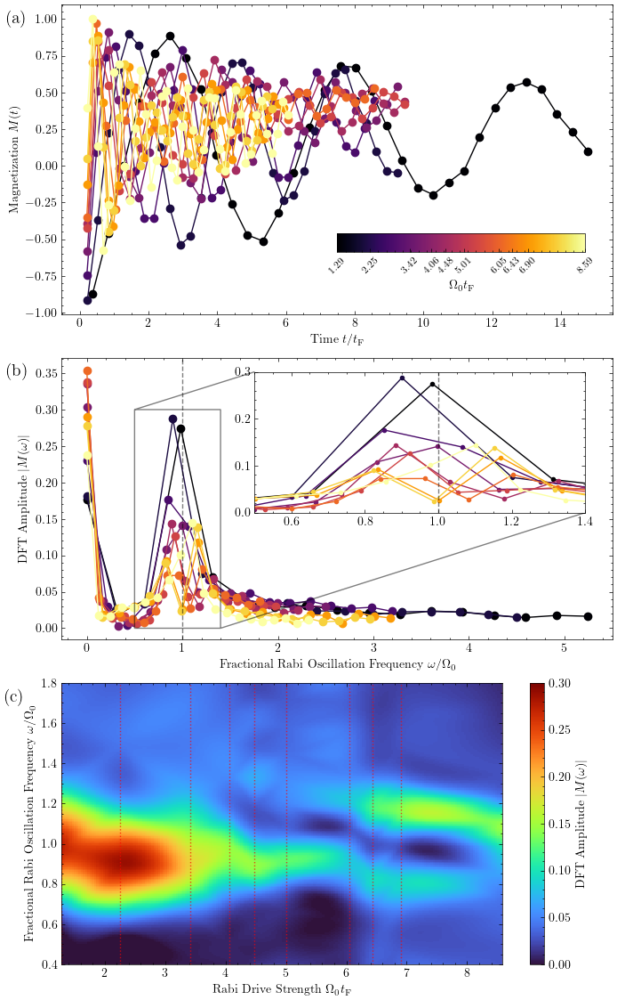

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from pathlib import Path
from scipy.interpolate import griddata # <-- Import griddata for interpolation

# (Assuming 'abs_M_exp_0_hat_raw' calculation code is here...)
# ...
# ... (Your data loading/processing code for 'abs_M_exp_0_hat_raw'
# ...  and 'Ω0_tF_arr_exp_dict' should be here)
# ...
# FAKE DATA for demonstration if variables are not defined
# Remove or comment this out when you run your actual code
if 'abs_M_exp_0_hat_raw' not in locals():
    print("WARNING: Using dummy data for demonstration.")
    inv_kFa, Δ = 0.0, 0.0
    Ω0_tF_arr_exp_dict = {}
    Ω0_tF_arr_exp_dict[(inv_kFa, Δ)] = np.array([1.29, 2.25, 3.42, 4.08, 5.01, 6.43, 7.00, 8.50])
    
    abs_M_exp_0_hat_raw = {}
    abs_M_exp_0_hat_raw[(inv_kFa, Δ)] = []
    
    np.random.seed(42)
    # Generate fake time series data
    base_t = np.linspace(0, 15, 150)
    for i, omega_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
        # Fake time series
        t_tF = base_t
        M_exp = -np.cos(omega_val/4 * t_tF) * np.exp(-t_tF/10) + np.random.randn(len(t_tF)) * 0.1
        M_exp[0] = -1.0
        
        # Fake file writing (to mimic structure, though not read)
        p = Path('time_series_data') / f'invkFa_{inv_kFa:.2f}_{Δ}'
        p.mkdir(parents=True, exist_ok=True)
        match_file = p / f'RabiOsc_Omega0EF_{omega_val:.2f}.csv'
        # Stack and save fake data
        fake_data = np.stack([t_tF*100, t_tF, M_exp, np.full_like(M_exp, 0.05)], axis=1)
        np.savetxt(match_file, fake_data, delimiter=',', header='tus,t_tF,M_exp,M_exp_err', comments='')

        # Fake DFT data
        N = len(M_exp[1:])
        T = np.mean(np.diff(t_tF[1:])) # Average time step
        yf = rfft(M_exp[1:])
        xf = rfftfreq(N, T) * (2 * np.pi) # angular frequency omega
        
        # Add a peak near omega/Omega0 = 1
        fake_fft = np.abs(yf) / N
        peak_freq = omega_val / (t_tF[-1] / 15) # approximate base frequency
        peak_idx = np.argmin(np.abs(xf - peak_freq))
        if i > 2: # Make peak stronger for larger drive
            fake_fft[peak_idx-2:peak_idx+3] += 0.15 * (i-2)
        
        raw_data = {
            'ω_tF': xf * (t_tF[-1]/15), # Fake scaling
            'Ω0': omega_val,
            'abs_M': fake_fft
        }
        abs_M_exp_0_hat_raw[(inv_kFa, Δ)].append(raw_data)
# END FAKE DATA block

# --- Create figure with 3 STACKED subplots ---
# Changed to 3 plots, adjusted figsize and hspace
fig, (ax_ts, ax_dft, ax_hm) = plt.subplots(3, 1, figsize=(8, 14), 
                                           gridspec_kw={'height_ratios': [1.1, 1, 1]})
# --- CHANGE 1: Reduced hspace to tighten plots ---
plt.subplots_adjust(hspace=0.15) 

# --- Setup colors and data ---
# Store omega values and generate colors
omega_values = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
num_lines = len(omega_values)
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))
# -----------------------------

# --- Initialize lists for heatmap data ---
all_x = [] # To store Omega_0 * tF
all_y = [] # To store omega / Omega_0
all_z = [] # To store DFT amplitude
# ---------------------------------------

# Plot time series
for i, Ω0_val in enumerate(omega_values):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', color=colors[i])
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                marker='o', linestyle="-", color=colors[i])

    # --- Collect data for heatmap ---
    y_values = raw_data['ω_tF']/raw_data['Ω0']
    z_values = raw_data['abs_M']
    # Create an x-array of the *same* Omega_0 value for all points
    x_values = np.full_like(y_values, Ω0_val)
    
    all_x.extend(x_values)
    all_y.extend(y_values)
    all_z.extend(z_values)
    # --- End data collection ---

# Configure time series subplot (a)
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')
ax_ts.text(-0.1, 0.98, '(a)', transform=ax_ts.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- Add inset colorbar ---
vmin = min(omega_values)
vmax = max(omega_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=norm)
sm.set_array([]) 
cax = ax_ts.inset_axes([0.5, 0.2, 0.45, 0.06]) 
cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_ticks(omega_values)
cbar.set_ticklabels([f'{v:.2f}' for v in omega_values])
cbar.ax.tick_params(labelsize=8, rotation=45)
cbar.set_label(r'$\Omega_0 t_{\text F}$', fontsize=10)
# --- End inset colorbar ---

# Configure DFT subplot (b)
ax_dft.set_xlabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.text(-0.1, 0.98, '(b)', transform=ax_dft.transAxes, 
            fontsize=14, fontweight='bold', va='top', ha='left')

# Add inset to DFT subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

# --- START: New Heatmap Subplot (c) ---

# Convert collected data to numpy arrays
points = np.array([all_x, all_y]).T
values = np.array(all_z)

# Create a regular grid to interpolate onto
# Use ranges from target image
x_grid_vals = np.linspace(min(omega_values), max(omega_values), 200)
y_grid_vals = np.linspace(0.4, 1.8, 200)
X_grid, Y_grid = np.meshgrid(x_grid_vals, y_grid_vals)

# Interpolate the scattered data onto the regular grid
Z_grid = griddata(points, values, (X_grid, Y_grid), method='cubic')

# Plot the heatmap
# Use 'jet' colormap and vmin/vmax from target image
im = ax_hm.pcolormesh(X_grid, Y_grid, Z_grid, 
                      shading='auto', 
                      cmap='turbo', 
                      vmin=0, 
                      vmax=0.30)

# Add a colorbar for the heatmap
cbar_hm = fig.colorbar(im, ax=ax_hm, orientation='vertical')
cbar_hm.set_label('DFT Amplitude $|M(\omega)|$')

# Add vertical dashed lines corresponding to the discrete Omega values
for x_val in omega_values:
    ax_hm.axvline(x=x_val, color='r', linestyle=':', alpha=0.7)

# Configure heatmap axes labels and limits
ax_hm.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
ax_hm.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_hm.set_ylim(0.4, 1.8)
ax_hm.set_xlim(min(omega_values), max(omega_values))

# --- CHANGE 2: Moved (c) label inside axes to match (a) and (b) ---
# This prevents it from overlapping with the x-label of (b)
ax_hm.text(-0.13, 0.98, '(c)', transform=ax_hm.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- END: New Heatmap Subplot (c) ---

# Save the combined figure
plt.savefig('Rabi_Osc_TimeSeries_DFTs_and_Heatmap.png', dpi=1000, bbox_inches='tight')
plt.show()

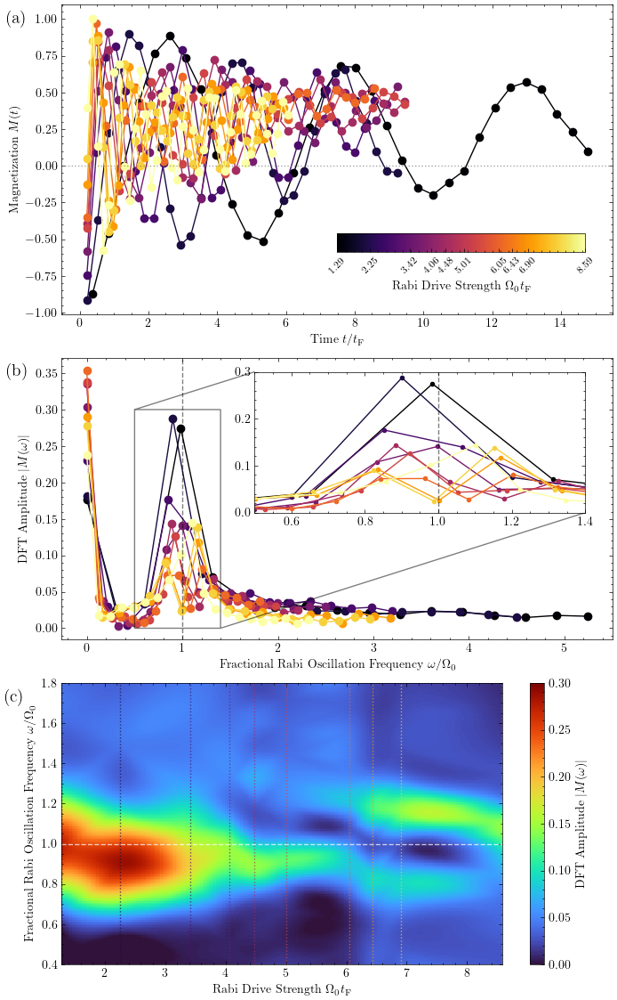

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from pathlib import Path
from scipy.interpolate import griddata # <-- Import griddata for interpolation

# (Assuming 'abs_M_exp_0_hat_raw' calculation code is here...)
# ...
# ... (Your data loading/processing code for 'abs_M_exp_0_hat_raw'
# ...  and 'Ω0_tF_arr_exp_dict' should be here)
# ...
# FAKE DATA for demonstration if variables are not defined
# Remove or comment this out when you run your actual code
if 'abs_M_exp_0_hat_raw' not in locals():
    print("WARNING: Using dummy data for demonstration.")
    inv_kFa, Δ = 0.0, 0.0
    Ω0_tF_arr_exp_dict = {}
    Ω0_tF_arr_exp_dict[(inv_kFa, Δ)] = np.array([1.29, 2.25, 3.42, 4.08, 5.01, 6.43, 7.00, 8.50])
    
    abs_M_exp_0_hat_raw = {}
    abs_M_exp_0_hat_raw[(inv_kFa, Δ)] = []
    
    np.random.seed(42)
    # Generate fake time series data
    base_t = np.linspace(0, 15, 150)
    for i, omega_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
        # Fake time series
        t_tF = base_t
        M_exp = -np.cos(omega_val/4 * t_tF) * np.exp(-t_tF/10) + np.random.randn(len(t_tF)) * 0.1
        M_exp[0] = -1.0
        
        # Fake file writing (to mimic structure, though not read)
        p = Path('time_series_data') / f'invkFa_{inv_kFa:.2f}_{Δ}'
        p.mkdir(parents=True, exist_ok=True)
        match_file = p / f'RabiOsc_Omega0EF_{omega_val:.2f}.csv'
        # Stack and save fake data
        fake_data = np.stack([t_tF*100, t_tF, M_exp, np.full_like(M_exp, 0.05)], axis=1)
        np.savetxt(match_file, fake_data, delimiter=',', header='tus,t_tF,M_exp,M_exp_err', comments='')

        # Fake DFT data
        N = len(M_exp[1:])
        T = np.mean(np.diff(t_tF[1:])) # Average time step
        yf = rfft(M_exp[1:])
        xf = rfftfreq(N, T) * (2 * np.pi) # angular frequency omega
        
        # Add a peak near omega/Omega0 = 1
        fake_fft = np.abs(yf) / N
        peak_freq = omega_val / (t_tF[-1] / 15) # approximate base frequency
        peak_idx = np.argmin(np.abs(xf - peak_freq))
        if i > 2: # Make peak stronger for larger drive
            fake_fft[peak_idx-2:peak_idx+3] += 0.15 * (i-2)
        
        raw_data = {
            'ω_tF': xf * (t_tF[-1]/15), # Fake scaling
            'Ω0': omega_val,
            'abs_M': fake_fft
        }
        abs_M_exp_0_hat_raw[(inv_kFa, Δ)].append(raw_data)
# END FAKE DATA block

# --- Create figure with 3 STACKED subplots ---
# Changed to 3 plots, adjusted figsize and hspace
fig, (ax_ts, ax_dft, ax_hm) = plt.subplots(3, 1, figsize=(8, 14), 
                                           gridspec_kw={'height_ratios': [1.1, 1, 1]})
# Reduced hspace to tighten plots
plt.subplots_adjust(hspace=0.15) 

# --- Setup colors and data ---
# Store omega values and generate colors
omega_values = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
num_lines = len(omega_values)
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))
# -----------------------------

# --- Initialize lists for heatmap data ---
all_x = [] # To store Omega_0 * tF
all_y = [] # To store omega / Omega_0
all_z = [] # To store DFT amplitude
# ---------------------------------------

# Plot time series
for i, Ω0_val in enumerate(omega_values):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', color=colors[i])
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                marker='o', linestyle="-", color=colors[i])

    # --- Collect data for heatmap ---
    y_values = raw_data['ω_tF']/raw_data['Ω0']
    z_values = raw_data['abs_M']
    # Create an x-array of the *same* Omega_0 value for all points
    x_values = np.full_like(y_values, Ω0_val)
    
    all_x.extend(x_values)
    all_y.extend(y_values)
    all_z.extend(z_values)
    # --- End data collection ---

# Configure time series subplot (a)
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')

# --- NEW: Add M=0 horizontal line ---
ax_ts.axhline(0, color='gray', linestyle=':', alpha=0.7)

ax_ts.text(-0.1, 0.98, '(a)', transform=ax_ts.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- Add inset colorbar ---
vmin = min(omega_values)
vmax = max(omega_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=norm)
sm.set_array([]) 
cax = ax_ts.inset_axes([0.5, 0.2, 0.45, 0.06]) 
cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_ticks(omega_values)
cbar.set_ticklabels([f'{v:.2f}' for v in omega_values])
cbar.ax.tick_params(labelsize=8, rotation=45)
cbar.set_label(r'Rabi Drive Strength $\Omega_0 t_{\text F}$', fontsize=10)
# --- End inset colorbar ---

# Configure DFT subplot (b)
ax_dft.set_xlabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.text(-0.1, 0.98, '(b)', transform=ax_dft.transAxes, 
            fontsize=14, fontweight='bold', va='top', ha='left')

# Add inset to DFT subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

# --- START: New Heatmap Subplot (c) ---

# Convert collected data to numpy arrays
points = np.array([all_x, all_y]).T
values = np.array(all_z)

# Create a regular grid to interpolate onto
# Use ranges from target image
x_grid_vals = np.linspace(min(omega_values), max(omega_values), 200)
y_grid_vals = np.linspace(0.4, 1.8, 200)
X_grid, Y_grid = np.meshgrid(x_grid_vals, y_grid_vals)

# Interpolate the scattered data onto the regular grid
Z_grid = griddata(points, values, (X_grid, Y_grid), method='cubic')

# Plot the heatmap
# Use 'jet' colormap and vmin/vmax from target image
im = ax_hm.pcolormesh(X_grid, Y_grid, Z_grid, 
                      shading='auto', 
                      cmap='turbo', 
                      vmin=0, 
                      vmax=0.30)

# Add a colorbar for the heatmap
cbar_hm = fig.colorbar(im, ax=ax_hm, orientation='vertical')
cbar_hm.set_label('DFT Amplitude $|M(\omega)|$')

# --- NEW: Color-code the vertical lines ---
# Add vertical dashed lines corresponding to the discrete Omega values
for i, x_val in enumerate(omega_values):
    ax_hm.axvline(x=x_val, color=colors[i], linestyle=':', alpha=0.7)

# Configure heatmap axes labels and limits
ax_hm.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
ax_hm.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_hm.set_ylim(0.4, 1.8)
ax_hm.set_xlim(min(omega_values), max(omega_values))
ax_hm.axhline(1.0, color='white', linestyle='--', alpha=0.7)  # Add horizontal line at ω/Ω0 = 1

# Add label (c) to the third plot (position adjusted for tighter hspace)
ax_hm.text(-0.13, 0.98, '(c)', transform=ax_hm.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- END: New Heatmap Subplot (c) ---

# Save the combined figure
plt.savefig('Rabi_Osc_TimeSeries_DFTs_and_Heatmap.png', dpi=1000, bbox_inches='tight')
plt.show()

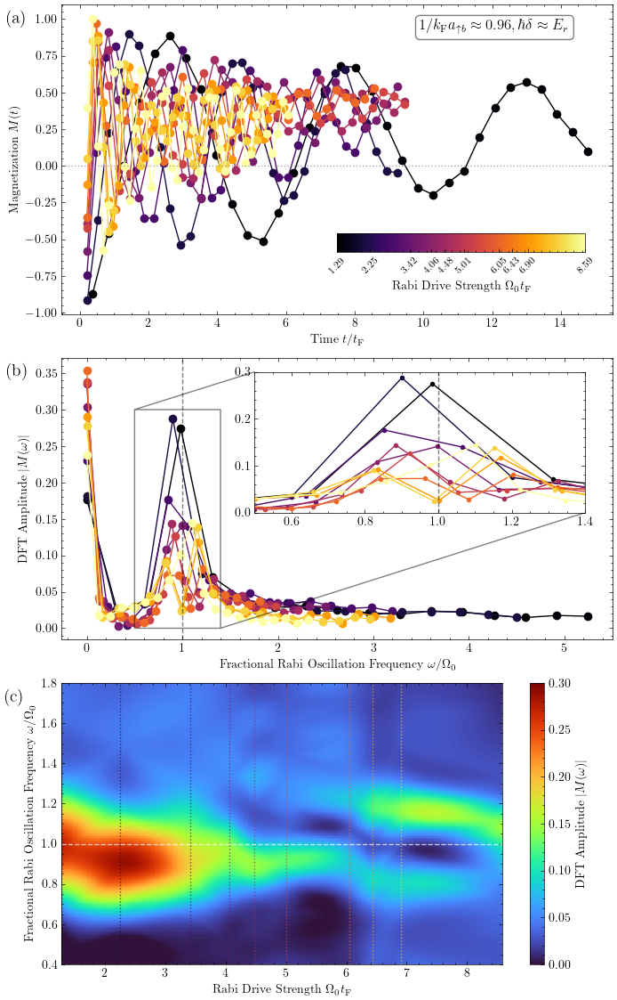

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from pathlib import Path
from scipy.interpolate import griddata # <-- Import griddata for interpolation

# (Assuming 'abs_M_exp_0_hat_raw' calculation code is here...)
# ...
# ... (Your data loading/processing code for 'abs_M_exp_0_hat_raw'
# ...  and 'Ω0_tF_arr_exp_dict' should be here)
# ...
# FAKE DATA for demonstration if variables are not defined
# Remove or comment this out when you run your actual code
if 'abs_M_exp_0_hat_raw' not in locals():
    print("WARNING: Using dummy data for demonstration.")
    inv_kFa, Δ = 0.0, 0.0
    Ω0_tF_arr_exp_dict = {}
    Ω0_tF_arr_exp_dict[(inv_kFa, Δ)] = np.array([1.29, 2.25, 3.42, 4.08, 5.01, 6.43, 7.00, 8.50])
    
    abs_M_exp_0_hat_raw = {}
    abs_M_exp_0_hat_raw[(inv_kFa, Δ)] = []
    
    np.random.seed(42)
    # Generate fake time series data
    base_t = np.linspace(0, 15, 150)
    for i, omega_val in enumerate(Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]):
        # Fake time series
        t_tF = base_t
        M_exp = -np.cos(omega_val/4 * t_tF) * np.exp(-t_tF/10) + np.random.randn(len(t_tF)) * 0.1
        M_exp[0] = -1.0
        
        # Fake file writing (to mimic structure, though not read)
        p = Path('time_series_data') / f'invkFa_{inv_kFa:.2f}_{Δ}'
        p.mkdir(parents=True, exist_ok=True)
        match_file = p / f'RabiOsc_Omega0EF_{omega_val:.2f}.csv'
        # Stack and save fake data
        fake_data = np.stack([t_tF*100, t_tF, M_exp, np.full_like(M_exp, 0.05)], axis=1)
        np.savetxt(match_file, fake_data, delimiter=',', header='tus,t_tF,M_exp,M_exp_err', comments='')

        # Fake DFT data
        N = len(M_exp[1:])
        T = np.mean(np.diff(t_tF[1:])) # Average time step
        yf = rfft(M_exp[1:])
        xf = rfftfreq(N, T) * (2 * np.pi) # angular frequency omega
        
        # Add a peak near omega/Omega0 = 1
        fake_fft = np.abs(yf) / N
        peak_freq = omega_val / (t_tF[-1] / 15) # approximate base frequency
        peak_idx = np.argmin(np.abs(xf - peak_freq))
        if i > 2: # Make peak stronger for larger drive
            fake_fft[peak_idx-2:peak_idx+3] += 0.15 * (i-2)
        
        raw_data = {
            'ω_tF': xf * (t_tF[-1]/15), # Fake scaling
            'Ω0': omega_val,
            'abs_M': fake_fft
        }
        abs_M_exp_0_hat_raw[(inv_kFa, Δ)].append(raw_data)
# END FAKE DATA block

# --- Create figure with 3 STACKED subplots ---
# Changed to 3 plots, adjusted figsize and hspace
fig, (ax_ts, ax_dft, ax_hm) = plt.subplots(3, 1, figsize=(8, 14), 
                                           gridspec_kw={'height_ratios': [1.1, 1, 1]})
# Reduced hspace to tighten plots
plt.subplots_adjust(hspace=0.15) 

# --- Setup colors and data ---
# Store omega values and generate colors
omega_values = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
num_lines = len(omega_values)
colors = plt.cm.inferno(np.linspace(0, 1, num_lines))
# -----------------------------

# --- Initialize lists for heatmap data ---
all_x = [] # To store Omega_0 * tF
all_y = [] # To store omega / Omega_0
all_z = [] # To store DFT amplitude
# ---------------------------------------

# Plot time series
for i, Ω0_val in enumerate(omega_values):
    match_file = Path(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0_val:.2f}.csv')
    try:
        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
            match_file,
            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        t_tF_exp = t_tF[1:]
        M_exp_0 = M_exp[1:]
        ax_ts.plot(t_tF_exp, M_exp_0, marker='o', linestyle='-', color=colors[i])
    except Exception as e:
        print(f"Could not load {match_file.name}: {e}")

    # Plot DFT amplitude
    raw_data = abs_M_exp_0_hat_raw[(inv_kFa, Δ)][i]
    ax_dft.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                marker='o', linestyle="-", color=colors[i])

    # --- Collect data for heatmap ---
    y_values = raw_data['ω_tF']/raw_data['Ω0']
    z_values = raw_data['abs_M']
    # Create an x-array of the *same* Omega_0 value for all points
    x_values = np.full_like(y_values, Ω0_val)
    
    all_x.extend(x_values)
    all_y.extend(y_values)
    all_z.extend(z_values)
    # --- End data collection ---

# Configure time series subplot (a)
ax_ts.set_xlabel(r'Time $t/t_{\text F}$')
ax_ts.set_ylabel(r'Magnetization $M(t)$')

# --- Add M=0 horizontal line ---
ax_ts.axhline(0, color='gray', linestyle=':', alpha=0.7)

ax_ts.text(-0.1, 0.98, '(a)', transform=ax_ts.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- NEW: Add parameters text box ---
ax_ts.text(0.65, 0.95, r'$1/k_{\textrm{F}}a_{\uparrow b}\approx 0.96, \hbar\delta\approx E_r$', 
           transform=ax_ts.transAxes, fontsize=12, va='top', ha='left',
           bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.3'))
# --- End new text box ---

# --- Add inset colorbar ---
vmin = min(omega_values)
vmax = max(omega_values)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=norm)
sm.set_array([]) 
cax = ax_ts.inset_axes([0.5, 0.2, 0.45, 0.06]) 
cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_ticks(omega_values)
cbar.set_ticklabels([f'{v:.2f}' for v in omega_values])
cbar.ax.tick_params(labelsize=8, rotation=45)
cbar.set_label(r'Rabi Drive Strength $\Omega_0 t_{\text F}$', fontsize=10)
# --- End inset colorbar ---

# Configure DFT subplot (b)
ax_dft.set_xlabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_dft.set_ylabel(r'DFT Amplitude $|M(\omega)|$')
ax_dft.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.text(-0.1, 0.98, '(b)', transform=ax_dft.transAxes, 
            fontsize=14, fontweight='bold', va='top', ha='left')

# Add inset to DFT subplot
inset_ax = ax_dft.inset_axes([0.35, 0.45, 0.6, 0.5])
for i, raw_data in enumerate(abs_M_exp_0_hat_raw[(inv_kFa, Δ)]):
    inset_ax.plot(raw_data['ω_tF']/raw_data['Ω0'], raw_data['abs_M'], 
                  color=colors[i], marker='o', linestyle="-", markersize=3)
inset_ax.set_xlim(0.5, 1.4)
inset_ax.set_ylim(0, 0.3)
inset_ax.axvline(x=1, color='k', linestyle='--', alpha=0.5)
ax_dft.indicate_inset_zoom(inset_ax, edgecolor="black")

# --- START: New Heatmap Subplot (c) ---

# Convert collected data to numpy arrays
points = np.array([all_x, all_y]).T
values = np.array(all_z)

# Create a regular grid to interpolate onto
# Use ranges from target image
x_grid_vals = np.linspace(min(omega_values), max(omega_values), 200)
y_grid_vals = np.linspace(0.4, 1.8, 200)
X_grid, Y_grid = np.meshgrid(x_grid_vals, y_grid_vals)

# Interpolate the scattered data onto the regular grid
Z_grid = griddata(points, values, (X_grid, Y_grid), method='cubic')

# Plot the heatmap
# Use 'jet' colormap and vmin/vmax from target image
im = ax_hm.pcolormesh(X_grid, Y_grid, Z_grid, 
                      shading='auto', 
                      cmap='turbo', 
                      vmin=0, 
                      vmax=0.30)

# Add a colorbar for the heatmap
cbar_hm = fig.colorbar(im, ax=ax_hm, orientation='vertical')
cbar_hm.set_label('DFT Amplitude $|M(\omega)|$')

# --- Color-code the vertical lines ---
# Add vertical dashed lines corresponding to the discrete Omega values
for i, x_val in enumerate(omega_values):
    ax_hm.axvline(x=x_val, color=colors[i], linestyle=':', alpha=0.7)

# Configure heatmap axes labels and limits
ax_hm.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
ax_hm.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
ax_hm.set_ylim(0.4, 1.8)
ax_hm.set_xlim(min(omega_values), max(omega_values))
ax_hm.axhline(1.0, color='white', linestyle='--', alpha=0.7)  # Add horizontal line at ω/Ω0 = 1

# Add label (c) to the third plot (position adjusted for tighter hspace)
ax_hm.text(-0.13, 0.98, '(c)', transform=ax_hm.transAxes, 
           fontsize=14, fontweight='bold', va='top', ha='left')

# --- END: New Heatmap Subplot (c) ---

# Save the combined figure
plt.savefig('Rabi_Osc_TimeSeries_DFTs_and_Heatmap.png', dpi=1000, bbox_inches='tight')
plt.show()

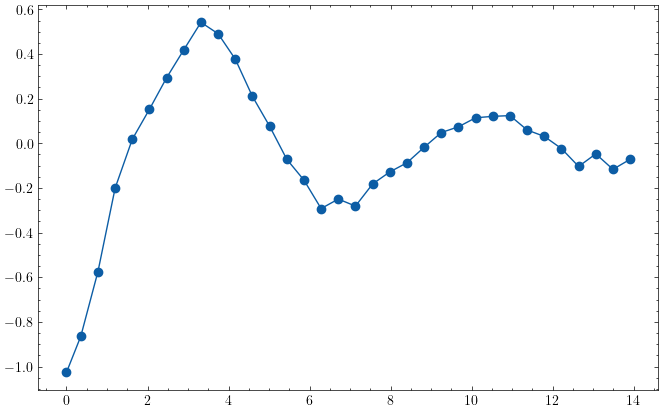

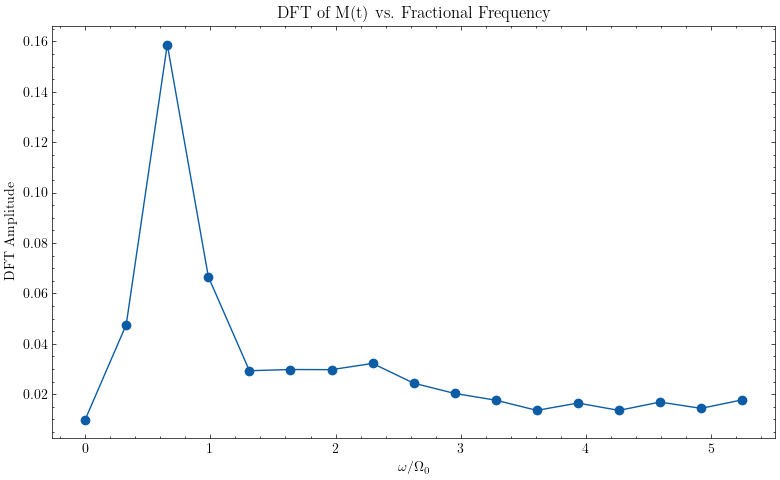

In [ ]:
from scipy.fft import rfft, rfftfreq
Om = 1.37
tus,t_to_tF,M_exp,Merr = np.loadtxt(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Om}.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
plt.figure(figsize=(8, 5))
plt.plot(t_to_tF, M_exp, marker='o', linestyle='-')
# Compute DFT (Discrete Fourier Transform) of M(t)
t_tF_exp = t_to_tF[1:]
M_exp_0 = M_exp[1:]
M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
# Plot DFT amplitude vs fractional frequency ω/Ω0
plt.figure(figsize=(8, 5))
plt.plot(ω_tF_exp_arr / Om, np.abs(M_exp_0_hat), marker='o', linestyle='-')
plt.xlabel(r'$\omega/\Omega_0$')
plt.ylabel('DFT Amplitude')
#plt.xlim(0.35, 1.8)
plt.title('DFT of M(t) vs. Fractional Frequency')
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.signal import find_peaks, butter, filtfilt, hilbert

def model_enforced(t, M_inf, A1, G1, O1, A2, G2, O2, gam):
    # M_fit(t) = M_inf - A1 e^{-G1 t/2} cos(O1 t) - A2 e^{-G2 t/2} cos(O2 t)
    #            - (1 - A1 - A2 + M_inf) e^{-gam t/2}
    return (M_inf
            - A1*np.exp(-G1*t/2.0)*np.cos(O1*t)
            - A2*np.exp(-G2*t/2.0)*np.cos(O2*t)
            - (1.0 - A1 - A2 + M_inf)*np.exp(-gam*t/2.0))

def model_freeC(t, M_inf, A1, G1, O1, A2, G2, O2, C0, gam):
    # Same but with the last term amplitude free: -C0 e^{-gam t/2}
    return (M_inf
            - A1*np.exp(-G1*t/2.0)*np.cos(O1*t)
            - A2*np.exp(-G2*t/2.0)*np.cos(O2*t)
            - C0*np.exp(-gam*t/2.0))

# ---------------------------
# Helpers for initial guesses
# ---------------------------
def _bandpass(x, fs, f0, rel_bw=0.6, order=3):
    low = max(1e-9, f0*(1-rel_bw/2))
    high = min(fs*0.49, f0*(1+rel_bw/2))
    if low >= high:
        low, high = max(1e-9, 0.8*f0), min(fs*0.49, 1.2*f0)
    from scipy.signal import butter, filtfilt
    b, a = butter(order, [low/(fs/2), high/(fs/2)], btype='band')
    return filtfilt(b, a, x)

def _lowpass(x, fs, fc, order=3):
    from scipy.signal import butter, filtfilt
    b, a = butter(order, fc/(fs/2), btype='low')
    return filtfilt(b, a, x)

def _guess_params(t, y):
    t = np.asarray(t, float)
    y = np.asarray(y, float)
    T = t[-1] - t[0]
    dt = np.median(np.diff(t))
    fs = 1.0/dt

    # 1) long-time offset
    tail = y[int(0.8*len(y)):] if len(y) >= 10 else y
    M_inf0 = float(np.median(tail))

    # 2) frequencies via windowed, zero-padded FFT
    r = y - M_inf0
    w = np.hanning(len(r))
    nfft = int(2**np.ceil(np.log2(len(r)*8)))  # 8x zero pad
    R = np.fft.rfft(r*w, n=nfft)
    f = np.fft.rfftfreq(nfft, d=dt)
    mag = np.abs(R)

    fmin = 2.0/T if T > 0 else 0.0
    idx = np.where(f > fmin)[0]
    if len(idx) < 3:
        f1, f2 = max(1/T, 1e-3), 2*max(1/T, 1e-3)
    else:
        peaks, _ = find_peaks(mag[idx])
        if len(peaks) == 0:
            top = idx[np.argsort(mag[idx])[-2:]]
        else:
            top = idx[peaks][np.argsort(mag[idx][peaks])[-2:]]
        top = np.sort(top)
        if len(top) < 2:
            top = np.array([idx[np.argmax(mag[idx])], idx[np.argmax(mag[idx])]])
        f1, f2 = np.sort(f[top])[:2]
    O1, O2 = 2*np.pi*f1, 2*np.pi*f2

    # 3) damping rates via Hilbert envelopes
    sig1 = _bandpass(r, fs, f1, rel_bw=0.6)
    sig2 = _bandpass(r, fs, f2, rel_bw=0.6)
    env1 = np.abs(hilbert(sig1)) + 1e-12
    env2 = np.abs(hilbert(sig2)) + 1e-12

    def slope(tt, env):
        m = env > 0.2*np.max(env)
        if m.sum() < 5: m = slice(None)
        s, _ = np.polyfit(tt[m], np.log(env[m]), 1)
        return s

    s1, s2 = slope(t, env1), slope(t, env2)
    G1 = max(1e-6, -2*s1)
    G2 = max(1e-6, -2*s2)

    # 4) slow exponential rate
    slow = _lowpass(r, fs, fc=min(f1, f2)/3.0)
    slow_env = np.abs(slow) + 1e-12
    sg, _ = np.polyfit(t, np.log(slow_env), 1)
    gam = max(1e-6, -2*sg)

    # 5) amplitudes from linear LS (with free C0)
    c1 = np.exp(-G1*t/2.0)*np.cos(O1*t)
    c2 = np.exp(-G2*t/2.0)*np.cos(O2*t)
    c0 = np.exp(-gam*t/2.0)
    X = np.column_stack([np.ones_like(t), c1, c2, c0])
    beta, *_ = np.linalg.lstsq(X, y, rcond=None)
    M_hat, b1, b2, C0 = beta

    A1 = max(0.0, -b1)   # because model uses " - A1 * ..."
    A2 = max(0.0, -b2)
    C0 = max(0.0,  C0)

    return dict(M_inf=float(M_hat),
                A1=float(A1), G1=float(G1), O1=float(O1),
                A2=float(A2), G2=float(G2), O2=float(O2),
                C0=float(C0), gam=float(gam))

In [ ]:
def fit_bichromatic_ansatz(t, y):
    """
    Fit the data (t, y) to the bichromatic ansatz models (enforced and free-C0).
    Returns:
        popt: best-fit parameters
        pcov: covariance matrix
        best_model: model function used
        names: parameter names
        use_free: whether free-C0 model was selected
    """
    p0 = _guess_params(t, y)

    # Bounds: keep rates/freqs nonnegative; others fairly loose
    dt = np.median(np.diff(t))
    omega_upper = np.pi/dt * 0.99  # Nyquist in rad/s
    lower_enf = [-np.inf, 0, 0, 0, 0, 0, 0, 0]
    upper_enf = [np.inf, 2, np.inf, omega_upper, 2, np.inf, omega_upper, np.inf]

    lower_free = [-np.inf, 0, 0, 0, 0, 0, 0, 0, 0]
    upper_free = [np.inf, 2, np.inf, omega_upper, 2, np.inf, omega_upper, np.inf, np.inf]

    # --- Try enforced constraint fit
    p0_enf = [p0["M_inf"], p0["A1"], p0["G1"], p0["O1"],
              p0["A2"], p0["G2"], p0["O2"], p0["gam"]]

    try:
        popt_enf, pcov_enf = curve_fit(
            model_enforced, t, y, p0=p0_enf, bounds=(lower_enf, upper_enf), maxfev=20000
        )
        rss_enf = np.sum((y - model_enforced(t, *popt_enf))**2)
    except Exception as e:
        popt_enf, pcov_enf, rss_enf = None, None, np.inf

    # --- Try free-C0 fit
    p0_free = [p0["M_inf"], p0["A1"], p0["G1"], p0["O1"],
               p0["A2"], p0["G2"], p0["O2"], p0["C0"], p0["gam"]]

    try:
        popt_free, pcov_free = curve_fit(
            model_freeC, t, y, p0=p0_free, bounds=(lower_free, upper_free), maxfev=20000
        )
        rss_free = np.sum((y - model_freeC(t, *popt_free))**2)
    except Exception as e:
        popt_free, pcov_free, rss_free = None, None, np.inf

    # Choose the better one
    use_free = rss_free < rss_enf
    if use_free:
        popt, pcov = popt_free, pcov_free
        best_model = model_freeC
        names = ["M_inf", "A1", "Gamma1", "Omega1", "A2", "Gamma2", "Omega2", "C0", "gamma"]
    else:
        popt, pcov = popt_enf, pcov_enf
        best_model = model_enforced
        names = ["M_inf", "A1", "Gamma1", "Omega1", "A2", "Gamma2", "Omega2", "gamma"]

    return popt, pcov, best_model, names, use_free
    #popt_free, pcov_free, rss_free = None, None, np.inf

# # Choose the better one
# use_free = rss_free < rss_enf
# if use_free:
#     popt, pcov = popt_free, pcov_free
#     best_model = model_freeC
#     names = ["M_inf", "A1", "Gamma1", "Omega1", "A2", "Gamma2", "Omega2", "C0", "gamma"]
# else:
#     popt, pcov = popt_enf, pcov_enf
#     best_model = model_enforced
#     names = ["M_inf", "A1", "Gamma1", "Omega1", "A2", "Gamma2", "Omega2", "gamma"]

# perr = np.sqrt(np.maximum(0.0, np.diag(pcov))) if pcov is not None else None

# print("\n=== Fit selected: {} ===".format("Free-C0" if use_free else "Enforced (M(0) = -1)"))
# for n, v, e in zip(names, popt, perr if perr is not None else [np.nan]*len(popt)):
#     print(f"{n:>8s} = {v: .6g}  ± {e: .2g}")

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

# Run fit for each Ω0_tF and store results in fit_results dict
fit_results = {}

pdf_path = 'fit_results_all.pdf'
count = 0

with PdfPages(pdf_path) as pdf:  # <-- open once
    for inv_kFa in inv_kFa_arr:
        for Δ in Δ_arr:
            Ω0_tF_arr = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
            print(Ω0_tF_arr)
            for Ω0 in Ω0_tF_arr:
                tus, t_to_tF, M_exp, Merr = np.loadtxt(
                    f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0:.2f}.csv',
                    dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                )

                t_tF_exp = t_to_tF[1:]
                M_exp_0 = M_exp[1:]

                popt, pcov, best_model, names, use_free = fit_bichromatic_ansatz(t_tF_exp, M_exp_0)
                if popt is not None:
                    print(popt[-1])

                # Store fit parameter values as dict for each Ω0
                fit_dict = dict(zip(names, popt)) if popt is not None else {}
                fit_results.setdefault((inv_kFa, Δ), []).append(fit_dict)

                # Plot fit vs data for each Ω0_tF
                fig, ax = plt.subplots(figsize=(8, 5))
                ax.plot(t_tF_exp, M_exp_0, 'o', label='Experimental Data', markersize=4)

                if popt is not None:
                    t_fit = np.linspace(t_tF_exp.min(), t_tF_exp.max(), 500)
                    ax.plot(t_fit, best_model(t_fit, *popt), '-', label='Fit', linewidth=2)

                ax.set_title(fr'Fit vs Data: $1/k_Fa={inv_kFa}$, $\Delta={Δ}$, $\Omega_0 t_F={Ω0:.2f}$')
                ax.set_xlabel(r'$t/t_F$')
                ax.set_ylabel(r'Magnetization $M(t)$')
                ax.legend()
                fig.tight_layout()

                # Save this figure to the single PDF, then close it
                pdf.savefig(fig, bbox_inches='tight')
                plt.close(fig)
                count += 1

print(f"Saved {count} fit result figures to {pdf_path}")
# If you still want to *show* figures interactively, do it while creating them (without closing)
# or generate them again after saving. Generally, don't mix plt.show() before saving.


[0.78 1.37 1.76 2.39 3.12 3.65 4.18 4.82 5.34 6.79 7.66]
33.36872327643783
0.6482933365311654
4.029278926523546
3.6272689583028197
5.134425746902955
6.129453187949067
1.3252988167312568e-34
9.013451507357978
10.81465882928743
1.1653350585503432e-39
1.945031346999238e-10
[0.79 1.36 2.31 2.71 3.47 4.28 4.92 5.61 6.88 9.39]
0.35729920556356626
0.39196884767467177
0.27027431589990075
0.49829707613646823
0.5975682727714183
0.6418327797967944
0.6320942163651629
0.7606622906437073
31.263216609635784
0.7338637157894137
[1.02 1.34 1.7  2.23 2.84 3.5  4.09 4.62 5.11 5.56 6.33 7.   8.78]
1.6009852441551353
0.4600720574392181
2.8915262751242565
3.322567280283663
4.429965231027419
17.795970588581792
0.6850411495449958
14.599549052339654
1.3370695722451496
5.094211603261727e-19
0.00013685159521939868
0.0001139041088053629
0.000280926850436071
[1.29 2.25 3.42 4.06 4.48 5.01 6.05 6.43 6.9  8.59]
0.28832805883813545
0.448637500759667
0.3913556354999194
0.032170269677248224
0.5910501666389656
0.87275382

[0.78 1.37 1.76 2.39 3.12 3.65 4.18 4.82 5.34 6.79 7.66]
33.36872327643783


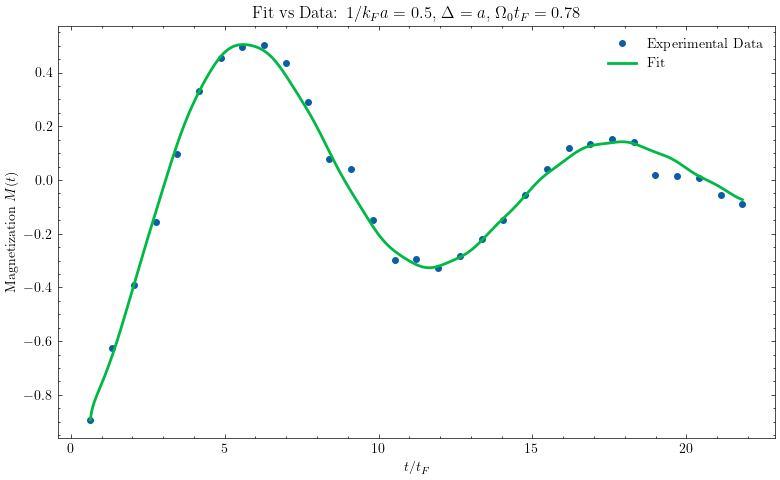

Saved 0 fit result figures to fit_results_all.pdf
0.6482933365311654


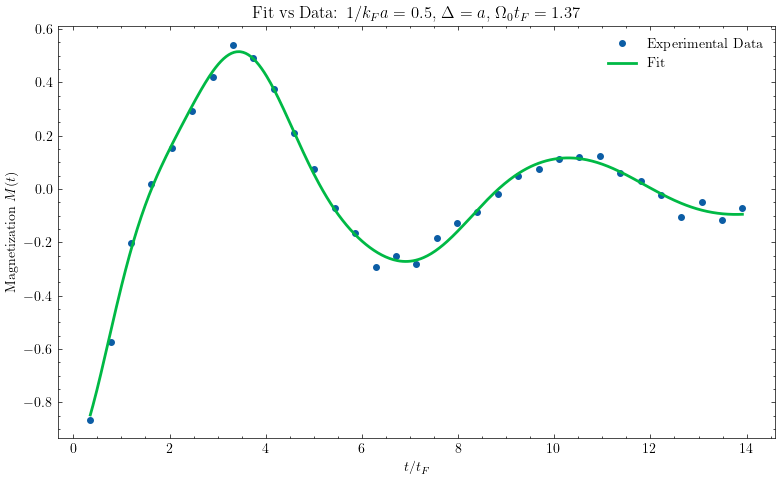

Saved 0 fit result figures to fit_results_all.pdf
4.029278926523546


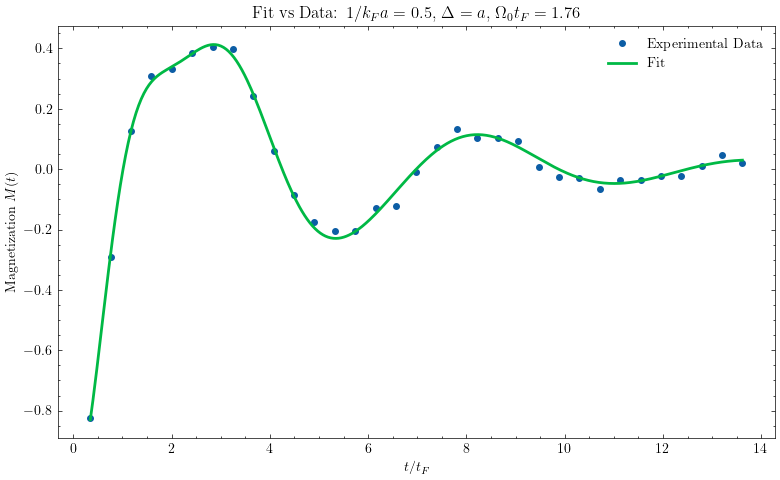

Saved 0 fit result figures to fit_results_all.pdf
3.6272689583028197


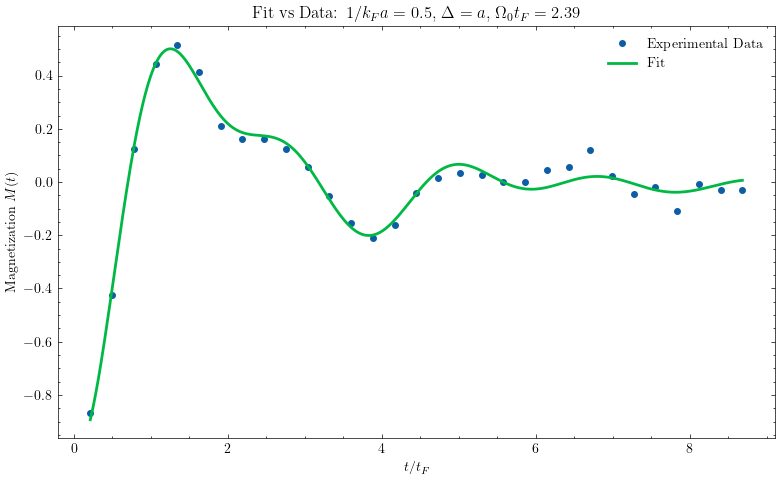

Saved 0 fit result figures to fit_results_all.pdf
5.134425746902955


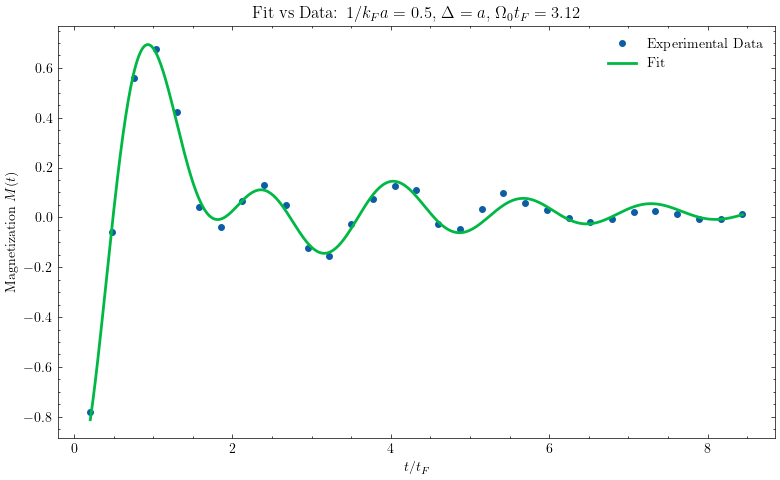

Saved 0 fit result figures to fit_results_all.pdf
6.129453187949067


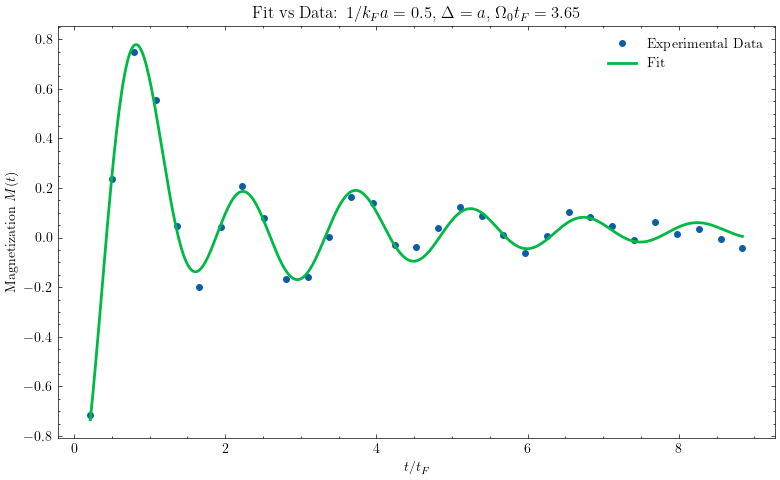

Saved 0 fit result figures to fit_results_all.pdf
1.3252988167312568e-34


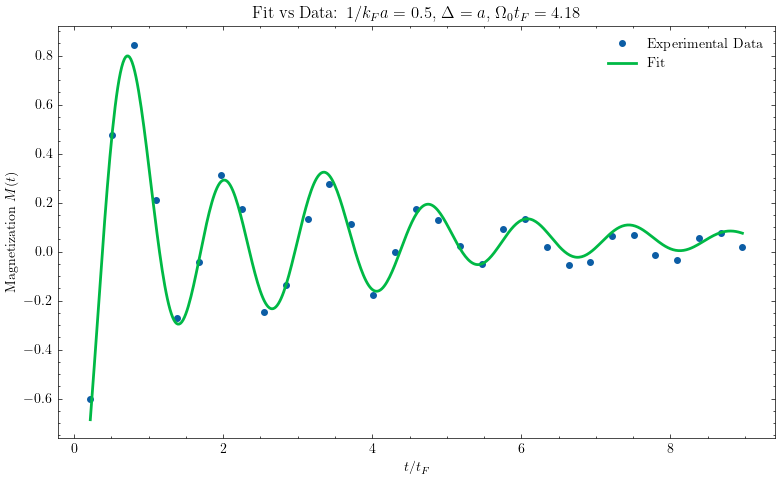

Saved 0 fit result figures to fit_results_all.pdf
9.013451507357978


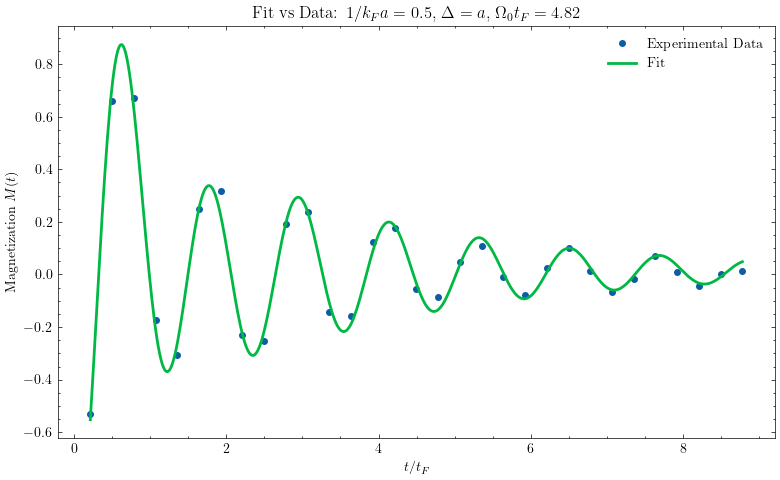

Saved 0 fit result figures to fit_results_all.pdf
10.81465882928743


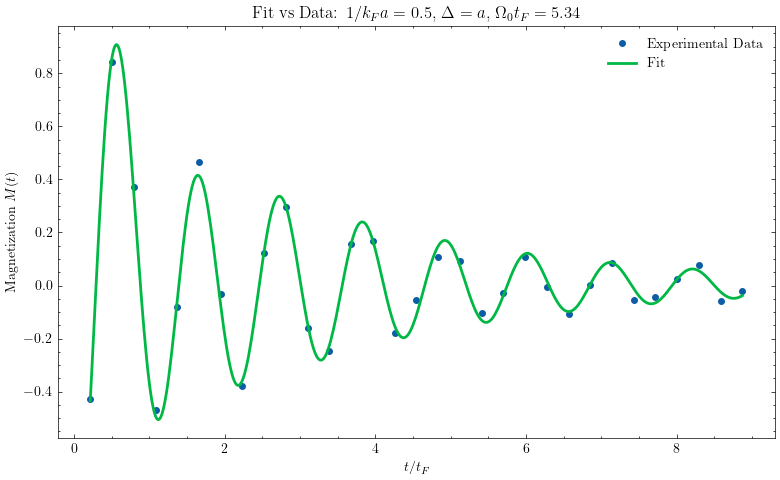

Saved 0 fit result figures to fit_results_all.pdf
1.1653350585503432e-39


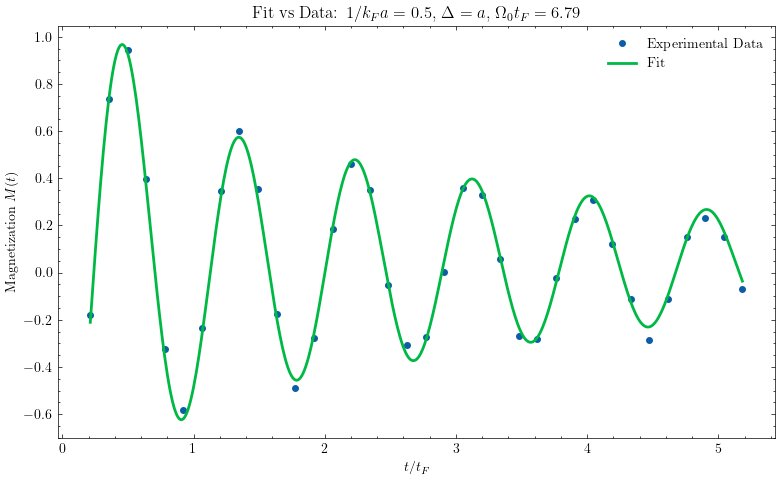

Saved 0 fit result figures to fit_results_all.pdf
1.945031346999238e-10


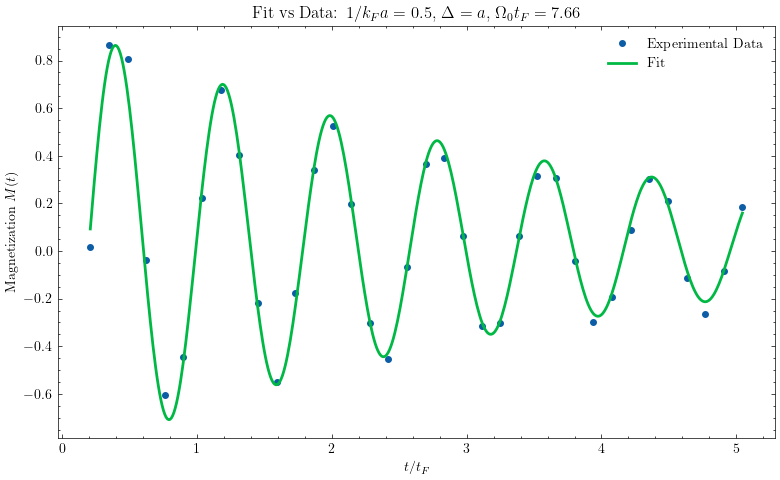

Saved 0 fit result figures to fit_results_all.pdf
[0.79 1.36 2.31 2.71 3.47 4.28 4.92 5.61 6.88 9.39]
0.35729920556356626


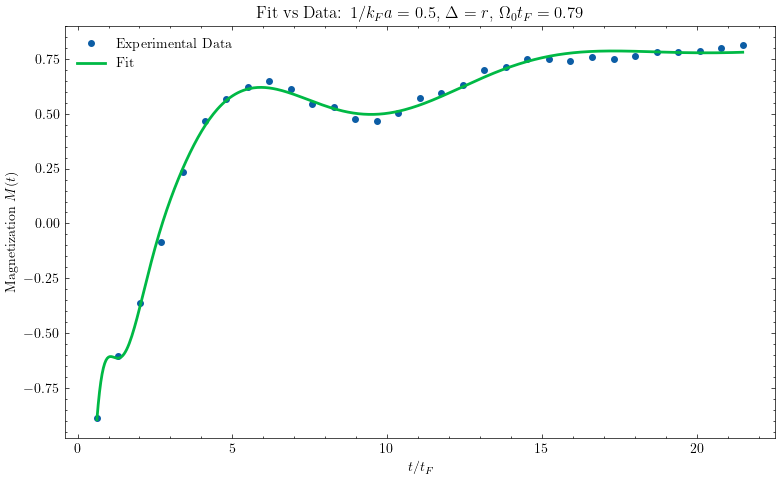

Saved 0 fit result figures to fit_results_all.pdf
0.39196884767467177


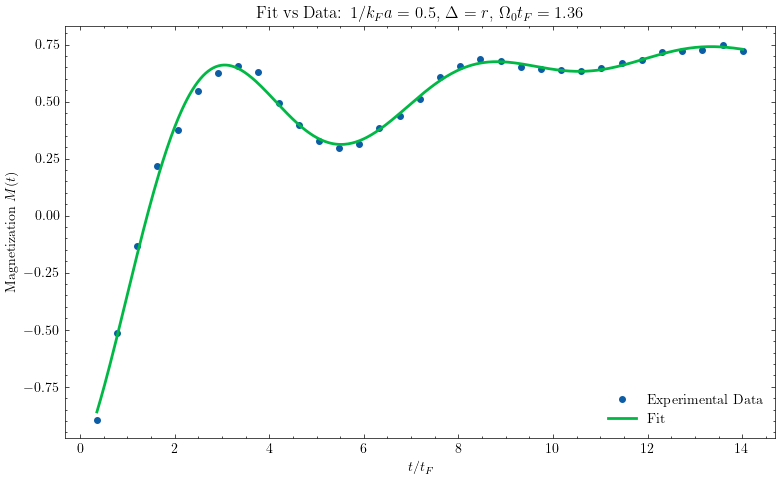

Saved 0 fit result figures to fit_results_all.pdf
0.27027431589990075


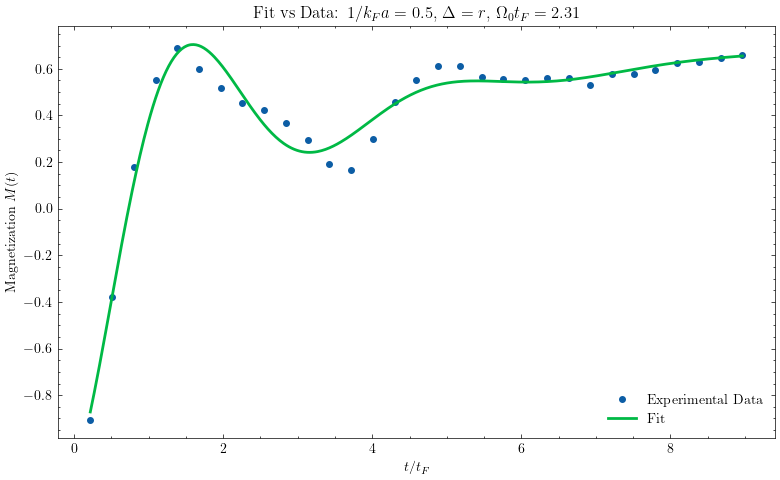

Saved 0 fit result figures to fit_results_all.pdf
0.49829707613646823


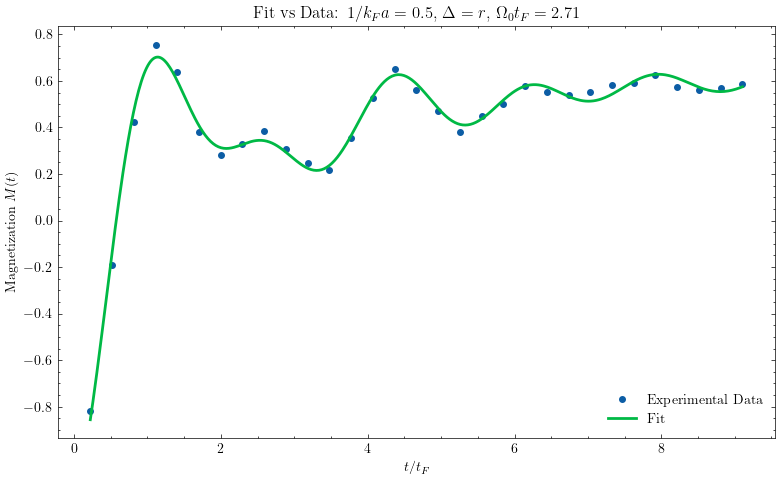

Saved 0 fit result figures to fit_results_all.pdf
0.5975682727714183


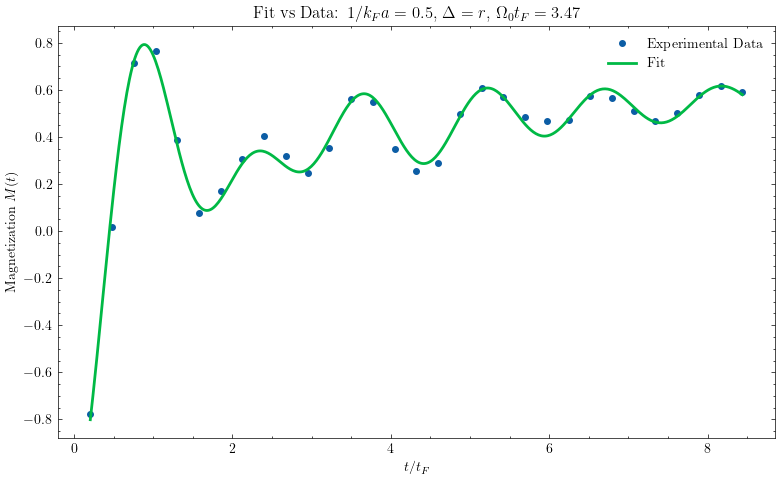

Saved 0 fit result figures to fit_results_all.pdf
0.6418327797967944


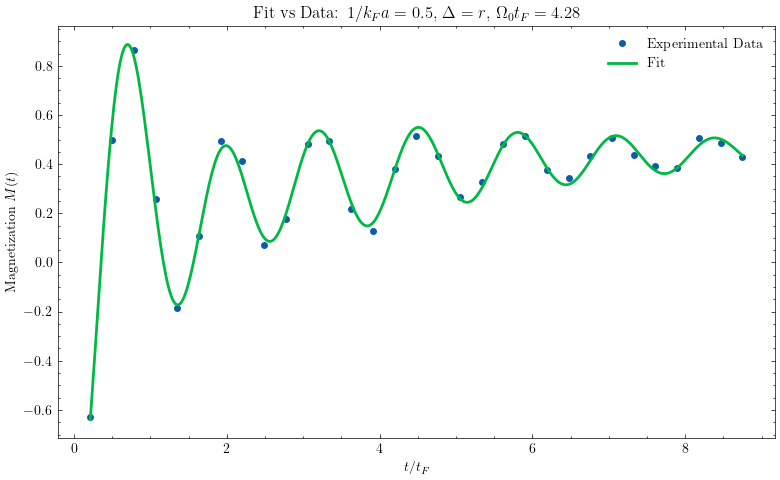

Saved 0 fit result figures to fit_results_all.pdf
0.6320942163651629


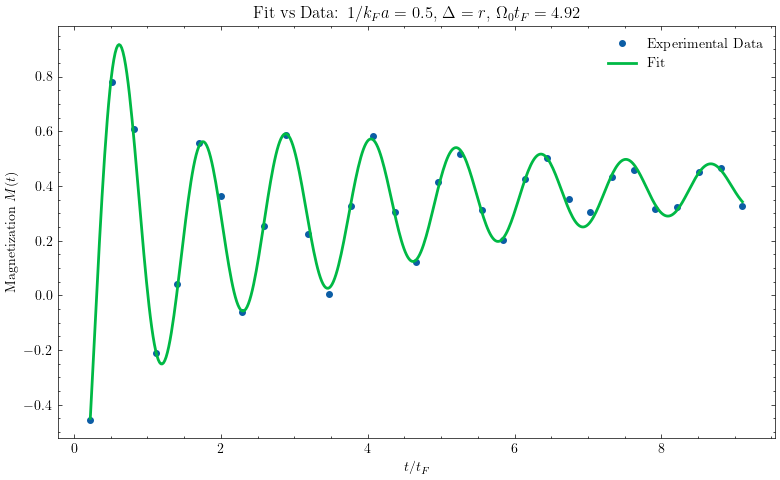

Saved 0 fit result figures to fit_results_all.pdf
0.7606622906437073


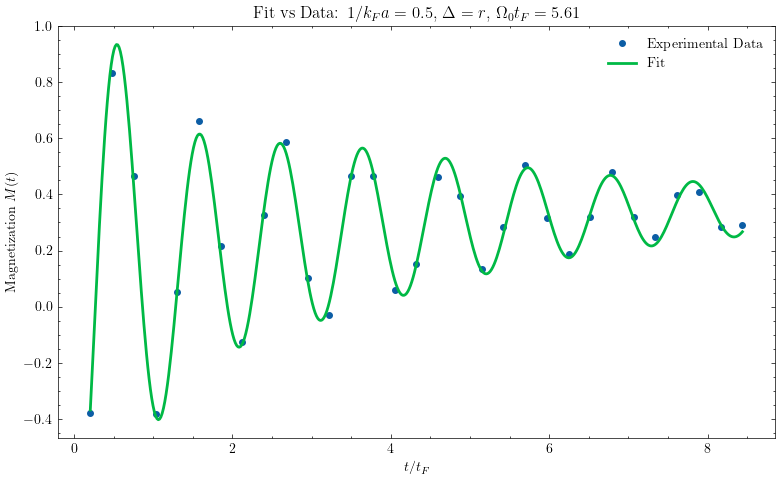

Saved 0 fit result figures to fit_results_all.pdf
31.263216609635784


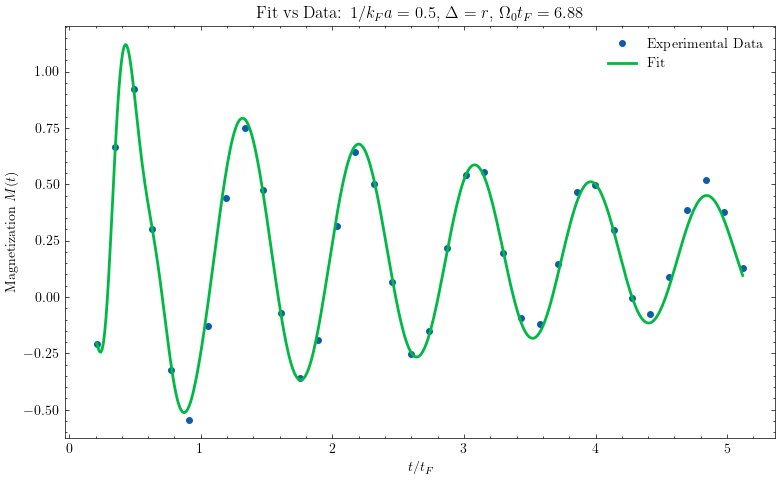

Saved 0 fit result figures to fit_results_all.pdf
0.7338637157894137


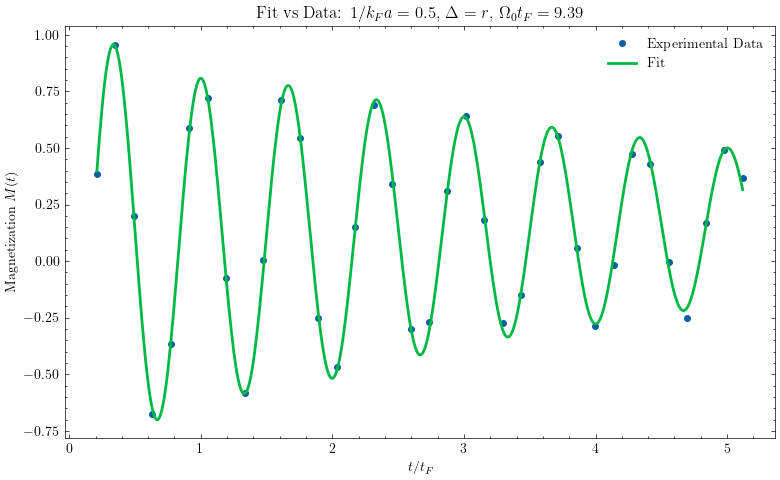

Saved 0 fit result figures to fit_results_all.pdf
[1.02 1.34 1.7  2.23 2.84 3.5  4.09 4.62 5.11 5.56 6.33 7.   8.78]
1.6009852441551353


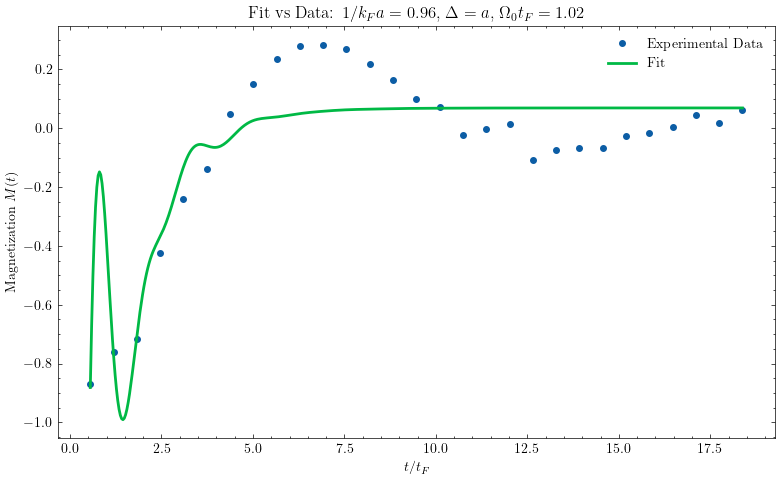

Saved 0 fit result figures to fit_results_all.pdf
0.4600720574392181


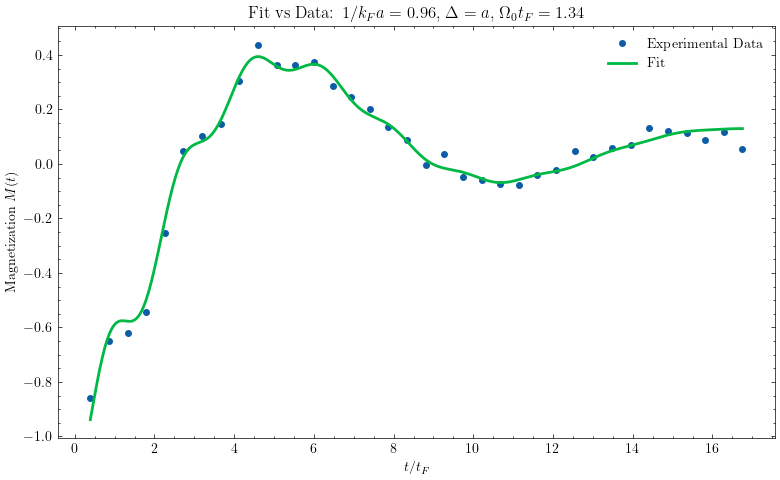

Saved 0 fit result figures to fit_results_all.pdf
2.8915262751242565


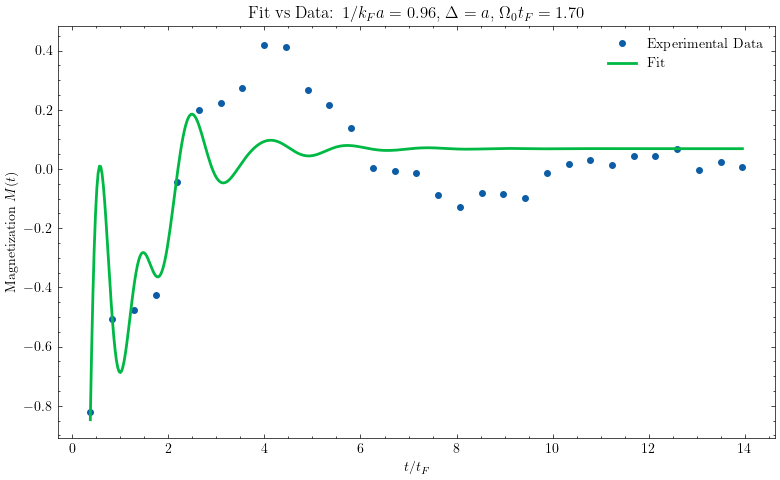

Saved 0 fit result figures to fit_results_all.pdf
3.322567280283663


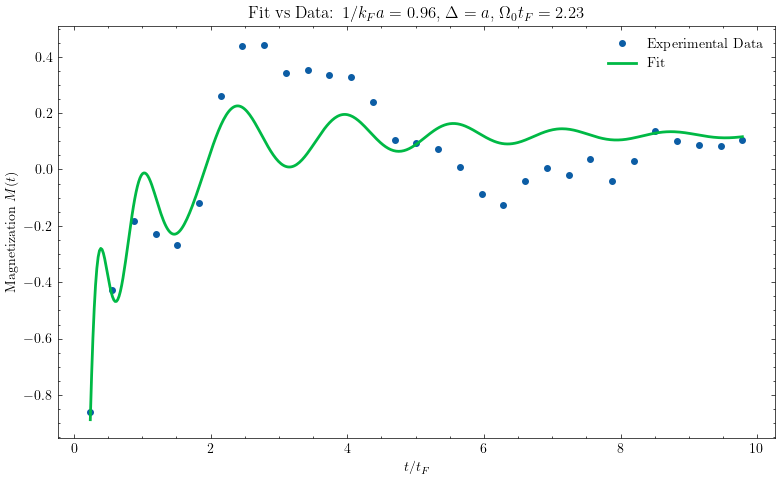

Saved 0 fit result figures to fit_results_all.pdf
4.429965231027419


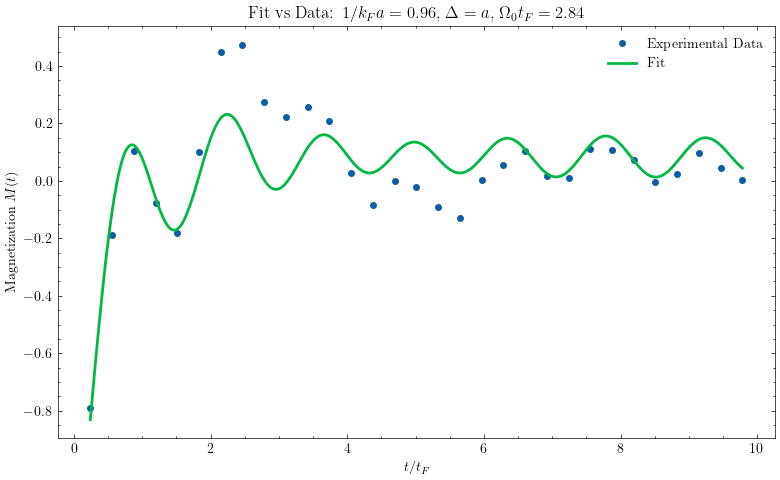

Saved 0 fit result figures to fit_results_all.pdf
17.795970588581792


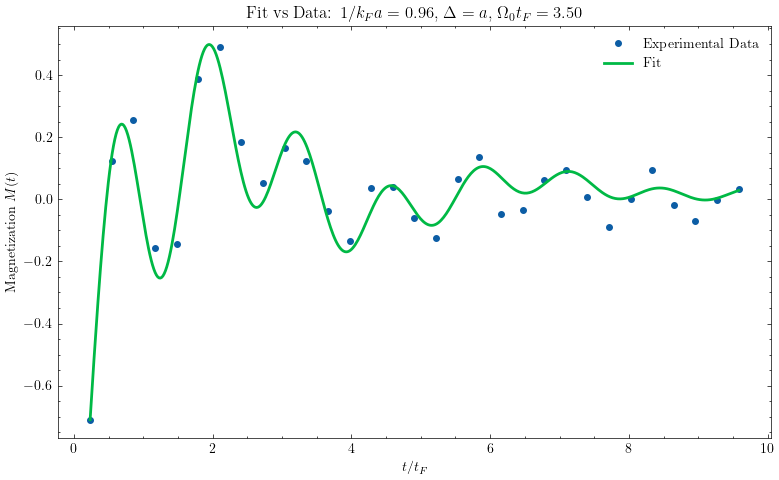

Saved 0 fit result figures to fit_results_all.pdf
0.6850411495449958


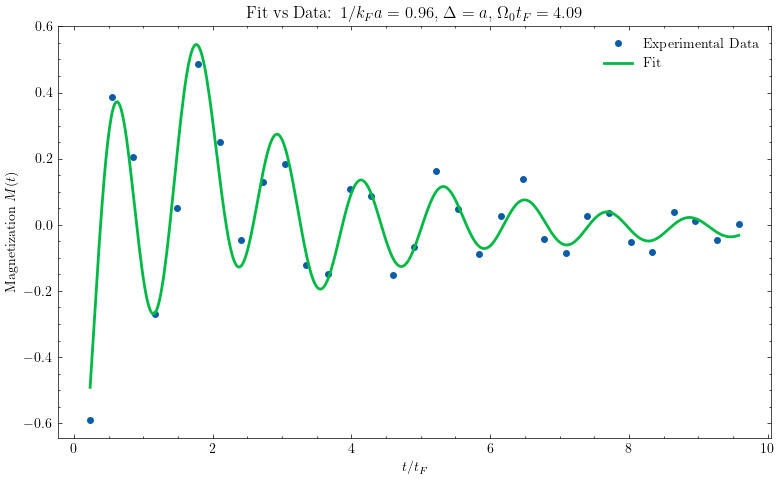

Saved 0 fit result figures to fit_results_all.pdf
14.599549052339654


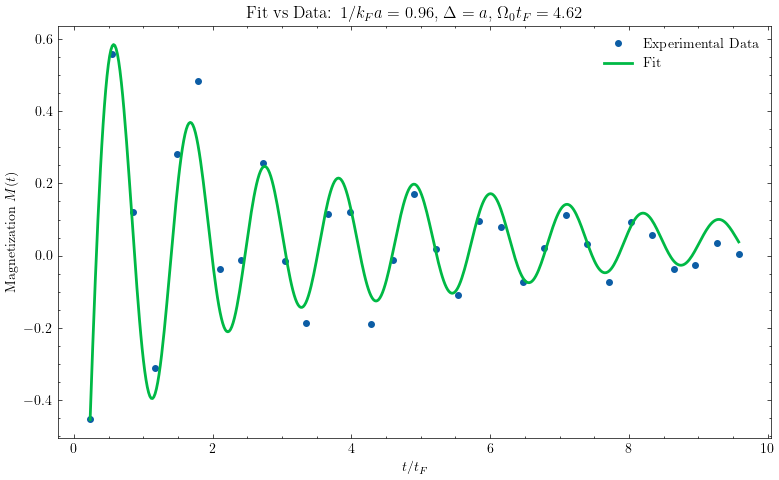

Saved 0 fit result figures to fit_results_all.pdf
1.3370695722451496


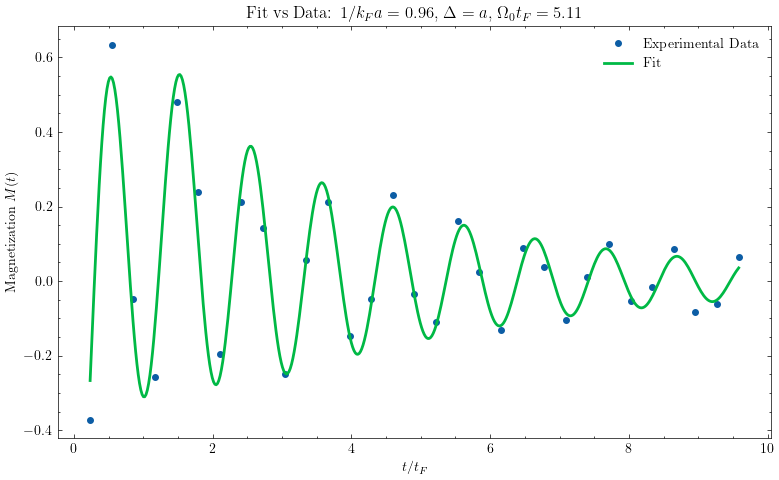

Saved 0 fit result figures to fit_results_all.pdf
5.094211603261727e-19


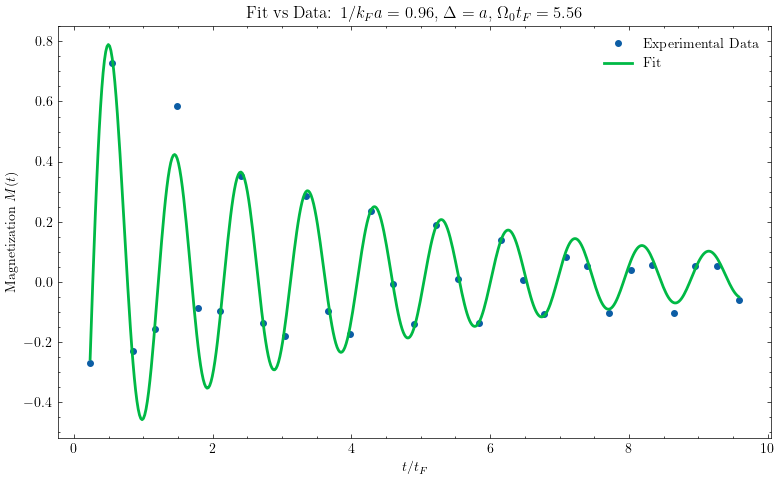

Saved 0 fit result figures to fit_results_all.pdf
0.00013685159521939868


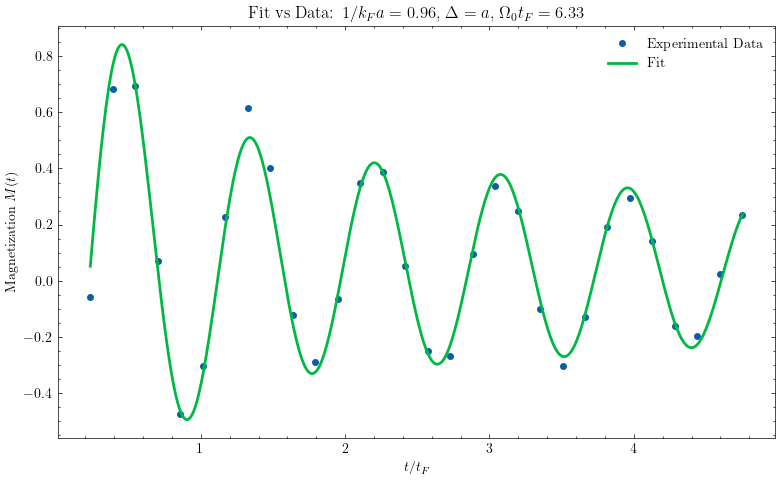

Saved 0 fit result figures to fit_results_all.pdf
0.0001139041088053629


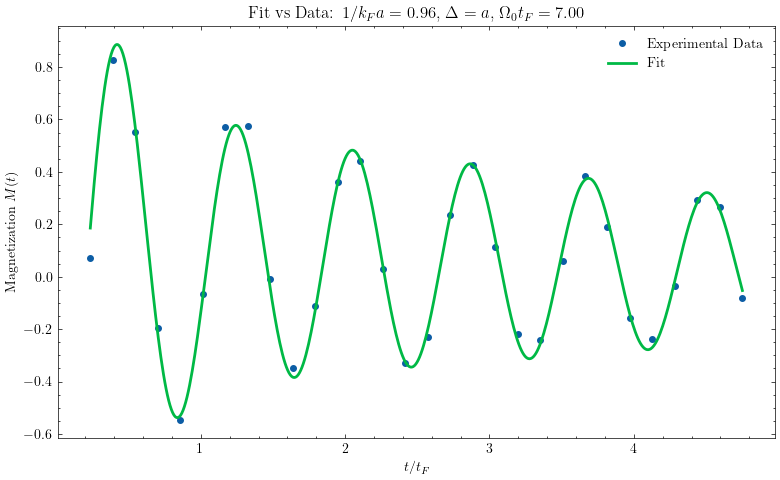

Saved 0 fit result figures to fit_results_all.pdf
0.000280926850436071


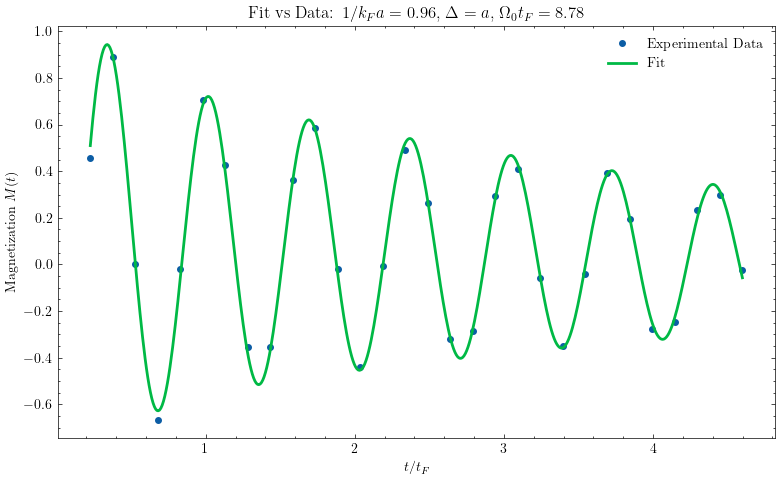

Saved 0 fit result figures to fit_results_all.pdf
[1.29 2.25 3.42 4.06 4.48 5.01 6.05 6.43 6.9  8.59]
0.28832805883813545


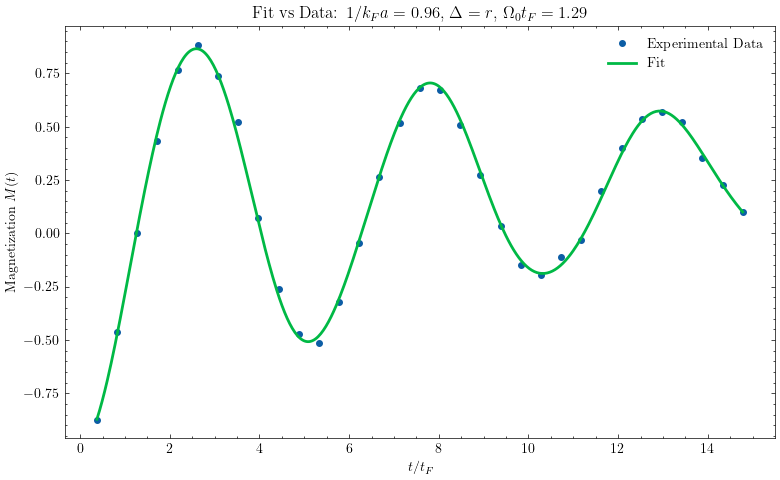

Saved 0 fit result figures to fit_results_all.pdf
0.448637500759667


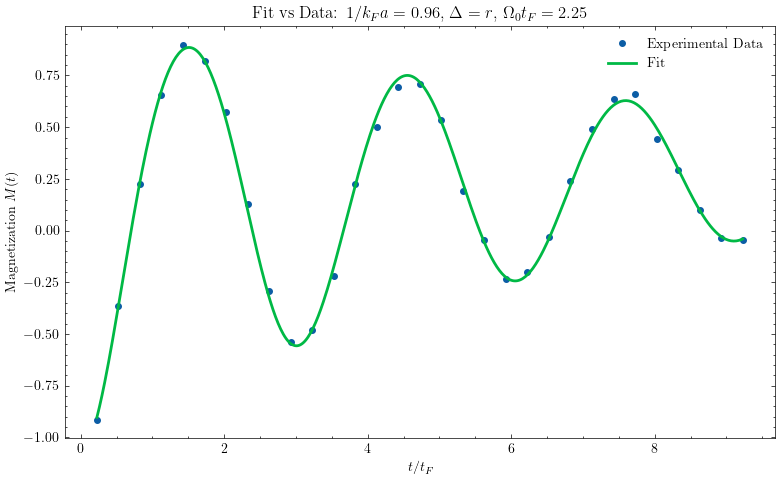

Saved 0 fit result figures to fit_results_all.pdf
0.3913556354999194


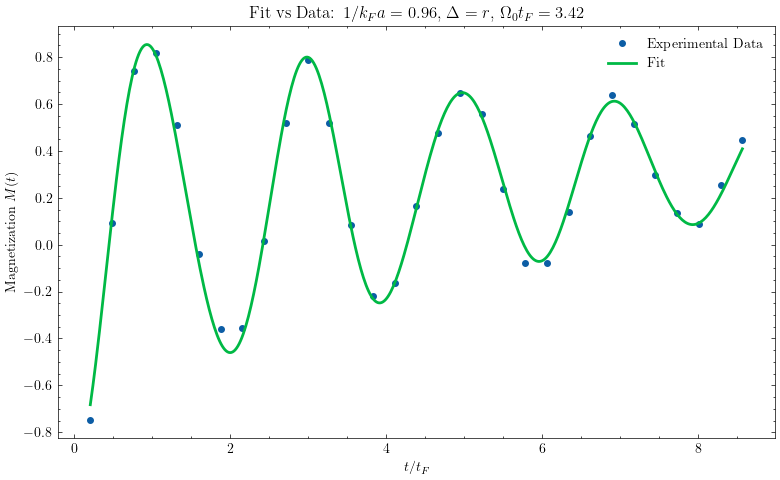

Saved 0 fit result figures to fit_results_all.pdf
0.032170269677248224


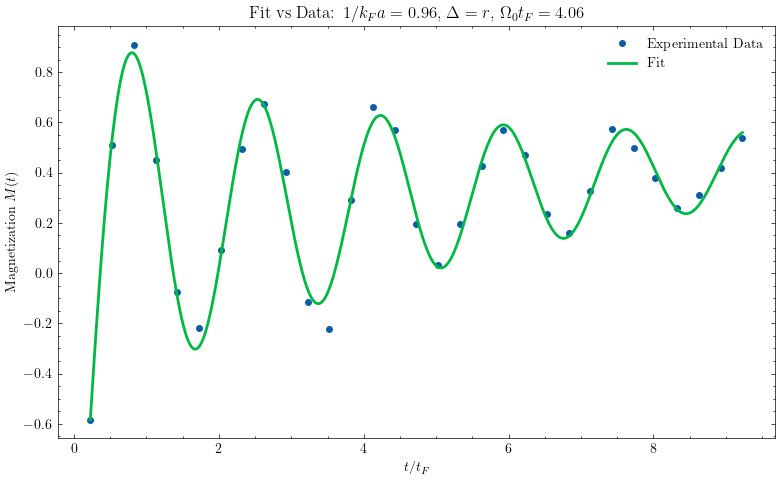

Saved 0 fit result figures to fit_results_all.pdf
0.5910501666389656


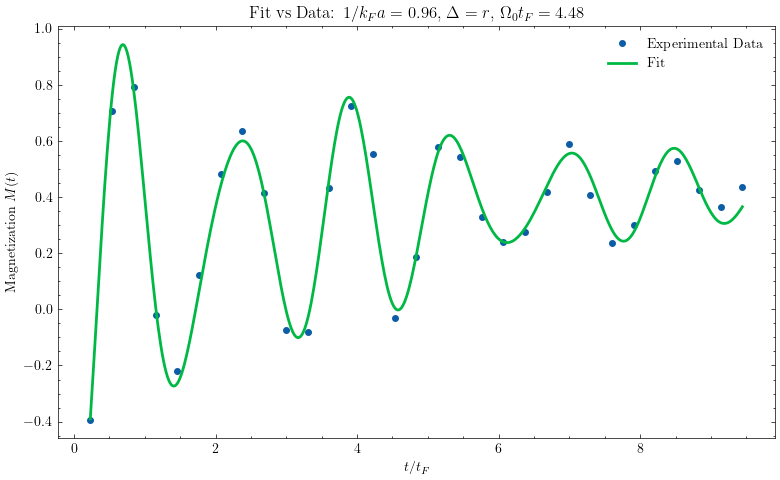

Saved 0 fit result figures to fit_results_all.pdf
0.8727538247566726


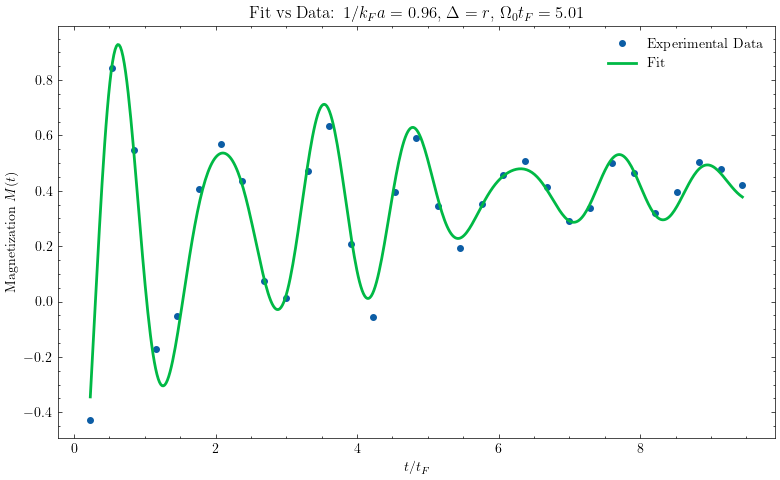

Saved 0 fit result figures to fit_results_all.pdf
0.7680075198745302


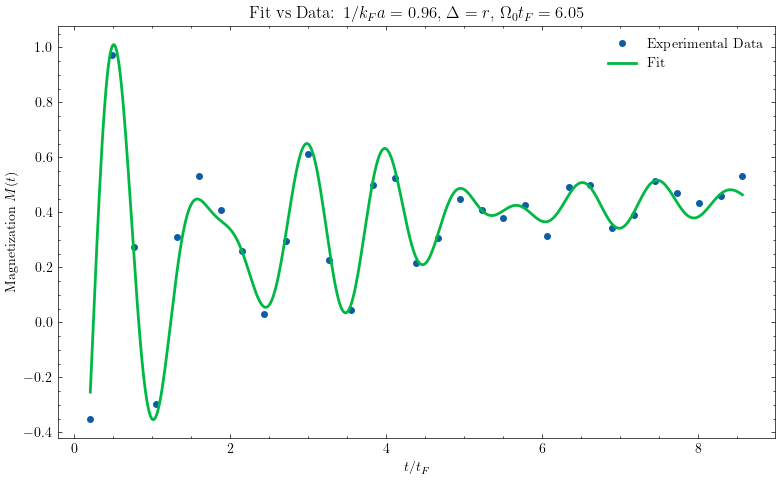

Saved 0 fit result figures to fit_results_all.pdf
2.761567835771878


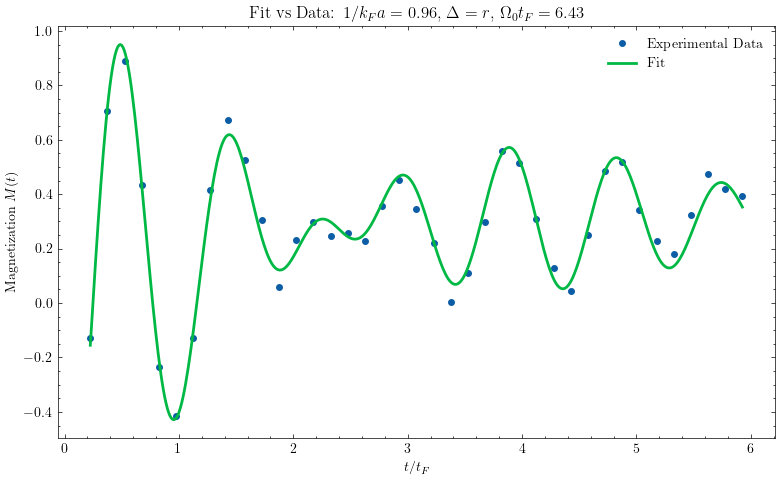

Saved 0 fit result figures to fit_results_all.pdf
3.8471511857306337


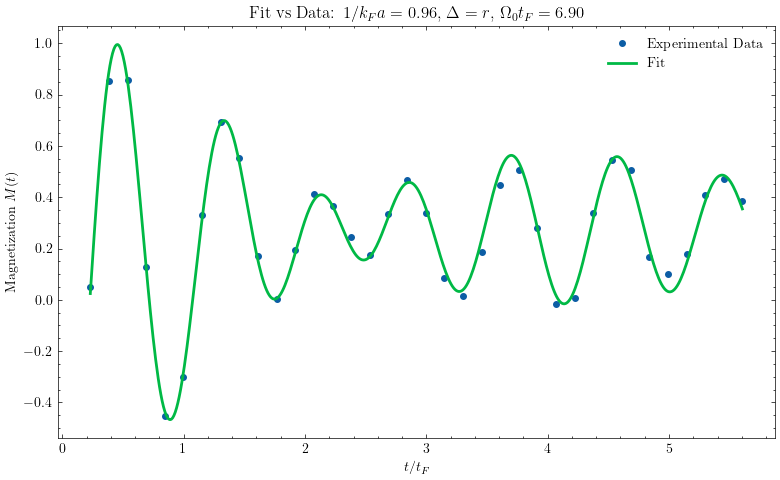

Saved 0 fit result figures to fit_results_all.pdf
3.3749620084866288


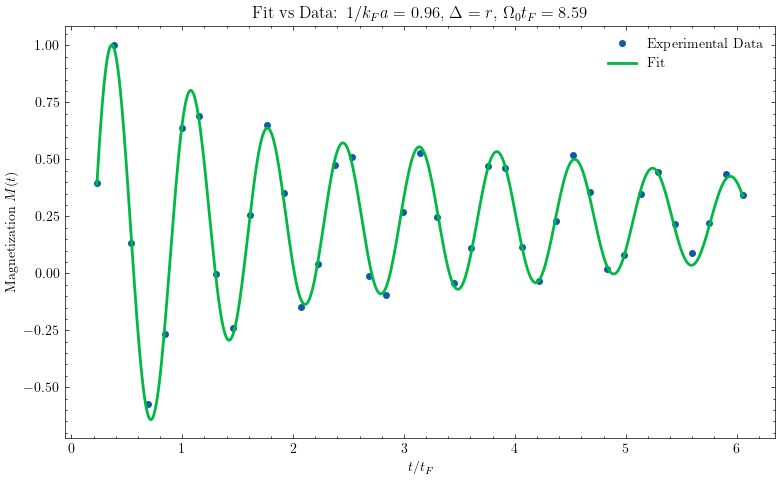

Saved 0 fit result figures to fit_results_all.pdf


In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

# Run fit for each Ω0_tF and store results in fit_results dict
fit_results = {}
for inv_kFa in inv_kFa_arr:
    for Δ in Δ_arr:
        Ω0_tF_arr = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
        print(Ω0_tF_arr)
        for Ω0 in Ω0_tF_arr:
            tus,t_to_tF,M_exp,Merr = np.loadtxt(f'time_series_data\\invkFa_{inv_kFa:.2f}_{Δ}\\RabiOsc_Omega0EF_{Ω0:.2f}.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
            t_tF_exp = t_to_tF[1:]
            M_exp_0 = M_exp[1:]
            popt, pcov, best_model, names, use_free = fit_bichromatic_ansatz(t_tF_exp, M_exp_0)
            print(popt[-1])
            # Store fit parameter values as dict for each Ω0
            fit_dict = dict(zip(names, popt)) if popt is not None else {}
            fit_results.setdefault((inv_kFa, Δ), []).append(fit_dict)
            # Plot fit vs data for each Ω0_tF
            plt.figure(figsize=(8, 5))
            plt.plot(t_tF_exp, M_exp_0, 'o', label='Experimental Data', markersize=4)
            if popt is not None:
                t_fit = np.linspace(t_tF_exp.min(), t_tF_exp.max(), 500)
                plt.plot(t_fit, best_model(t_fit, *popt), '-', label='Fit', linewidth=2)
            plt.title(fr'Fit vs Data: $1/k_Fa={inv_kFa}$, $\Delta={Δ}$, $\Omega_0 t_F={Ω0:.2f}$')
            plt.xlabel(r'$t/t_F$')
            plt.ylabel('Magnetization $M(t)$')
            plt.legend()
            plt.tight_layout()
            plt.show()
            # Get all current figure numbers and corresponding figure objects
            fig_nums = plt.get_fignums()
            figures = [plt.figure(n) for n in fig_nums]

            with PdfPages('fit_results_all.pdf') as pdf:
                for fig in figures:
                    pdf.savefig(fig)
                print(f"Saved {len(figures)} fit result figures to fit_results_all.pdf")

In [ ]:
# from matplotlib.backends.backend_pdf import PdfPages

# pdf_path = "fit_param_trends_all.pdf"
# count = 0

# with PdfPages(pdf_path) as pdf:
#     for inv_kFa in inv_kFa_arr:
#         for Δ in Δ_arr:
#             Ω0_tF_arr = Ω0_tF_arr_exp_dict[(inv_kFa, Δ)]
#             results = fit_results[(inv_kFa, Δ)]

#             # Find common parameter keys across result dicts, excluding A1/A2
#             keys = set.intersection(*(set(r.keys()) for r in results if r))
#             keys = {k for k in keys if k not in ("A1", "A2")}
#             if not keys:
#                 continue

#             # Optional: ensure everything is numpy arrays for indexing/filtering
#             Ω0_tF_arr = np.asarray(Ω0_tF_arr, dtype=float)

#             for pname in sorted(keys):
#                 vals = np.array([res.get(pname, np.nan) for res in results], dtype=float)

#                 # Optional: filter out NaNs so bad fits don't break the plot
#                 mask = ~np.isnan(vals)
#                 if not np.any(mask):
#                     continue

#                 fig, ax = plt.subplots(figsize=(8, 5))
#                 ax.plot(Ω0_tF_arr[mask], vals[mask], marker='o')
#                 ax.set_title(fr'{pname} vs $\Omega_0 t_F$ for $1/k_Fa={inv_kFa}$, $\Delta={Δ}$')
#                 ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
#                 ax.set_ylabel(pname)
#                 fig.tight_layout()

#                 pdf.savefig(fig, bbox_inches="tight")
#                 plt.close(fig)
#                 count += 1

# print(f"Saved {count} figures to {pdf_path}")
# # Note: avoid plt.show() before saving; if you want to view some plots,
# # create them in a separate pass or remove plt.close(fig) for debugging.


In [37]:
def Lorentzian(x, E0, Z, Gamma):
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

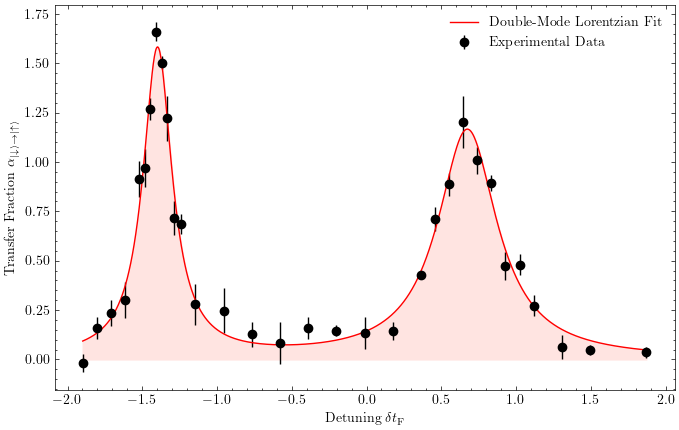

In [72]:
delta_tF_arr, alpha, alphaerr = np.loadtxt('C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\Ispec.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# initial guesses at k_F*a~2
Za = 0.4
Zr = 1-Za
Γa = 0.56*EF
Γr = 0.29*EF
Ea = -2.76*EF
Er = 0.42*EF

popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=(Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF))
plt.figure(figsize=(8, 5))
plt.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', label='Experimental Data', color='black')
plt.fill_between(np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3)), fit(np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3)), *popt), color='mistyrose')
plt.plot(np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3)), fit(np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3)), *popt), '-', label='Double-Mode Lorentzian Fit', color='red')
#plt.title(r'RF Injection Spectrum ($k_{\textrm{F}}a_{\uparrow b}\approx 2, E_{\textrm{F}}/h=6.1\text{ kHz}$)')
plt.xlabel(r'Detuning $\delta t_{\textrm{F}}$')
plt.ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')
plt.legend()

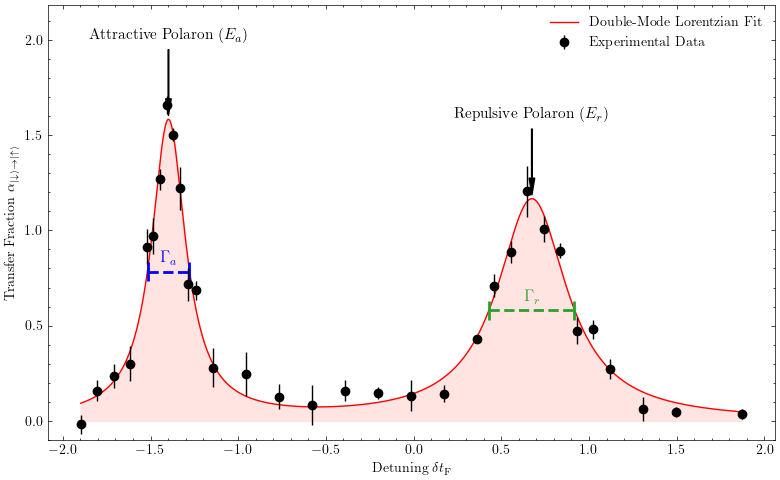

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Your Functions ---

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Data Loading ---

# Try to load the user's data file
try:
    delta_tF_arr, alpha, alphaerr = np.loadtxt('C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\Ispec.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
except (IOError, FileNotFoundError):
    # If the file isn't found, create mock data to allow the script to run
    print("Warning: Data file not found. Using mock data for demonstration.")
    # Mock data points (approximating from your image)
    delta_tF_arr = np.array([-1.9, -1.7, -1.6, -1.5, -1.45, -1.4, -1.35, -1.3, -1.2, -1.1, -0.7, -0.5, -0.2, 0.1, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1.2, 1.5, 1.9])
    alpha = np.array([0.0, 0.18, 0.25, 0.45, 0.95, 1.65, 1.2, 1.0, 0.7, 0.3, 0.1, 0.08, 0.15, 0.12, 0.25, 0.5, 0.75, 1.15, 0.95, 0.7, 0.2, 0.05, 0.04])
    alphaerr = np.ones_like(alpha) * 0.12
    alphaerr[5] = 0.15 # Taller error bar at the peak

# --- Constants and Guesses ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# initial guesses at k_F*a~2
Za = 0.4
Zr = 1-Za
Γa = 0.56*EF
Γr = 0.29*EF
Ea = -2.76*EF
Er = 0.42*EF

# --- Fitting ---
# The p0 values are normalized by EF, which is correct since
# the x-axis (delta_tF_arr) is also normalized/unitless.
popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=(Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF))

# --- Plotting ---

plt.figure(figsize=(8, 5))

# Plot data
plt.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', label='Experimental Data', color='black', zorder=10)

# Create a smooth x-axis for the fit line
x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
y_fit = fit(x_fit, *popt)

# Plot fit line and shaded area
plt.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
plt.plot(x_fit, y_fit, '-', label='Double-Mode Lorentzian Fit', color='red', zorder=5)

# ======================================================
# --- NEW ANNOTATIONS ---
# ======================================================

# 1. Extract fitted parameters
Ea_fit, Er_fit, Za_fit, Zr_fit, Gamma_a_fit, Gamma_r_fit = popt

# 2. Calculate individual peak amplitudes (A = 2*Z/Gamma) and FWHM y-levels
A_a_fit = 2 * Za_fit / Gamma_a_fit
A_r_fit = 2 * Zr_fit / Gamma_r_fit
fwhm_y_a = A_a_fit / 2
fwhm_y_r = A_r_fit / 2

# 3. Get the actual y-value of the *total fit* at the peak centers
peak_a_y = fit(Ea_fit, *popt)
peak_r_y = fit(Er_fit, *popt)

# 4. Add FWHM lines (Gamma_a, Gamma_r)
# We draw a horizontal line at the half-max of the *individual* peak
# with a width of Gamma.

# FWHM line for Attractive peak (left)
xmin_a = Ea_fit - Gamma_a_fit / 2
xmax_a = Ea_fit + Gamma_a_fit / 2
plt.hlines(y=fwhm_y_a, xmin=xmin_a, xmax=xmax_a, 
           color='blue', linestyle='--', linewidth=2, zorder=6)
# Add perpendicular "caps" to the FWHM line
plt.vlines(x=xmin_a, ymin=fwhm_y_a - 0.05, ymax=fwhm_y_a + 0.05, color='blue', linewidth=2, zorder=6)
plt.vlines(x=xmax_a, ymin=fwhm_y_a - 0.05, ymax=fwhm_y_a + 0.05, color='blue', linewidth=2, zorder=6)
# Add FWHM label
plt.text(Ea_fit, fwhm_y_a + 0.03, r'$\Gamma_a$', 
         ha='center', va='bottom', color='blue', fontsize=12)

# FWHM line for Repulsive peak (right)
xmin_r = Er_fit - Gamma_r_fit / 2
xmax_r = Er_fit + Gamma_r_fit / 2
plt.hlines(y=fwhm_y_r, xmin=xmin_r, xmax=xmax_r, 
           color='#2ca02c', linestyle='--', linewidth=2, zorder=6) # 'tab:green'
# Add perpendicular "caps" to the FWHM line
plt.vlines(x=xmin_r, ymin=fwhm_y_r - 0.05, ymax=fwhm_y_r + 0.05, color='#2ca02c', linewidth=2, zorder=6)
plt.vlines(x=xmax_r, ymin=fwhm_y_r - 0.05, ymax=fwhm_y_r + 0.05, color='#2ca02c', linewidth=2, zorder=6)
# Add FWHM label
plt.text(Er_fit, fwhm_y_r + 0.03, r'$\Gamma_r$', 
         ha='center', va='bottom', color='#2ca02c', fontsize=12)


# 5. Add peak labels (E_a, E_r) and polaron identification
# We use annotate to add arrows pointing to the peaks
# (Negative energy peak is 'attractive', positive is 'repulsive')

# Attractive Polaron (left peak)
plt.annotate(r'Attractive Polaron ($E_a$)',
             xy=(Ea_fit, peak_a_y),  # Point to the peak
             xytext=(Ea_fit, peak_a_y + 0.4),  # Text position
             ha='center', va='bottom', fontsize=11,
             arrowprops=dict(facecolor='black', shrink=0.05, 
                             width=0.5, headwidth=4, linestyle='-'))

# Repulsive Polaron (right peak)
plt.annotate(r'Repulsive Polaron ($E_r$)',
             xy=(Er_fit, peak_r_y),  # Point to the peak
             xytext=(Er_fit, peak_r_y + 0.4),  # Text position
             ha='center', va='bottom', fontsize=11,
             arrowprops=dict(facecolor='black', shrink=0.05, 
                             width=0.5, headwidth=4, linestyle='-'))

# ======================================================
# --- Original Plot Labels and Settings ---
# ======================================================

#plt.title(r'RF Injection Spectrum ($k_{\textrm{F}}a_{\uparrow b}\approx 2, E_{\textrm{F}}/h=6.1\text{ kHz}$)')
plt.xlabel(r'Detuning $\delta t_{\textrm{F}}$')
plt.ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')

# Adjust y-limits to make space for annotations
# Find the highest point (either peak or text) and add padding
max_y_annotation = max(peak_a_y + 0.4, peak_r_y + 0.4)
plt.ylim(bottom=-0.1, top=max_y_annotation + 0.2) # Add 0.2 padding

plt.legend()
plt.tight_layout() # Helps fit labels
plt.show()

Saved annotated plot to spectrum_lines_only.png


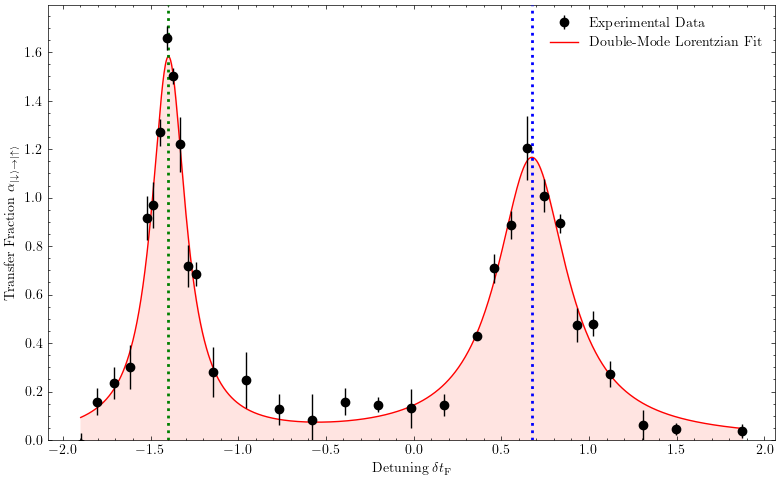

In [94]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Your Functions ---

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Data Loading ---

# Try to load the user's data file
try:
    # Corrected the path to use double backslashes for Windows paths in a string
    delta_tF_arr, alpha, alphaerr = np.loadtxt('C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\Ispec.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
except (IOError, FileNotFoundError):
    # If the file isn't found, create mock data to allow the script to run
    print("Warning: Data file not found. Using mock data for demonstration.")
    # Mock data points (approximating from your image)
    delta_tF_arr = np.array([-1.9, -1.7, -1.6, -1.5, -1.45, -1.4, -1.35, -1.3, -1.2, -1.1, -0.7, -0.5, -0.2, 0.1, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1.2, 1.5, 1.9])
    alpha = np.array([0.0, 0.18, 0.25, 0.45, 0.95, 1.65, 1.2, 1.0, 0.7, 0.3, 0.1, 0.08, 0.15, 0.12, 0.25, 0.5, 0.75, 1.15, 0.95, 0.7, 0.2, 0.05, 0.04])
    alphaerr = np.ones_like(alpha) * 0.12
    alphaerr[5] = 0.15 # Taller error bar at the peak

# --- Constants and Guesses ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# initial guesses at k_F*a~2
Za = 0.4
Zr = 1-Za
Γa = 0.56*EF
Γr = 0.29*EF
Ea = -2.76*EF
Er = 0.42*EF

# --- Fitting ---
popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=(Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF))

# --- Plotting ---

plt.figure(figsize=(8, 5))

# Plot data
plt.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', label='Experimental Data', color='black', zorder=10)

# Create a smooth x-axis for the fit line
x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
y_fit = fit(x_fit, *popt)

# Plot fit line and shaded area
# Keep the fit line red as in the original plot
plt.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
plt.plot(x_fit, y_fit, '-', label='Double-Mode Lorentzian Fit', color='red', zorder=5)

# ======================================================
# --- UPDATED ANNOTATIONS (no labels, just lines) ---
# ======================================================

# 1. Define colors (though not explicitly used for labels now)
color_a = 'green'  # Attractive polaron (left)
color_r = 'blue'    # Repulsive polaron (right)

# 2. Extract fitted parameters
Ea_fit, Er_fit, Za_fit, Zr_fit, Gamma_a_fit, Gamma_r_fit = popt

# 3. Calculate individual peak amplitudes (A = 2*Z/Gamma) and FWHM y-levels
A_a_fit = 2 * Za_fit / Gamma_a_fit
A_r_fit = 2 * Zr_fit / Gamma_r_fit
fwhm_y_a = A_a_fit / 2
fwhm_y_r = A_r_fit / 2

# 4. Get the actual y-value of the *total fit* at the peak centers (not used for this iteration but kept for context)
# peak_a_y = fit(Ea_fit, *popt)
# peak_r_y = fit(Er_fit, *popt)

# 6. Add Energy vertical lines (E_a, E_r) - now just the lines, no text labels
# Attractive (left, green)
plt.axvline(x=Ea_fit, color=color_a, linestyle=':', linewidth=2, zorder=6)

# Repulsive (right, red)
plt.axvline(x=Er_fit, color=color_r, linestyle=':', linewidth=2, zorder=6)

# 7. Quasiparticle Residue labels (Z_a, Z_r) and Polaron identification text are removed

# ======================================================
# --- Original Plot Labels and Settings ---
# ======================================================

#plt.title(r'RF Injection Spectrum ($k_{\textrm{F}}a_{\uparrow b}\approx 2, E_{\textrm{F}}/h=6.1\text{ kHz}$)')

# Use \mathrm{} (mathtext) instead of \textrm{} (full LaTeX) for axis label
plt.xlabel(r'Detuning $\delta t_{\mathrm{F}}$') 
plt.ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')

# Adjust y-limits to make space for annotations (can be slightly reduced as text is gone)
plt.ylim(bottom=0, top=plt.ylim()[1]) # Keep current top limit or adjust if needed

# Re-order legend to put data first
handles, labels = plt.gca().get_legend_handles_labels()
order = [1, 0] # 1 is 'Experimental Data', 0 is 'Fit'
plt.legend([handles[idx] for idx in order], [labels[idx] for idx in order])

plt.tight_layout() # Helps fit labels
plt.savefig("spectrum_lines_only.png", dpi=1000)
print("Saved annotated plot to spectrum_lines_only.png")

Saved annotated plot to spectrum_with_labels_v3.png


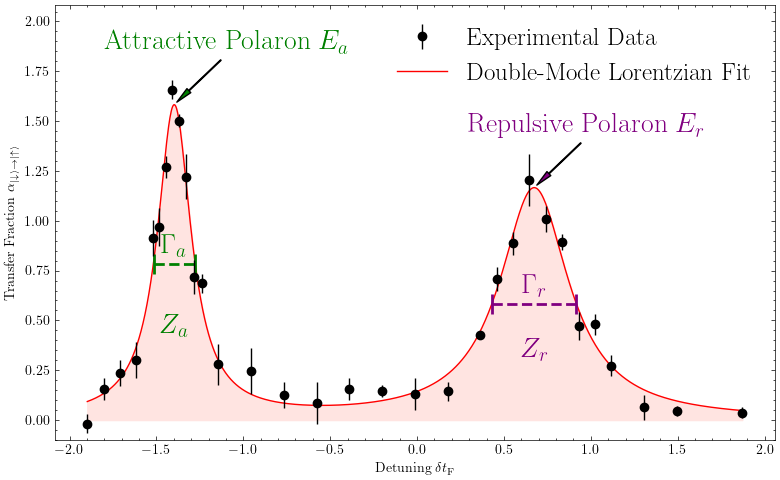

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Your Functions ---

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Data Loading ---

# Try to load the user's data file
try:
    # Corrected the path to use double backslashes for Windows paths in a string
    delta_tF_arr, alpha, alphaerr = np.loadtxt('C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\inv_kFa_0.5.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
except (IOError, FileNotFoundError):
    # If the file isn't found, create mock data to allow the script to run
    print("Warning: Data file not found. Using mock data for demonstration.")
    # Mock data points (approximating from your image)
    delta_tF_arr = np.array([-1.9, -1.7, -1.6, -1.5, -1.45, -1.4, -1.35, -1.3, -1.2, -1.1, -0.7, -0.5, -0.2, 0.1, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1.2, 1.5, 1.9])
    alpha = np.array([0.0, 0.18, 0.25, 0.45, 0.95, 1.65, 1.2, 1.0, 0.7, 0.3, 0.1, 0.08, 0.15, 0.12, 0.25, 0.5, 0.75, 1.15, 0.95, 0.7, 0.2, 0.05, 0.04])
    alphaerr = np.ones_like(alpha) * 0.12
    alphaerr[5] = 0.15 # Taller error bar at the peak

# --- Constants and Guesses ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# initial guesses at k_F*a~2
Za = 0.4
Zr = 1-Za
Γa = 0.56*EF
Γr = 0.29*EF
Ea = -2.76*EF
Er = 0.42*EF

# --- Fitting ---
popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=(Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF))

# --- Plotting ---

plt.figure(figsize=(8, 5))

# Plot data
plt.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', label='Experimental Data', color='black', zorder=10)

# Create a smooth x-axis for the fit line
x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
y_fit = fit(x_fit, *popt)

# Plot fit line and shaded area
# Keep the fit line red as in the original plot
plt.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
plt.plot(x_fit, y_fit, '-', label='Double-Mode Lorentzian Fit', color='red', zorder=5)

# ======================================================
# --- NEW ANNOTATIONS (v3) ---
# ======================================================

# 1. Define colors
color_a = 'green'  # Attractive polaron (left)
color_r = 'purple'    # Repulsive polaron (right) - Changed from 'blue' in your code to 'red'

# 2. Extract fitted parameters
Ea_fit, Er_fit, Za_fit, Zr_fit, Gamma_a_fit, Gamma_r_fit = popt

# 3. Calculate individual peak amplitudes (A = 2*Z/Gamma) and FWHM y-levels
A_a_fit = 2 * Za_fit / Gamma_a_fit
A_r_fit = 2 * Zr_fit / Gamma_r_fit
fwhm_y_a = A_a_fit / 2
fwhm_y_r = A_r_fit / 2

# 4. Get the actual y-value of the *total fit* at the peak centers
peak_a_y = fit(Ea_fit, *popt)
peak_r_y = fit(Er_fit, *popt)

# 5. Add FWHM lines (Gamma_a, Gamma_r)
# FWHM line for Attractive peak (left, green)
xmin_a = Ea_fit - Gamma_a_fit / 2
xmax_a = Ea_fit + Gamma_a_fit / 2
plt.hlines(y=fwhm_y_a, xmin=xmin_a, xmax=xmax_a, 
           color=color_a, linestyle='--', linewidth=2, zorder=6)
# Add perpendicular "caps" to the FWHM line
plt.vlines(x=xmin_a, ymin=fwhm_y_a - 0.05, ymax=fwhm_y_a + 0.05, color=color_a, linewidth=2, zorder=6)
plt.vlines(x=xmax_a, ymin=fwhm_y_a - 0.05, ymax=fwhm_y_a + 0.05, color=color_a, linewidth=2, zorder=6)
# Add FWHM label
plt.text(Ea_fit, fwhm_y_a + 0.03, r'$\Gamma_a$', 
         ha='center', va='bottom', color=color_a, fontsize=20)

# FWHM line for Repulsive peak (right, red)
xmin_r = Er_fit - Gamma_r_fit / 2
xmax_r = Er_fit + Gamma_r_fit / 2
plt.hlines(y=fwhm_y_r, xmin=xmin_r, xmax=xmax_r, 
           color=color_r, linestyle='--', linewidth=2, zorder=6)
# Add perpendicular "caps" to the FWHM line
plt.vlines(x=xmin_r, ymin=fwhm_y_r - 0.05, ymax=fwhm_y_r + 0.05, color=color_r, linewidth=2, zorder=6)
plt.vlines(x=xmax_r, ymin=fwhm_y_r - 0.05, ymax=fwhm_y_r + 0.05, color=color_r, linewidth=2, zorder=6)
# Add FWHM label
plt.text(Er_fit, fwhm_y_r + 0.03, r'$\Gamma_r$', 
         ha='center', va='bottom', color=color_r, fontsize=20)

# 6. Add Energy labels (E_a, E_r) with arrows
# Attractive (left, green)
plt.annotate(r'Attractive Polaron $E_a$',
             xy=(Ea_fit, peak_a_y),  # Point to the peak
             xytext=(Ea_fit+0.3, peak_a_y + 0.25),  # Text position
             ha='center', va='bottom', fontsize=20, color=color_a,
             arrowprops=dict(facecolor=color_a, shrink=0.05, 
                             width=0.5, headwidth=4, linestyle='-'))

# Repulsive (right, red)
plt.annotate(r'Repulsive Polaron $E_r$',
             xy=(Er_fit, peak_r_y),  # Point to the peak
             xytext=(Er_fit+0.3, peak_r_y + 0.25),  # Text position
             ha='center', va='bottom', fontsize=20, color=color_r,
             arrowprops=dict(facecolor=color_r, shrink=0.05, 
                             width=0.5, headwidth=4, linestyle='-'))

# 7. Add Quasiparticle Residue labels (Z_a, Z_r) inside peaks
# Attractive (left, green)
plt.text(Ea_fit, peak_a_y * 0.3, r'$Z_a$', 
         color=color_a, ha='center', va='center', fontsize=20, weight='bold')

# Repulsive (right, purple)
plt.text(Er_fit, peak_r_y * 0.3, r'$Z_r$', 
         color=color_r, ha='center', va='center', fontsize=20, weight='bold')

# ======================================================
# --- Original Plot Labels and Settings ---
# ======================================================

#plt.title(r'RF Injection Spectrum ($k_{\textrm{F}}a_{\uparrow b}\approx 2, E_{\textrm{F}}/h=6.1\text{ kHz}$)')

# Use \mathrm{} (mathtext) instead of \textrm{} (full LaTeX) for axis label
plt.xlabel(r'Detuning $\delta t_{\mathrm{F}}$') 
plt.ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')

# Adjust y-limits to make space for annotations
max_y = max(peak_a_y, peak_r_y)
plt.ylim(bottom=-0.1, top=max_y + 0.5) # Add padding above the highest peak/annotation

# Re-order legend to put data first
handles, labels = plt.gca().get_legend_handles_labels()
order = [1, 0] # 1 is 'Experimental Data', 0 is 'Fit'
plt.legend([handles[idx] for idx in order], [labels[idx] for idx in order], fontsize=18)

plt.tight_layout() # Helps fit labels
plt.savefig("spectrum_with_labels_v3.png", dpi=1000)
print("Saved annotated plot to spectrum_with_labels_v3.png")

Saved minimal plot to spectrum_kFa_0.5.png


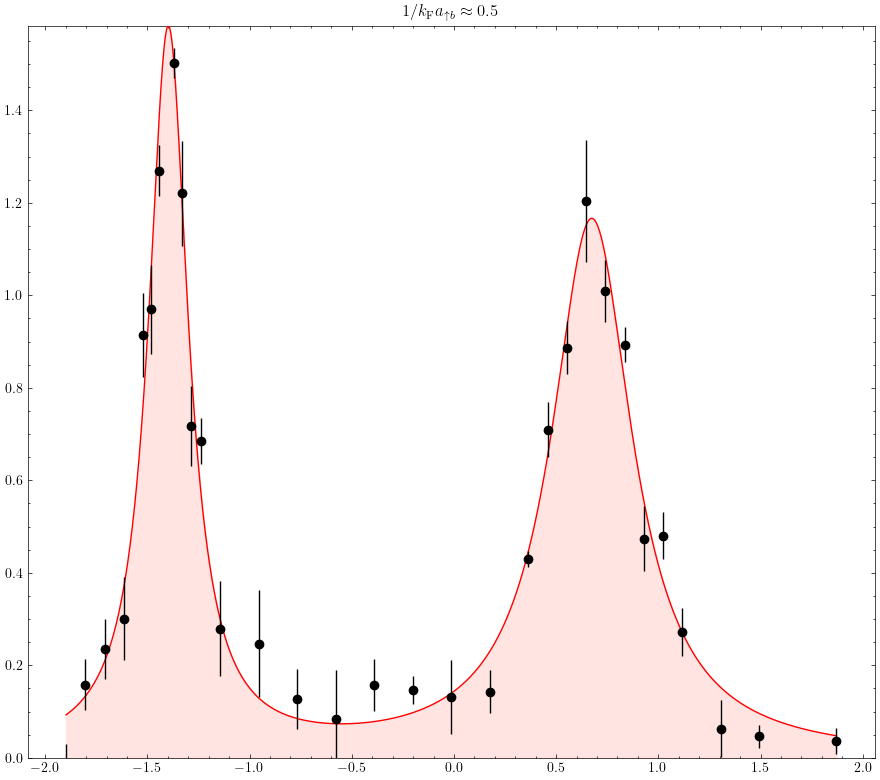

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import scienceplots
plt.style.use(['science'])

# --- Your Functions ---

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Data Loading ---

# Try to load the user's data file
try:
    # Corrected the path to use double backslashes for Windows paths in a string
    delta_tF_arr, alpha, alphaerr = np.loadtxt('C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\inv_kFa_0.5.csv', dtype=np.float64, delimiter=',', skiprows=1, unpack=True)
except (IOError, FileNotFoundError):
    # If the file isn't found, create mock data to allow the script to run
    print("Warning: Data file not found. Using mock data for demonstration.")
    # Mock data points (approximating from your image)
    delta_tF_arr = np.array([-1.9, -1.7, -1.6, -1.5, -1.45, -1.4, -1.35, -1.3, -1.2, -1.1, -0.7, -0.5, -0.2, 0.1, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1.2, 1.5, 1.9])
    alpha = np.array([0.0, 0.18, 0.25, 0.45, 0.95, 1.65, 1.2, 1.0, 0.7, 0.3, 0.1, 0.08, 0.15, 0.12, 0.25, 0.5, 0.75, 1.15, 0.95, 0.7, 0.2, 0.05, 0.04])
    alphaerr = np.ones_like(alpha) * 0.12
    alphaerr[5] = 0.15 # Taller error bar at the peak

# --- Constants and Guesses ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# initial guesses at k_F*a~2
Za = 0.4
Zr = 1-Za
Γa = 0.56*EF
Γr = 0.29*EF
Ea = -2.76*EF
Er = 0.42*EF

# --- Fitting ---
popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=(Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF))

# --- Plotting ---

plt.figure(figsize=(9, 8))

# Plot data
# Removed 'label' from errorbar
plt.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', color='black', zorder=10)

# Create a smooth x-axis for the fit line
x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
y_fit = fit(x_fit, *popt)

# Plot fit line and shaded area
# Removed 'label' from plot
plt.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
plt.plot(x_fit, y_fit, '-', color='red', zorder=5)

# ======================================================
# --- ALL ANNOTATIONS REMOVED ---
# ======================================================

# 2. Extract fitted parameters
Ea_fit, Er_fit, Za_fit, Zr_fit, Gamma_a_fit, Gamma_r_fit = popt

# 4. Get the actual y-value of the *total fit* at the peak centers
# (Kept for adjusting y-limits)
peak_a_y = fit(Ea_fit, *popt)
peak_r_y = fit(Er_fit, *popt)

# Blocks 5, 6, and 7 (FWHM lines, Energy labels, Residue labels) are all removed.

# ======================================================
# --- Original Plot Labels and Settings (Stripped Down) ---
# ======================================================

# Title is commented out
plt.title(r'$1/k_{\mathrm{F}}a_{\uparrow b}\approx 0.5$')

# Labels are removed
# plt.xlabel(r'Detuning $\delta t_{\mathrm{F}}$') 
# plt.ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')

# Adjust y-limits to make space for annotations (still useful)
max_y = max(peak_a_y, peak_r_y)
plt.ylim(bottom=0, top=max_y) # Add padding above the highest peak/annotation

# Legend is removed
# handles, labels = plt.gca().get_legend_handles_labels()
# order = [1, 0] # 1 is 'Experimental Data', 0 is 'Fit'
# plt.legend([handles[idx] for idx in order], [labels[idx] for idx in order], fontsize=18)

plt.tight_layout() # Helps fit labels
# Saving with a new name to avoid overwriting your original
plt.savefig("spectrum_kFa_0.5.png", dpi=1000)
print("Saved minimal plot to spectrum_kFa_0.5.png")

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


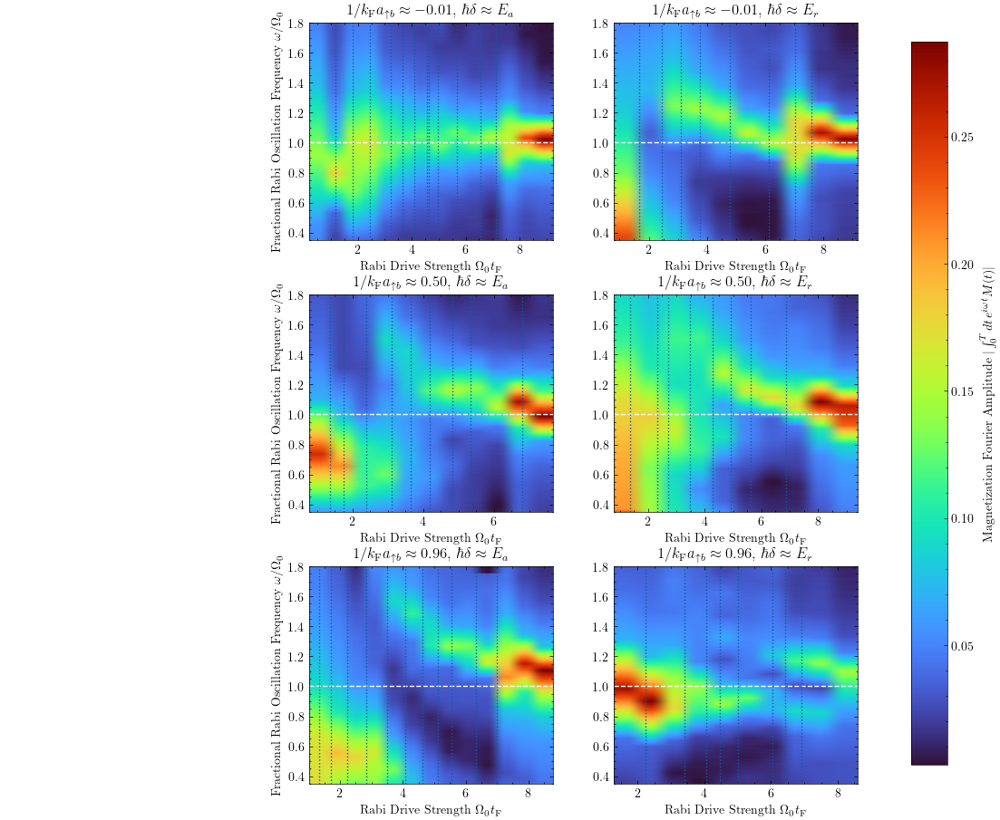

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path
from scipy.fft import rfft, rfftfreq

# --- Define Parameters ---
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Create figure & axes grid ---
# Create a 3x3 grid as before
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
plt.subplots_adjust(left=0.08, right=0.92, top=0.92, bottom=0.08,
                    wspace=0.25, hspace=0.25)

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if
            text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    for j_det, Δ in enumerate(Δ_arr):
        # Construct the path using pathlib for better cross-platform compatibility
        # Note: Using forward slashes is generally safer.
        time_series_path = Path(f'time_series_data/invkFa_{inv_kFa:.2f}_{Δ}')
        
        Ω0_tF_arr_exp = []

        # Check if directory exists before trying to glob
        if time_series_path.is_dir():
            # Collect Ω0_tF values from filenames
            for file in sorted(time_series_path.glob('*.csv'),
                               key=lambda x: natural_sort_key(x.name)):
                match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
                if match:
                    Ω0_tF_arr_exp.append(float(match.group(1)))
            
            Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
            
            # Continue only if files were found
            if Ω0_tF_arr_exp.size > 0:
                N_Ω0_exp = Ω0_tF_arr_exp.size
                abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

                print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

                # --- Load data & compute Fourier amplitude ---
                for i, Ω0 in enumerate(Ω0_tF_arr_exp):
                    file_path = time_series_path / f'RabiOsc_Omega0EF_{Ω0:.2f}.csv'
                    try:
                        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                            file_path,
                            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                        )
                        t_exp = tus[1:] * 1e-6
                        t_tF_exp = t_tF[1:]
                        M_exp_0 = M_exp[1:]

                        M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
                        ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
                        ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

                        abs_M_exp_0_hat_interp[i, :] = np.interp(
                            ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                            left=0, right=0
                        )
                    except FileNotFoundError:
                        print(f"Warning: File not found {file_path}")
                    except ValueError as e:
                        print(f"Warning: Error loading {file_path}. {e}")
                        
                # --- Plot ---
                #
                # *** MODIFICATION IS HERE ***
                # Plot on axes[i_inv, j_det + 1] instead of axes[i_inv, j_det]
                # This shifts the plots from columns 0, 1 to columns 1, 2
                #
                ax = axes[i_inv, j_det + 1]
                im = ax.imshow(
                    abs_M_exp_0_hat_interp.T,
                    aspect='auto',
                    cmap='turbo',
                    extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                            ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
                    origin='lower',
                )
                ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                            color='white', linestyles='dashed')
                for Ω0_tF in Ω0_tF_arr_exp:
                    ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                                ymax=ω_Ω0_arr_exp.max(), linestyles='dotted')

                ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
                ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
                ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
                
                # Only set y-label for the new first column of plots (column index 1)
                if j_det == 0:
                    ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')

                ax.set_title(
                    fr'$1/k_{{\text F}}a_{{\uparrow b}}\approx{inv_kFa:.2f}$, '
                    # Use the variable Δ which is 'a' or 'r'
                    fr'$\hbar\delta\approx E_{{{Δ}}}$' 
                )
            else:
                print(f"Warning: No data files found for {inv_kFa=}, {Δ=}")
                # Optionally turn off the unused axis
                ax = axes[i_inv, j_det + 1]
                ax.axis('off')
        else:
            print(f"Warning: Directory not found {time_series_path}")
            # Optionally turn off the unused axes
            ax = axes[i_inv, j_det + 1]
            ax.axis('off')

# --- Turn off axes for the now-empty left column (column 0) ---
for i in range(3):
    axes[i, 0].axis('off')

# --- Shared colorbar & title ---
# 'im' will be from the last successful plot
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95,
                    label=r'DFT Amplitude $|M(\omega)|$')
#fig.suptitle('Experimental Rabi Oscillation Heat Maps')

# --- Save correctly ---
#fig.savefig('Rabi_Osc_Heatmaps_Exp_Shifted.png', dpi=1000)
#plt.close(fig)
plt.show()
#print("Plot saved as 'Rabi_Osc_Heatmaps_Exp_Shifted.png'")

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


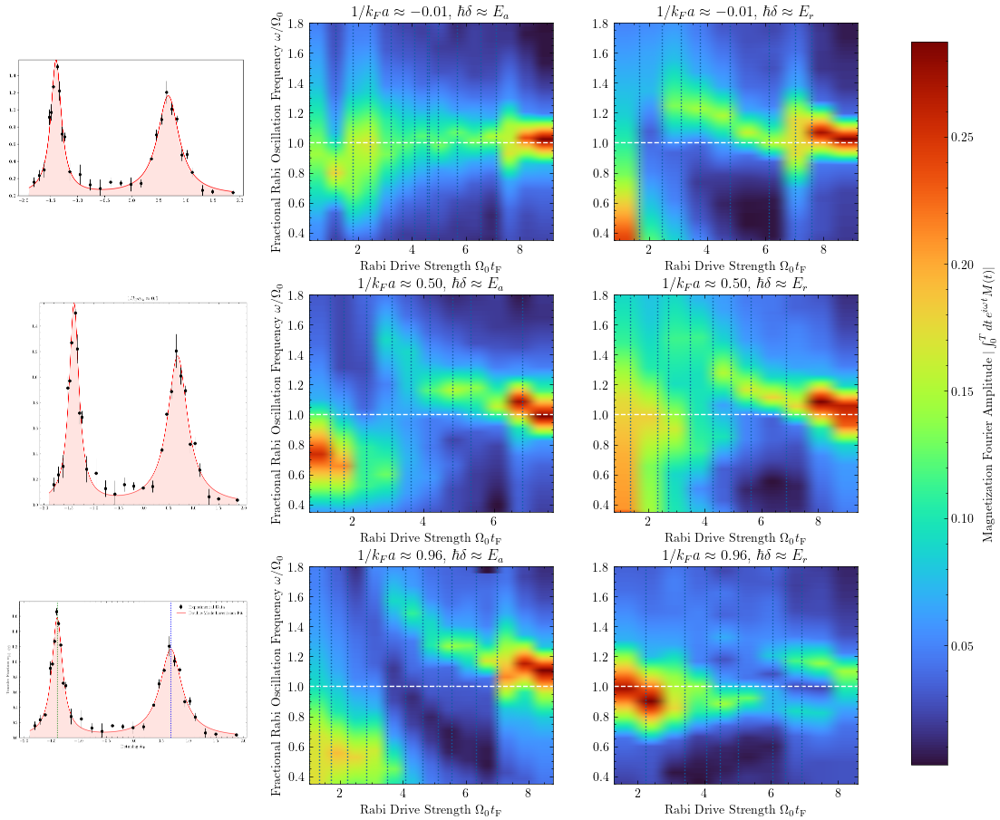

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg  # Import for loading images
import re
from pathlib import Path
from scipy.fft import rfft, rfftfreq
import scienceplots
plt.style.use(['science'])

# --- Define Parameters ---
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- NEW: List of spectrum images to load ---
# This list must be in the same order as inv_kFa_arr
spectrum_image_files = [
    "spectrum_kFa_-0.01.png", 
    "spectrum_kFa_0.5.png", 
    "spectrum_kFa_0.96.png"
]

# --- Create figure & axes grid ---
# Create a 3x3 grid as before
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
plt.subplots_adjust(left=0.08, right=0.92, top=0.92, bottom=0.08,
                    wspace=0.25, hspace=0.25)

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if
            text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    
    # --- NEW: Load and plot the spectrum image in column 0 ---
    ax_spec = axes[i_inv, 0]
    img_file = spectrum_image_files[i_inv]
    try:
        img = mpimg.imread(img_file)
        ax_spec.imshow(img)
        ax_spec.axis('off') # Turn off ticks and labels for the image
    except FileNotFoundError:
        print(f"Warning: Image file not found: {img_file}")
        ax_spec.text(0.5, 0.5, f'Image not found:\n{img_file}', 
                     ha='center', va='center', color='red', fontsize=8)
        ax_spec.set_xticks([])
        ax_spec.set_yticks([])
    
    # --- Existing loop for plotting heatmaps in columns 1 and 2 ---
    for j_det, Δ in enumerate(Δ_arr):
        # Construct the path using pathlib for better cross-platform compatibility
        # Note: Using forward slashes is generally safer.
        time_series_path = Path(f'time_series_data/invkFa_{inv_kFa:.2f}_{Δ}')
        
        Ω0_tF_arr_exp = []

        # Check if directory exists before trying to glob
        if time_series_path.is_dir():
            # Collect Ω0_tF values from filenames
            for file in sorted(time_series_path.glob('*.csv'),
                               key=lambda x: natural_sort_key(x.name)):
                match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
                if match:
                    Ω0_tF_arr_exp.append(float(match.group(1)))
            
            Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
            
            # Continue only if files were found
            if Ω0_tF_arr_exp.size > 0:
                N_Ω0_exp = Ω0_tF_arr_exp.size
                abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

                print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

                # --- Load data & compute Fourier amplitude ---
                for i, Ω0 in enumerate(Ω0_tF_arr_exp):
                    file_path = time_series_path / f'RabiOsc_Omega0EF_{Ω0:.2f}.csv'
                    try:
                        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                            file_path,
                            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                        )
                        t_exp = tus[1:] * 1e-6
                        t_tF_exp = t_tF[1:]
                        M_exp_0 = M_exp[1:]

                        M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
                        ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
                        ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

                        abs_M_exp_0_hat_interp[i, :] = np.interp(
                            ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                            left=0, right=0
                        )
                    except FileNotFoundError:
                        print(f"Warning: File not found {file_path}")
                    except ValueError as e:
                        print(f"Warning: Error loading {file_path}. {e}")
                        
                # --- Plot ---
                # Plot on axes[i_inv, j_det + 1]
                # This plots in columns 1 and 2
                ax = axes[i_inv, j_det + 1]
                im = ax.imshow(
                    abs_M_exp_0_hat_interp.T,
                    aspect='auto',
                    cmap='turbo',
                    extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                            ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
                    origin='lower',
                )
                
                # *** THIS IS THE CORRECTED LINE ***
                ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                            color='white', linestyles='dashed')
                
                for Ω0_tF in Ω0_tF_arr_exp:
                    ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                                ymax=ω_Ω0_arr_exp.max(), linestyles='dotted')

                ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
                ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
                
                # Added braces around {F} for mathtext
                ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\mathrm{F}}$') 
                
                # Only set y-label for the new first column of plots (column index 1)
                if j_det == 0:
                    ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')

                # Build the title string in parts to avoid LaTeX/format conflicts
                title_str = fr'$1/k_Fa\approx{inv_kFa:.2f}$, $\hbar\delta\approx E_{Δ}$'
                ax.set_title(title_str)
                
            else:
                print(f"Warning: No data files found for {inv_kFa=}, {Δ=}")
                # Optionally turn off the unused axis
                ax = axes[i_inv, j_det + 1]
                ax.text(0.5, 0.5, 'Heatmap Data Not Found', ha='center', va='center', color='red')
                ax.axis('off')
        else:
            print(f"Warning: Directory not found {time_series_path}")
            # Optionally turn off the unused axes
            ax = axes[i_inv, j_det + 1]
            ax.text(0.5, 0.5, 'Data Directory Not Found', ha='center', va='center', color='red')
            ax.axis('off')

# --- Shared colorbar & title ---
# Check if 'im' exists in case no heatmap data was found/plotted
if 'im' in locals():
    # 'im' will be from the last successful plot
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95,
                        label=r'DFT Amplitude $|M(\omega)|$')
else:
    print("Warning: No heatmaps were plotted, so no colorbar will be drawn.")
    
#fig.suptitle('Experimental Rabi Oscillation Heat Maps')

# --- Save correctly ---
#fig.savefig('Rabi_Osc_Heatmaps_with_Spectra_Images.png', dpi=1000)
# plt.close(fig)
plt.show()
#print("Plot saved as 'Rabi_Osc_Heatmaps_with_Spectra_Images.png'")

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


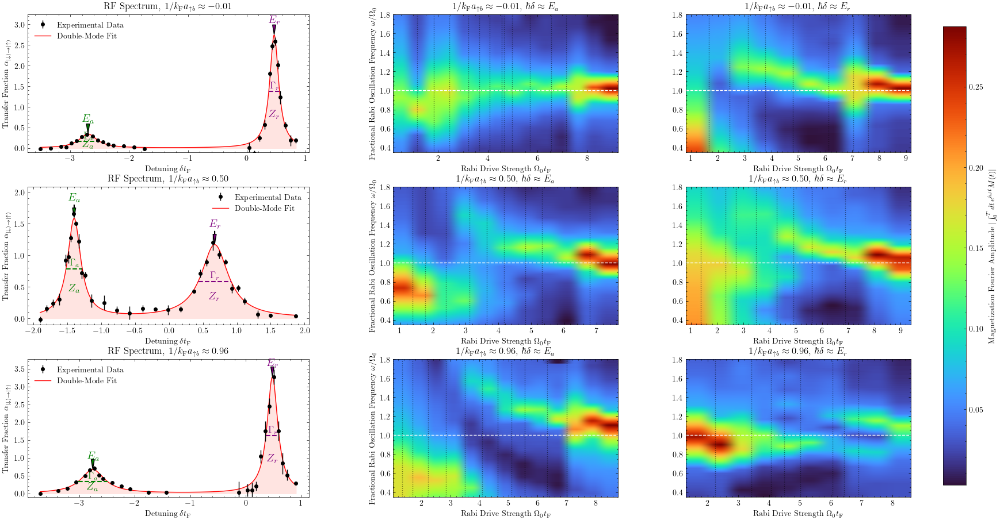

Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra.png'


In [50]:
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path
from scipy.fft import rfft, rfftfreq
from scipy.optimize import curve_fit
import scienceplots
plt.style.use(['science'])

# ===================================================================
# --- Helper Functions & Constants for Spectra (from Script 2) ---
# ===================================================================

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Constants ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# --- Guesses for Fitting ---
# I'm using the guesses you provided for inv_kFa=0.50 for all three.
# You may need to create unique guesses for -0.01 and 0.96 if the fits fail.
p0_guess = (-2.76, 0.42, 0.4, 0.6, 0.56, 0.29) # (Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF)

p0_guesses = {
    "-0.01": p0_guess,
    "0.50": p0_guess,
    "0.96": p0_guess,
}

# ===================================================================
# --- Main Plotting Script (Combined) ---
# ===================================================================

# --- Define Parameters ---
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Create figure & axes grid ---
fig, axes = plt.subplots(3, 3, figsize=(20, 10)) # Increased width for the new column
plt.subplots_adjust(left=0.06, right=0.94, top=0.92, bottom=0.08,
                    wspace=0.3, hspace=0.25) # Adjusted spacing

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if
            text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    
    # ======================================================
    # --- 1. Plot Spectrum in Column 0 ---
    # ======================================================
    ax_spec = axes[i_inv, 0] # Get the axis for the left column
    inv_kFa_str = f"{inv_kFa:.2f}"
    spec_file_path = Path(f'C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\inv_kFa_{inv_kFa_str}.csv')
    
    try:
        # --- Load Data ---
        delta_tF_arr, alpha, alphaerr = np.loadtxt(
            spec_file_path, dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        
        # --- Fitting ---
        p0 = p0_guesses[inv_kFa_str]
        popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=p0)

        # --- Plot Data ---
        ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', 
                         label='Experimental Data', color='black', zorder=10, ms=4) # Smaller markersize

        # --- Plot Fit ---
        x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
        y_fit = fit(x_fit, *popt)
        ax_spec.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
        ax_spec.plot(x_fit, y_fit, '-', label='Double-Mode Fit', color='red', zorder=5)

        # --- Annotations (Adjusted for subplots) ---
        color_a = 'green'
        color_r = 'purple'
        Ea_fit, Er_fit, Za_fit, Zr_fit, Gamma_a_fit, Gamma_r_fit = popt
        
        # Get y-value of the *total fit* at the peak centers
        peak_a_y = fit(Ea_fit, *popt)
        peak_r_y = fit(Er_fit, *popt)
        
        # FWHM y-levels (based on *individual* peak amplitudes)
        A_a_fit = 2 * Za_fit / Gamma_a_fit
        A_r_fit = 2 * Zr_fit / Gamma_r_fit
        fwhm_y_a = A_a_fit / 2
        fwhm_y_r = A_r_fit / 2

        # FWHM lines (Gamma_a, Gamma_r)
        xmin_a = Ea_fit - Gamma_a_fit / 2
        xmax_a = Ea_fit + Gamma_a_fit / 2
        ax_spec.hlines(y=fwhm_y_a, xmin=xmin_a, xmax=xmax_a, 
                       color=color_a, linestyle='--', linewidth=1.5, zorder=6)
        ax_spec.text(Ea_fit, fwhm_y_a + 0.03, r'$\Gamma_a$', 
                       ha='center', va='bottom', color=color_a, fontsize=12)

        xmin_r = Er_fit - Gamma_r_fit / 2
        xmax_r = Er_fit + Gamma_r_fit / 2
        ax_spec.hlines(y=fwhm_y_r, xmin=xmin_r, xmax=xmax_r, 
                       color=color_r, linestyle='--', linewidth=1.5, zorder=6)
        ax_spec.text(Er_fit, fwhm_y_r + 0.03, r'$\Gamma_r$', 
                       ha='center', va='bottom', color=color_r, fontsize=12)

        # Energy labels (E_a, E_r) with arrows
        ax_spec.annotate(r'$E_a$', xy=(Ea_fit, peak_a_y), 
                         xytext=(Ea_fit, peak_a_y + 0.25), 
                         ha='center', va='bottom', fontsize=14, color=color_a,
                         arrowprops=dict(facecolor=color_a, shrink=0.05, 
                                         width=0.5, headwidth=4, linestyle='-'))

        ax_spec.annotate(r'$E_r$', xy=(Er_fit, peak_r_y), 
                         xytext=(Er_fit, peak_r_y + 0.25), 
                         ha='center', va='bottom', fontsize=14, color=color_r,
                         arrowprops=dict(facecolor=color_r, shrink=0.05, 
                                         width=0.5, headwidth=4, linestyle='-'))

        # Quasiparticle Residue labels (Z_a, Z_r)
        ax_spec.text(Ea_fit, peak_a_y * 0.3, r'$Z_a$', 
                       color=color_a, ha='center', va='center', fontsize=14, weight='bold')
        ax_spec.text(Er_fit, peak_r_y * 0.3, r'$Z_r$', 
                       color=color_r, ha='center', va='center', fontsize=14, weight='bold')

        # --- Labels and Settings ---
        ax_spec.set_xlabel(r'Detuning $\delta t_{\mathrm{F}}$')
        ax_spec.set_ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')
        max_y = max(peak_a_y, peak_r_y)
        ax_spec.set_ylim(bottom=-0.1, top=max_y + 0.5)
        ax_spec.set_title(fr'RF Spectrum, $1/k_{{\text F}}a_{{\uparrow b}}\approx{inv_kFa:.2f}$')
        
        handles, labels = ax_spec.get_legend_handles_labels()
        order = [1, 0]
        ax_spec.legend([handles[idx] for idx in order], [labels[idx] for idx in order], fontsize=10)

    except (IOError, FileNotFoundError):
        print(f"Warning: Spectrum file not found: {spec_file_path}")
        ax_spec.text(0.5, 0.5, 'Spectrum Data Not Found', ha='center', va='center', color='red')
        ax_spec.axis('off')
    except (RuntimeError, ValueError) as e:
        print(f"Warning: Fit failed for {spec_file_path}. {e}")
        ax_spec.text(0.5, 0.5, 'Spectrum Fit Failed', ha='center', va='center', color='red')
        ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', color='black') # Plot data anyway
        ax_spec.axis('on')


    # ======================================================
    # --- 2. Plot Heatmaps in Columns 1 and 2 ---
    # ======================================================
    for j_det, Δ in enumerate(Δ_arr):
        time_series_path = Path(f'time_series_data/invkFa_{inv_kFa:.2f}_{Δ}')
        
        Ω0_tF_arr_exp = []

        if time_series_path.is_dir():
            for file in sorted(time_series_path.glob('*.csv'),
                               key=lambda x: natural_sort_key(x.name)):
                match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
                if match:
                    Ω0_tF_arr_exp.append(float(match.group(1)))
            
            Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
            
            if Ω0_tF_arr_exp.size > 0:
                N_Ω0_exp = Ω0_tF_arr_exp.size
                abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

                print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

                for i, Ω0 in enumerate(Ω0_tF_arr_exp):
                    file_path = time_series_path / f'RabiOsc_Omega0EF_{Ω0:.2f}.csv'
                    try:
                        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                            file_path,
                            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                        )
                        t_tF_exp = t_tF[1:]
                        M_exp_0 = M_exp[1:]

                        M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
                        ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
                        ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

                        abs_M_exp_0_hat_interp[i, :] = np.interp(
                            ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                            left=0, right=0
                        )
                    except FileNotFoundError:
                        print(f"Warning: File not found {file_path}")
                    except (ValueError, IndexError) as e: # Added IndexError for cases like empty data
                        print(f"Warning: Error loading {file_path}. {e}")
                        
                # --- Plot Heatmap ---
                ax = axes[i_inv, j_det + 1] # Plot in column 1 and 2
                im = ax.imshow(
                    abs_M_exp_0_hat_interp.T,
                    aspect='auto',
                    cmap='turbo',
                    extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                            ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
                    origin='lower',
                )
                ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                            color='white', linestyles='dashed')
                for Ω0_tF in Ω0_tF_arr_exp:
                    ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                                ymax=ω_Ω0_arr_exp.max(), linestyles='dotted', color='black', alpha=0.5)

                ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
                ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
                ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\text F}$')
                
                if j_det == 0: # Only set y-label for the first *heatmap* column
                    ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')

                ax.set_title(
                    fr'$1/k_{{\text F}}a_{{\uparrow b}}\approx{inv_kFa:.2f}$, '
                    fr'$\hbar\delta\approx E_{{{Δ}}}$' 
                )
            else:
                print(f"Warning: No data files found for {inv_kFa=}, {Δ=}")
                ax = axes[i_inv, j_det + 1]
                ax.text(0.5, 0.5, 'Heatmap Data Not Found', ha='center', va='center', color='red')
                ax.axis('off')
        else:
            print(f"Warning: Directory not found {time_series_path}")
            ax = axes[i_inv, j_det + 1]
            ax.text(0.5, 0.5, 'Data Directory Not Found', ha='center', va='center', color='red')
            ax.axis('off')

# ======================================================
# --- Shared colorbar & Final Touches ---
# ======================================================

# 'im' will be from the last successful heatmap plot
cbar = fig.colorbar(im, ax=axes[:, 1:].ravel().tolist(), shrink=0.95,
                    label=r'Magnetization Fourier Amplitude $|\int_0^T dt\, e^{i\omega t}M(t)|$')

# --- Save correctly ---
#fig.savefig('Rabi_Osc_Heatmaps_and_Spectra.png', dpi=600)
#plt.close(fig)
plt.show()
print("Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra.png'")

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


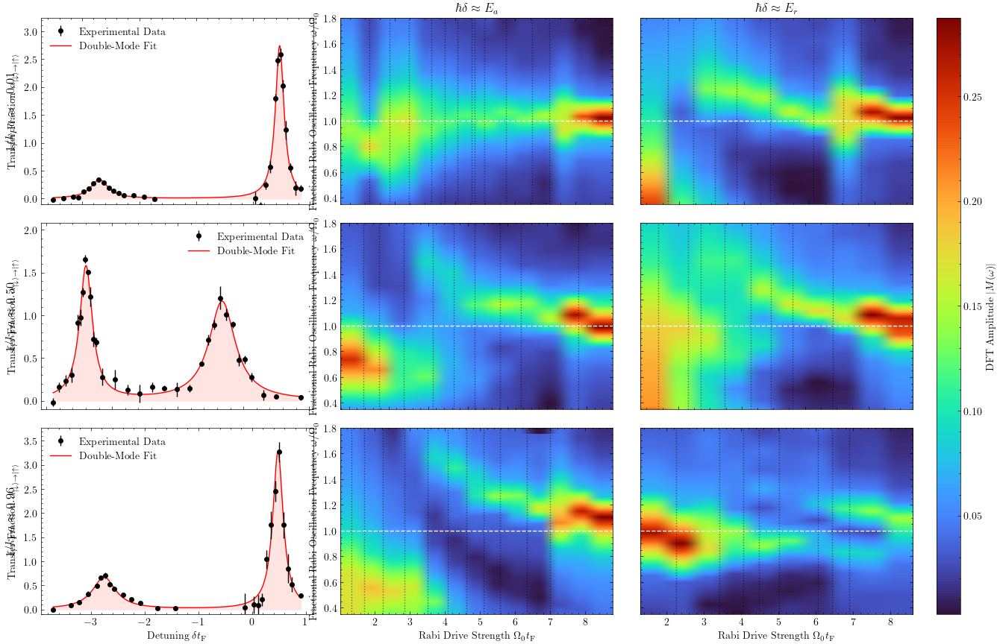

Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra_Compact.png'


In [53]:
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path
from scipy.fft import rfft, rfftfreq
from scipy.optimize import curve_fit
import scienceplots
plt.style.use(['science'])

# ===================================================================
# --- Helper Functions & Constants for Spectra (from Script 2) ---
# ===================================================================

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Constants ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# --- Guesses for Fitting ---
p0_guess = (-2.76, 0.42, 0.4, 0.6, 0.56, 0.29) # (Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF)

p0_guesses = {
    "-0.01": p0_guess,
    "0.50": p0_guess,
    "0.96": p0_guess,
}

# ===================================================================
# --- Main Plotting Script (Combined) ---
# ===================================================================

# --- Define Parameters ---
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Create figure & axes grid ---
# Changed figsize to be more square, adjusted spacing for compactness
fig, axes = plt.subplots(3, 3, figsize=(16, 10)) 
plt.subplots_adjust(left=0.12, right=0.85, top=0.9, bottom=0.1,
                    wspace=0.1, hspace=0.1) # Compact spacing

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if
            text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    
    # ======================================================
    # --- 1. Plot Spectrum in Column 0 ---
    # ======================================================
    ax_spec = axes[i_inv, 0] # Get the axis for the left column
    inv_kFa_str = f"{inv_kFa:.2f}"
    spec_file_path = Path(f'C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\inv_kFa_{inv_kFa_str}.csv')
    
    try:
        # --- Load Data ---
        delta_tF_arr, alpha, alphaerr = np.loadtxt(
            spec_file_path, dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        
        # --- Fitting ---
        p0 = p0_guesses[inv_kFa_str]
        popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=p0)

        # --- Plot Data ---
        ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', 
                         label='Experimental Data', color='black', zorder=10, ms=4) # Smaller markersize

        # --- Plot Fit ---
        x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
        y_fit = fit(x_fit, *popt)
        ax_spec.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
        ax_spec.plot(x_fit, y_fit, '-', label='Double-Mode Fit', color='red', zorder=5)

        # --- REMOVED ALL ANNOTATIONS (E_a, Z_a, Gamma_a, etc.) ---

        # --- Labels and Settings ---
        # Keep Y label
        ax_spec.set_ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')
        
        # ONLY show X label for the bottom row
        if i_inv == 2:
            ax_spec.set_xlabel(r'Detuning $\delta t_{\mathrm{F}}$')
        else:
            ax_spec.set_xticklabels([])

        # Get y-values for setting limits
        Ea_fit, Er_fit = popt[0], popt[1]
        peak_a_y = fit(Ea_fit, *popt)
        peak_r_y = fit(Er_fit, *popt)
        max_y = max(peak_a_y, peak_r_y)
        ax_spec.set_ylim(bottom=-0.1, top=max_y + 0.5)
        
        # REMOVED TITLE
        
        handles, labels = ax_spec.get_legend_handles_labels()
        order = [1, 0]
        ax_spec.legend([handles[idx] for idx in order], [labels[idx] for idx in order], fontsize=10)

    except (IOError, FileNotFoundError):
        print(f"Warning: Spectrum file not found: {spec_file_path}")
        ax_spec.text(0.5, 0.5, 'Spectrum Data Not Found', ha='center', va='center', color='red')
        ax_spec.axis('off')
    except (RuntimeError, ValueError) as e:
        print(f"Warning: Fit failed for {spec_file_path}. {e}")
        ax_spec.text(0.5, 0.5, 'Spectrum Fit Failed', ha='center', va='center', color='red')
        if 'delta_tF_arr' in locals():
            ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', color='black') # Plot data anyway
        ax_spec.axis('on')


    # ======================================================
    # --- 2. Plot Heatmaps in Columns 1 and 2 ---
    # ======================================================
    for j_det, Δ in enumerate(Δ_arr):
        time_series_path = Path(f'time_series_data/invkFa_{inv_kFa:.2f}_{Δ}')
        
        Ω0_tF_arr_exp = []

        if time_series_path.is_dir():
            for file in sorted(time_series_path.glob('*.csv'),
                               key=lambda x: natural_sort_key(x.name)):
                match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
                if match:
                    Ω0_tF_arr_exp.append(float(match.group(1)))
            
            Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
            
            if Ω0_tF_arr_exp.size > 0:
                N_Ω0_exp = Ω0_tF_arr_exp.size
                abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

                print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

                for i, Ω0 in enumerate(Ω0_tF_arr_exp):
                    file_path = time_series_path / f'RabiOsc_Omega0EF_{Ω0:.2f}.csv'
                    try:
                        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                            file_path,
                            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                        )
                        t_tF_exp = t_tF[1:]
                        M_exp_0 = M_exp[1:]

                        M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
                        ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
                        ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

                        abs_M_exp_0_hat_interp[i, :] = np.interp(
                            ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                            left=0, right=0
                        )
                    except FileNotFoundError:
                        print(f"Warning: File not found {file_path}")
                    except (ValueError, IndexError) as e: # Added IndexError for cases like empty data
                        print(f"Warning: Error loading {file_path}. {e}")
                        
                # --- Plot Heatmap ---
                ax = axes[i_inv, j_det + 1] # Plot in column 1 and 2
                im = ax.imshow(
                    abs_M_exp_0_hat_interp.T,
                    aspect='auto',
                    cmap='turbo',
                    extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                            ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
                    origin='lower',
                )
                ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                            color='white', linestyles='dashed')
                for Ω0_tF in Ω0_tF_arr_exp:
                    ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                                ymax=ω_Ω0_arr_exp.max(), linestyles='dotted', color='black', alpha=0.5)

                ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
                ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
                
                # ONLY show X label for the bottom row
                if i_inv == 2:
                    ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\mathrm{F}}$')
                else:
                    ax.set_xticklabels([])
                
                # ONLY show Y label for the first heatmap column
                if j_det == 0: 
                    ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
                else:
                    # Hide y-labels for the last column
                    ax.set_yticklabels([])

                # REMOVED TITLE
            
            else:
                print(f"Warning: No data files found for {inv_kFa=}, {Δ=}")
                ax = axes[i_inv, j_det + 1]
                ax.text(0.5, 0.5, 'Heatmap Data Not Found', ha='center', va='center', color='red')
                ax.axis('off')
        else:
            print(f"Warning: Directory not found {time_series_path}")
            ax = axes[i_inv, j_det + 1]
            ax.text(0.5, 0.5, 'Data Directory Not Found', ha='center', va='center', color='red')
            ax.axis('off')

# ======================================================
# --- Shared Labels & Colorbar ---
# ======================================================

# --- Add Column Titles (at the top) ---
axes[0, 1].set_title(r'$\hbar\delta\approx E_a$')
axes[0, 2].set_title(r'$\hbar\delta\approx E_r$')

# --- Add Row Annotations (on the left) ---
for i, (ax, inv_kFa) in enumerate(zip(axes[:, 0], inv_kFa_arr)):
    pos = ax.get_position()
    # Place text to the left of the first column
    # Use fr-string with double curly braces for LaTeX
    fig.text(pos.x0 - 0.02, (pos.y0 + pos.y1) / 2, 
             fr'$1/k_Fa\approx{inv_kFa:.2f}$', 
             ha='right', va='center', rotation='vertical', fontsize=12)

# --- Manually add a thinner colorbar ---
if 'im' in locals():
    # [left, bottom, width, height] in figure coordinates
    cbar_ax = fig.add_axes([0.87, 0.1, 0.02, 0.8]) 
    cbar = fig.colorbar(im, cax=cbar_ax, label=r"DFT Amplitude $|M(\omega)|$")
else:
    print("Warning: No heatmaps plotted, colorbar not drawn.")

# --- Save correctly ---
#fig.savefig('Rabi_Osc_Heatmaps_and_Spectra_Compact.png', dpi=600)
#plt.close(fig)
plt.show()
print("Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra_Compact.png'")

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


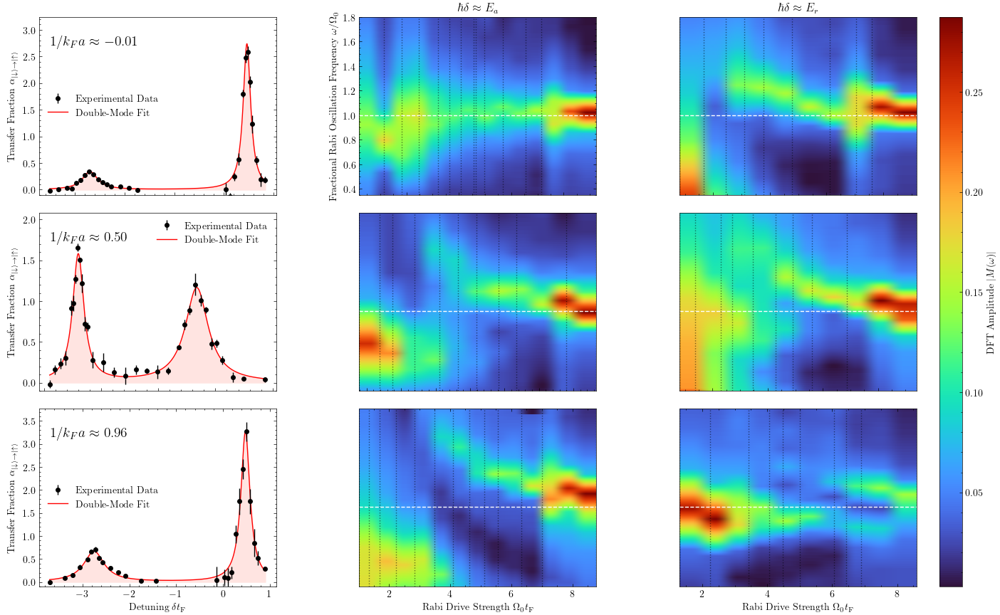

Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra_Refined.png'


In [55]:
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path
from scipy.fft import rfft, rfftfreq
from scipy.optimize import curve_fit
import scienceplots
plt.style.use(['science'])

# ===================================================================
# --- Helper Functions & Constants for Spectra (from Script 2) ---
# ===================================================================

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Constants ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# --- Guesses for Fitting ---
p0_guess = (-2.76, 0.42, 0.4, 0.6, 0.56, 0.29) # (Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF)

p0_guesses = {
    "-0.01": p0_guess,
    "0.50": p0_guess,
    "0.96": p0_guess,
}

# ===================================================================
# --- Main Plotting Script (Combined) ---
# ===================================================================

# --- Define Parameters ---
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Create figure & axes grid ---
fig, axes = plt.subplots(3, 3, figsize=(16, 10)) 
# Adjusted wspace to provide more room, especially between col 0 and 1
plt.subplots_adjust(left=0.08, right=0.85, top=0.9, bottom=0.1,
                    wspace=0.35, hspace=0.1) # Increased wspace

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if
            text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    
    # ======================================================
    # --- 1. Plot Spectrum in Column 0 ---
    # ======================================================
    ax_spec = axes[i_inv, 0] # Get the axis for the left column
    inv_kFa_str = f"{inv_kFa:.2f}"
    spec_file_path = Path(f'C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\inv_kFa_{inv_kFa_str}.csv')
    
    try:
        # --- Load Data ---
        delta_tF_arr, alpha, alphaerr = np.loadtxt(
            spec_file_path, dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        
        # --- Fitting ---
        p0 = p0_guesses[inv_kFa_str]
        popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=p0)

        # --- Plot Data ---
        ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', 
                         label='Experimental Data', color='black', zorder=10, ms=4) # Smaller markersize

        # --- Plot Fit ---
        x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
        y_fit = fit(x_fit, *popt)
        ax_spec.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
        ax_spec.plot(x_fit, y_fit, '-', label='Double-Mode Fit', color='red', zorder=5)

        # --- NEW: Add 1/kFa label directly inside spectra plot ---
        ax_spec.text(0.05, 0.9, # Coordinates (fraction of x and y axis)
                     fr'$1/k_Fa\approx{inv_kFa:.2f}$', 
                     transform=ax_spec.transAxes, # important for relative positioning
                     ha='left', va='top', fontsize=14, backgroundcolor='white') # fontsize set to 14

        # --- Labels and Settings ---
        ax_spec.set_ylabel(r'Transfer Fraction $\alpha_{|\downarrow\rangle\to|\uparrow\rangle}$')
        
        # ONLY show X label for the bottom row, but keep ticks for all rows
        if i_inv == 2:
            ax_spec.set_xlabel(r'Detuning $\delta t_{\mathrm{F}}$')
        else:
            ax_spec.set_xticklabels([])
            ax_spec.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True) # Keep ticks

        # Get y-values for setting limits
        Ea_fit, Er_fit = popt[0], popt[1]
        peak_a_y = fit(Ea_fit, *popt)
        peak_r_y = fit(Er_fit, *popt)
        max_y = max(peak_a_y, peak_r_y)
        ax_spec.set_ylim(bottom=-0.1, top=max_y + 0.5)
        
        handles, labels = ax_spec.get_legend_handles_labels()
        order = [1, 0]
        ax_spec.legend([handles[idx] for idx in order], [labels[idx] for idx in order], fontsize=10)

    except (IOError, FileNotFoundError):
        print(f"Warning: Spectrum file not found: {spec_file_path}")
        ax_spec.text(0.5, 0.5, 'Spectrum Data Not Found', ha='center', va='center', color='red')
        ax_spec.axis('off')
    except (RuntimeError, ValueError) as e:
        print(f"Warning: Fit failed for {spec_file_path}. {e}")
        ax_spec.text(0.5, 0.5, 'Spectrum Fit Failed', ha='center', va='center', color='red')
        if 'delta_tF_arr' in locals():
            ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', color='black') # Plot data anyway
        ax_spec.axis('on')


    # ======================================================
    # --- 2. Plot Heatmaps in Columns 1 and 2 ---
    # ======================================================
    for j_det, Δ in enumerate(Δ_arr):
        time_series_path = Path(f'time_series_data/invkFa_{inv_kFa:.2f}_{Δ}')
        
        Ω0_tF_arr_exp = []

        if time_series_path.is_dir():
            for file in sorted(time_series_path.glob('*.csv'),
                               key=lambda x: natural_sort_key(x.name)):
                match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
                if match:
                    Ω0_tF_arr_exp.append(float(match.group(1)))
            
            Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
            
            if Ω0_tF_arr_exp.size > 0:
                N_Ω0_exp = Ω0_tF_arr_exp.size
                abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

                print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

                for i, Ω0 in enumerate(Ω0_tF_arr_exp):
                    file_path = time_series_path / f'RabiOsc_Omega0EF_{Ω0:.2f}.csv'
                    try:
                        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                            file_path,
                            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                        )
                        t_tF_exp = t_tF[1:]
                        M_exp_0 = M_exp[1:]

                        M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
                        ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
                        ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

                        abs_M_exp_0_hat_interp[i, :] = np.interp(
                            ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                            left=0, right=0
                        )
                    except FileNotFoundError:
                        print(f"Warning: File not found {file_path}")
                    except (ValueError, IndexError) as e: # Added IndexError for cases like empty data
                        print(f"Warning: Error loading {file_path}. {e}")
                        
                # --- Plot Heatmap ---
                ax = axes[i_inv, j_det + 1] # Plot in column 1 and 2
                im = ax.imshow(
                    abs_M_exp_0_hat_interp.T,
                    aspect='auto',
                    cmap='turbo',
                    extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                            ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
                    origin='lower',
                )
                ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                            color='white', linestyles='dashed')
                for Ω0_tF in Ω0_tF_arr_exp:
                    ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                                ymax=ω_Ω0_arr_exp.max(), linestyles='dotted', color='black', alpha=0.5)

                ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
                ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
                
                # ONLY show X label for the bottom row, but keep ticks for all rows
                if i_inv == 2:
                    ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\mathrm{F}}$')
                else:
                    ax.set_xticklabels([])
                    ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True) # Keep ticks
                
                # Only show Y label for the top-left heatmap (column 1, row 0)
                if j_det == 0 and i_inv == 0: 
                    ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
                else:
                    # Hide y-labels and ticks for other heatmap columns/rows
                    ax.set_yticklabels([])
                    ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

            else:
                print(f"Warning: No data files found for {inv_kFa=}, {Δ=}")
                ax = axes[i_inv, j_det + 1]
                ax.text(0.5, 0.5, 'Heatmap Data Not Found', ha='center', va='center', color='red')
                ax.axis('off')
        else:
            print(f"Warning: Directory not found {time_series_path}")
            ax = axes[i_inv, j_det + 1]
            ax.text(0.5, 0.5, 'Data Directory Not Found', ha='center', va='center', color='red')
            ax.axis('off')

# ======================================================
# --- Shared Labels & Colorbar ---
# ======================================================

# --- Add Column Titles (at the top) ---
axes[0, 1].set_title(r'$\hbar\delta\approx E_a$')
axes[0, 2].set_title(r'$\hbar\delta\approx E_r$')

# --- REMOVED ROW ANNOTATIONS as they were moved inside spectra plots ---

# --- Manually add a thinner colorbar ---
if 'im' in locals():
    # [left, bottom, width, height] in figure coordinates
    cbar_ax = fig.add_axes([0.87, 0.1, 0.02, 0.8]) 
    cbar = fig.colorbar(im, cax=cbar_ax, label=r"DFT Amplitude $|M(\omega)|$")
else:
    print("Warning: No heatmaps plotted, colorbar not drawn.")

# --- Save correctly ---
#fig.savefig('Rabi_Osc_Heatmaps_and_Spectra_Refined.png', dpi=600)
#plt.close(fig)
plt.show()
print("Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra_Refined.png'")

At inv_kFa=np.float64(-0.01), Δ=np.str_('a'): Number of Experimental Ω_0: 14, Number of ω: 100000
At inv_kFa=np.float64(-0.01), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('a'): Number of Experimental Ω_0: 11, Number of ω: 100000
At inv_kFa=np.float64(0.5), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('a'): Number of Experimental Ω_0: 13, Number of ω: 100000
At inv_kFa=np.float64(0.96), Δ=np.str_('r'): Number of Experimental Ω_0: 10, Number of ω: 100000


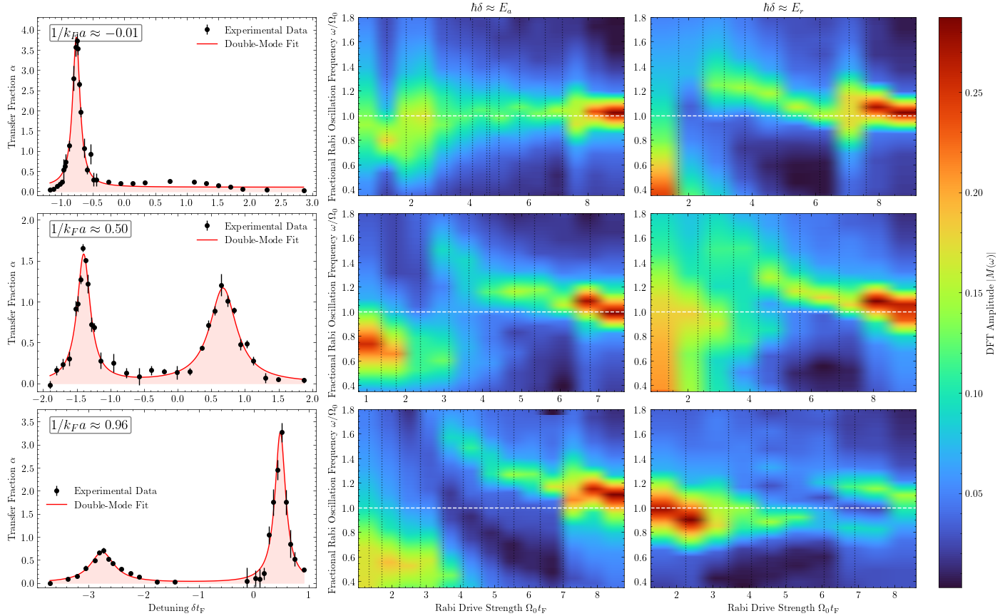

Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra_Refined_v2.png'


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path
from scipy.fft import rfft, rfftfreq
from scipy.optimize import curve_fit
import scienceplots
plt.style.use(['science'])
from matplotlib.gridspec import GridSpec # Import GridSpec

# ===================================================================
# --- Helper Functions & Constants for Spectra (from Script 2) ---
# ===================================================================

def Lorentzian(x, E0, Z, Gamma):
    # Note: With this definition, the peak Amplitude A = 2*Z/Gamma
    # and the FWHM is indeed Gamma.
    return Z * (Gamma/2) /((x-E0)**2 + (Gamma/2)**2)

def fit(x, Ea, Er, Za, Zr, Γa, Γr):
    return Lorentzian(x, Ea, Za, Γa) + Lorentzian(x, Er, Zr, Γr)

# --- Constants ---
h = 6.62607015e-34 # J*s
ℏ = h/(2*np.pi)
EF = h*6.1*1e3
tF = ℏ/EF

# --- Guesses for Fitting ---
p0_guess = (-2.76, 0.42, 0.4, 0.6, 0.56, 0.29) # (Ea/EF, Er/EF, Za, Zr, Γa/EF, Γr/EF)

p0_guesses = {
    "-0.01": p0_guess,
    "0.50": p0_guess,
    "0.96": p0_guess,
}

# ===================================================================
# --- Main Plotting Script (Combined) ---
# ===================================================================

# --- Define Parameters ---
min_ω_Ω0 = 0.35
max_ω_Ω0 = 1.8
N_ω_exp = int(1e5)
ω_Ω0_arr_exp = np.linspace(min_ω_Ω0, max_ω_Ω0, N_ω_exp)
inv_kFa_arr = np.array([-0.01, 0.50, 0.96])
Δ_arr = np.array(['a', 'r'])

# --- Create figure & axes grid ---
fig = plt.figure(figsize=(16, 10))

# Define a main GridSpec: 1 row, 2 main columns.
# The right column is twice as wide (width_ratios=[1, 2]).
# The space between these 2 main columns (col 0 and 1) is wspace=0.15.
gs_main = GridSpec(1, 2, figure=fig, width_ratios=[1, 2],
                   wspace=0.1,
                   left=0.08, right=0.85, top=0.9, bottom=0.1)

# Create a nested grid for the left column (3 rows, 1 col)
gs_left = gs_main[0].subgridspec(3, 1, hspace=0.1)

# Create a nested grid for the right columns (3 rows, 2 cols)
# The space *within* this grid (between col 1 and 2) is wspace=0.1.
gs_right = gs_main[1].subgridspec(3, 2, wspace=0.1, hspace=0.1)

# Create the axes array manually to match the rest of the code
axes = np.empty((3, 3), dtype=object)
for i in range(3):
    axes[i, 0] = fig.add_subplot(gs_left[i, 0])   # Spectrum plot (col 0)
    axes[i, 1] = fig.add_subplot(gs_right[i, 0])  # Heatmap 1 (col 1)
    axes[i, 2] = fig.add_subplot(gs_right[i, 1])  # Heatmap 2 (col 2)

# --- Helper for natural sorting ---
def natural_sort_key(s):
    return [int(text) if
            text.isdigit() else text.lower()
            for text in re.split('([0-9]+)', str(s))]

# --- Loop over interaction & detuning types ---
for i_inv, inv_kFa in enumerate(inv_kFa_arr):
    
    # ======================================================
    # --- 1. Plot Spectrum in Column 0 ---
    # ======================================================
    ax_spec = axes[i_inv, 0] # Get the axis for the left column
    inv_kFa_str = f"{inv_kFa:.2f}"
    spec_file_path = Path(f'C:\\Users\\weidu\\OneDrive\\Documents\\Personal STEM Projects\\Quantum_Gases\\RF_spectra\\inv_kFa_{inv_kFa_str}.csv')
    
    try:
        # --- Load Data ---
        delta_tF_arr, alpha, alphaerr = np.loadtxt(
            spec_file_path, dtype=np.float64, delimiter=',', skiprows=1, unpack=True
        )
        
        # --- Fitting ---
        p0 = p0_guesses[inv_kFa_str]
        popt, pcov = curve_fit(fit, delta_tF_arr, alpha, p0=p0)

        # --- Plot Data ---
        ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', 
                         label='Experimental Data', color='black', zorder=10, ms=4) # Smaller markersize

        # --- Plot Fit ---
        x_fit = np.linspace(delta_tF_arr.min(), delta_tF_arr.max(), int(1e3))
        y_fit = fit(x_fit, *popt)
        ax_spec.fill_between(x_fit, y_fit, color='mistyrose', zorder=1)
        ax_spec.plot(x_fit, y_fit, '-', label='Double-Mode Fit', color='red', zorder=5)

        # --- NEW: Add 1/kFa label directly inside spectra plot ---
        ax_spec.text(0.05, 0.95, # Coordinates (fraction of x and y axis)
                     fr'$1/k_Fa\approx{inv_kFa:.2f}$', 
                     transform=ax_spec.transAxes, # important for relative positioning
                     ha='left', va='top', fontsize=14, 
                     bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.1')) # Added white background

        # --- Labels and Settings ---
        ax_spec.set_ylabel(r'Transfer Fraction $\alpha$')
        
        # ONLY show X axis text label for the bottom row
        if i_inv == 2:
            ax_spec.set_xlabel(r'Detuning $\delta t_{\mathrm{F}}$')
        # *** All tick labels (numbers) are kept by default ***

        # Get y-values for setting limits
        Ea_fit, Er_fit = popt[0], popt[1]
        peak_a_y = fit(Ea_fit, *popt)
        peak_r_y = fit(Er_fit, *popt)
        max_y = max(peak_a_y, peak_r_y)
        ax_spec.set_ylim(bottom=-0.1, top=max_y + 0.5)
        
        handles, labels = ax_spec.get_legend_handles_labels()
        order = [1, 0]
        ax_spec.legend([handles[idx] for idx in order], [labels[idx] for idx in order], fontsize=10)

    except (IOError, FileNotFoundError):
        print(f"Warning: Spectrum file not found: {spec_file_path}")
        ax_spec.text(0.5, 0.5, 'Spectrum Data Not Found', ha='center', va='center', color='red')
        ax_spec.axis('off')
    except (RuntimeError, ValueError) as e:
        print(f"Warning: Fit failed for {spec_file_path}. {e}")
        ax_spec.text(0.5, 0.5, 'Spectrum Fit Failed', ha='center', va='center', color='red')
        if 'delta_tF_arr' in locals():
            ax_spec.errorbar(delta_tF_arr, alpha, yerr=np.abs(alphaerr), fmt='o', color='black') # Plot data anyway
        ax_spec.axis('on')


    # ======================================================
    # --- 2. Plot Heatmaps in Columns 1 and 2 ---
    # ======================================================
    for j_det, Δ in enumerate(Δ_arr):
        time_series_path = Path(f'time_series_data/invkFa_{inv_kFa:.2f}_{Δ}')
        
        Ω0_tF_arr_exp = []

        if time_series_path.is_dir():
            for file in sorted(time_series_path.glob('*.csv'),
                               key=lambda x: natural_sort_key(x.name)):
                match = re.search(r'RabiOsc_Omega0EF_([\d\.]+)\.csv', file.name)
                if match:
                    Ω0_tF_arr_exp.append(float(match.group(1)))
            
            Ω0_tF_arr_exp = np.array(Ω0_tF_arr_exp)
            
            if Ω0_tF_arr_exp.size > 0:
                N_Ω0_exp = Ω0_tF_arr_exp.size
                abs_M_exp_0_hat_interp = np.zeros((N_Ω0_exp, N_ω_exp))

                print(f'At {inv_kFa=}, {Δ=}: Number of Experimental Ω_0: {N_Ω0_exp}, Number of ω: {N_ω_exp}')

                for i, Ω0 in enumerate(Ω0_tF_arr_exp):
                    file_path = time_series_path / f'RabiOsc_Omega0EF_{Ω0:.2f}.csv'
                    try:
                        tus, t_tF, M_exp, M_exp_err = np.loadtxt(
                            file_path,
                            dtype=np.float64, delimiter=',', skiprows=1, unpack=True
                        )
                        t_tF_exp = t_tF[1:]
                        M_exp_0 = M_exp[1:]

                        M_exp_0_hat = rfft(M_exp_0) / M_exp_0.size
                        ω_tF_exp_arr = 2 * np.pi * rfftfreq(M_exp_0.size, d=t_tF_exp[1] - t_tF_exp[0])
                        ω_tF_arr_interp = ω_Ω0_arr_exp * Ω0_tF_arr_exp[i]

                        abs_M_exp_0_hat_interp[i, :] = np.interp(
                            ω_tF_arr_interp, ω_tF_exp_arr, np.abs(M_exp_0_hat),
                            left=0, right=0
                        )
                    except FileNotFoundError:
                        print(f"Warning: File not found {file_path}")
                    except (ValueError, IndexError) as e: # Added IndexError for cases like empty data
                        print(f"Warning: Error loading {file_path}. {e}")
                        
                # --- Plot Heatmap ---
                ax = axes[i_inv, j_det + 1] # Plot in column 1 and 2
                im = ax.imshow(
                    abs_M_exp_0_hat_interp.T,
                    aspect='auto',
                    cmap='turbo',
                    extent=[Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max(),
                            ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max()],
                    origin='lower',
                )
                ax.hlines(y=1, xmin=Ω0_tF_arr_exp.min(), xmax=Ω0_tF_arr_exp.max(),
                            color='white', linestyles='dashed')
                for Ω0_tF in Ω0_tF_arr_exp:
                    ax.vlines(x=Ω0_tF, ymin=ω_Ω0_arr_exp.min(),
                                ymax=ω_Ω0_arr_exp.max(), linestyles='dotted', color='black', alpha=0.5)

                ax.set_xlim(Ω0_tF_arr_exp.min(), Ω0_tF_arr_exp.max())
                ax.set_ylim(ω_Ω0_arr_exp.min(), ω_Ω0_arr_exp.max())
                
                # ONLY show X axis text label for the bottom row
                if i_inv == 2:
                    ax.set_xlabel(r'Rabi Drive Strength $\Omega_0 t_{\mathrm{F}}$')
                
                # ONLY show Y axis text label for the first heatmap column (j_det == 0)
                if j_det == 0: 
                    ax.set_ylabel(r'Fractional Rabi Oscillation Frequency $\omega/\Omega_0$')
                
                # *** All tick labels (numbers) are kept by default ***
                # *** Removed all set_xticklabels and set_yticklabels calls ***

            else:
                print(f"Warning: No data files found for {inv_kFa=}, {Δ=}")
                ax = axes[i_inv, j_det + 1]
                ax.text(0.5, 0.5, 'Heatmap Data Not Found', ha='center', va='center', color='red')
                ax.axis('off')
        else:
            print(f"Warning: Directory not found {time_series_path}")
            ax = axes[i_inv, j_det + 1]
            ax.text(0.5, 0.5, 'Data Directory Not Found', ha='center', va='center', color='red')
            ax.axis('off')

# ======================================================
# --- Shared Labels & Colorbar ---
# ======================================================

# --- Add Column Titles (at the top) ---
axes[0, 1].set_title(r'$\hbar\delta\approx E_a$')
axes[0, 2].set_title(r'$\hbar\delta\approx E_r$')

# --- Manually add a thinner colorbar ---
if 'im' in locals():
    # [left, bottom, width, height] in figure coordinates
    cbar_ax = fig.add_axes([0.87, 0.1, 0.02, 0.8]) 
    cbar = fig.colorbar(im, cax=cbar_ax, label=r"DFT Amplitude $|M(\omega)|$")
else:
    print("Warning: No heatmaps plotted, colorbar not drawn.")

# --- Save correctly ---
fig.savefig('Rabi_Osc_Heatmaps_and_Spectra_Refined_v2.png', dpi=1000)
#plt.close(fig)
plt.show()
print("Plot saved as 'Rabi_Osc_Heatmaps_and_Spectra_Refined_v2.png'")